# Noise analysis

In [1]:
#%matplotlib notebook
%matplotlib inline
import bz2, os, time
from os import path
import numpy as np
from matplotlib import pyplot as plt
from scipy import stats, interpolate
from scipy.optimize import curve_fit
import matplotlib.dates as mdate
import pandas as pd
import seaborn as sns
from pathlib import Path
from PIL import Image
from IPython.display import display
# import scienceplots

# plt.style.use(['science','no-latex'])
# #from my_funcs import getfiles, natural_sort_key, cumsum_sma

sns.set_context("talk")

PLOT_DIR = Path("./plots")
PLOT_DIR.mkdir(exist_ok=True)

# DATA_DIR = Path("./data/Oszi/step3/")
# DATA_DIR.mkdir(exist_ok=True)

B1500A_DIR = Path("./data/B1500A/step1/")
#B1500A_DIR.mkdir(exist_ok=True)

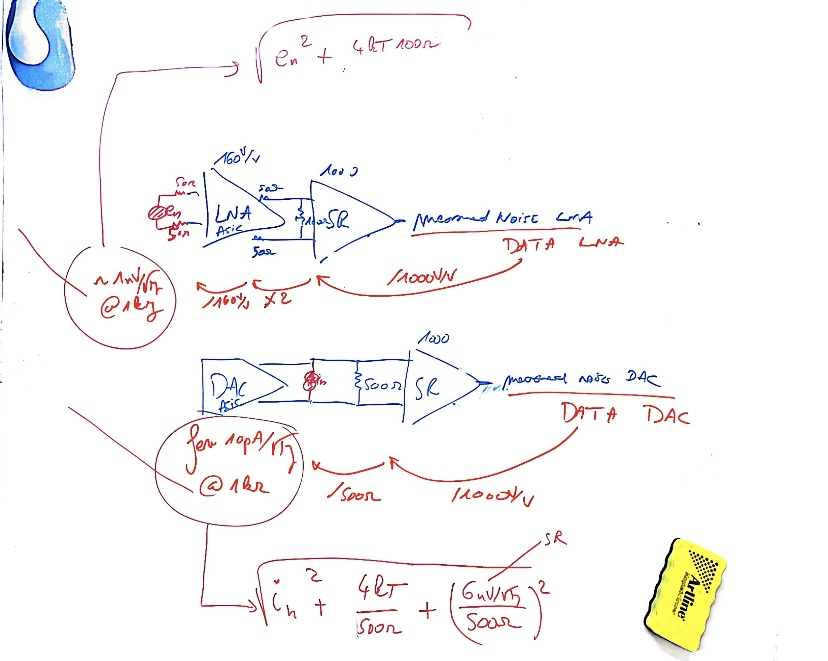

In [2]:
img = Image.open('img/IMG_5794.jpg')
display(img)

* Output data at LNA has been multiplied by 160 times by LNA, then divide by 2 by output resistors, then multiplied to 1000 by SR. Then to calculate the input noise, we follow the equation
  $$ \sqrt{S_V} = \frac{2 \cdot n_{out}}{1000 \cdot 160} = \frac{n_{out}}{80000} $$
  In fact, the noise is the combination of the intrinsic LNA voltage noise $e_n$ and thermal noise of the input resistors ($50 \Omega + 50 \Omega = 100 \Omega$ in differential), then
  $$ \sqrt{S_V} = \sqrt{e_n^2 + 4kT100} = \frac{n_{out}}{80000} \Rightarrow e_n = \sqrt{\frac{n_{out}^2}{80000^2} - 4kT100}  [V/\sqrt{Hz}]$$
  (T is the room temperature ($300 [K]$), k is the Boltzman constant $1.38 \times 10^ {-23} [J/K] $)

* Output data at DAC has been multiplied by $500 \Omega$ output resistor to convert from current to voltage noise, then multiplied by 1000 by SR.To calculate the input noise, we follow the equation
  $$ \sqrt{S_I} = \frac{n_{out}}{1000*500} = \frac{n_{out}}{500000} $$
  In fact, the noise is the combination of current noise $i_n$ and thermal noise of resistance, then the noise from SR (which is about $6nV/ \sqrt{Hz}$).
  $$ \sqrt{S_I} = \sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6 \times 10^{-9}}{500})} \Rightarrow i_n = \sqrt{\frac{n_{out}^2}{500000^2} - \frac{4kT}{500} - \frac{6 \times 10^{-9}}{500}} $$

In [3]:
DATA_DIR = './data/Oszi/'

## Plotting Raw Data (deleted some...)

In [4]:
def dat_conv(data, type):
    k = 1.38e-23
    T = 300
    noise = []
    
    if type == 'LNA':
        #noise = [np.sqrt(a**2/80000**2 - 4*k*T*100) for a in data]
        noise = [a*1e9/80000 for a in data]
    elif type == 'DAC':
        #noise = [np.sqrt(dat**2/500000**2 - 4*k*T/500 - 6/500e9) for dat in data]
        noise = [(dat*1e12/500000) for dat in data]
    
    return noise

def sort_data(DATA_DIR, step, number, type, f):
    DATA_DIR = DATA_DIR + step + '/'
    DATA_DIR = Path(DATA_DIR)
    
    file_name = [f for f in os.listdir(DATA_DIR) if f.endswith('.TXT')]
    #print('done')
    # number: from 1 to  7 (number the board we use)
    # type: '['D'] for DAC, ['L'] for LNA, or ['D','L'] for both
    #f: ['L'] for low frequency, ['H'] for high frequency, ['L','H'] for both
    
    # DATA_path = 
    #Sort the name of file we want
    name_var = []
    for name in file_name:
        if name and name[2] in type and int(name[1]) in number and name[3] in f:
                name_var.append(name)
                #sort it by number
    name_var = sorted(name_var, key=lambda x: int(x[1]))
    #print(name_var)
    f_noise = []
    noise_val = []
    for i in range(len(name_var)):
        # Construct the full file path
        file_path = os.path.join(DATA_DIR, name_var[i])
        
        # Load the data from the file
        f_data, data = np.loadtxt(file_path, unpack=True, encoding='utf-8')
        f_noise.append(f_data)
        if name_var[i][2] == 'L':
            noise_val.append(dat_conv(data, 'LNA'))
        elif name_var[i][2] == 'D':
            noise_val.append(dat_conv(data, 'DAC'))
    # print(f'There are {len(name_var)} files in the sorted list, they are {name_var}')
    return f_noise, noise_val, name_var

In [5]:
def find_nearest_frequency_indices(f, f_specify):
    indices = []
    for f_value in f_specify:
        if f_value < np.min(f) or f_value > np.max(f):
            continue
        nearest_index = np.where(np.logical_and(f >= f_value - 2.5, f <= f_value + 2.5))[0]
        indices.extend(nearest_index)
    return indices

def join(f1,f2,a1,a2):
    f1 = np.array(f1)
    f2 = np.array(f2)
    a1 = np.array(a1)
    a2 = np.array(a2)
    # print(len(a1))
    # Step 1: Find matching indices
    matching_indices = np.where(np.isin(f1, f2))[0]
    
    # Step 2: Calculate average of a1 and a2 for matching indices
    a_avg = (a1[matching_indices] + a2[np.isin(f2, f1)]) / 2
    
    # Step 3: Concatenate non-matching values
    f_combined = np.concatenate((f1, f2[np.isin(f2, f1, invert=True)]))
    a_combined = np.concatenate((a1, a2[np.isin(f2, f1, invert=True)]))
    
    # Concatenate matching values with averaged a values
    f_combined = np.concatenate((f_combined, f1[matching_indices]))
    a_combined = np.concatenate((a_combined, a_avg))
    
    # Sort the combined arrays based on the frequency values
    sort_indices = np.argsort(f_combined)
    f_combined = f_combined[sort_indices]
    a_combined = a_combined[sort_indices]
    return f_combined,a_combined
# board_number = [3]
# step = 'step1'
# type = ['D']

# f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, 'L')
# f2,val2, name2 = sort_data(DATA_DIR, step , board_number, type, 'H')
# print(len(val1[0]))
# f_n,val_n = join(f1[0],f2[0],val1[0],val2[0])

In [6]:
def plot_noise(board_number,type, F):
    dir_sv1 = f'board{board_number[0]}'
    f0,val0, name0 = sort_data(DATA_DIR, 'step0', board_number, type, F)
    f1,val1, name1 = sort_data(DATA_DIR, 'step1', board_number, type, F)
    f2,val2, name2 = sort_data(DATA_DIR, 'step2', board_number, type, F)
    f3,val3, name3 = sort_data(DATA_DIR, 'step3', board_number, type, F)
    f4,val4, name4 = sort_data(DATA_DIR, 'step4', board_number, type, F)
    f5,val5, name5 = sort_data(DATA_DIR, 'step5', board_number, type, F)
    f6,val6, name6 = sort_data(DATA_DIR, 'step6', board_number, type, F)
    f7,val7, name7 = sort_data(DATA_DIR, 'step7', board_number, type, F)
    
    
    plt.figure(figsize = (15,10))
    if type[0] == 'D':
        if len(F) > 1:
            f = 'DAC_LF_HF'
        else:
            if F[0] == 'L':
                f = 'DAC LF'
            elif F[0] == 'H':
                f = 'DAC HF'
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Current spectral density $[pA/\sqrt{Hz}]$')
    if type[0] == 'L':
        if len(F) > 1:
            f = 'LNA_LF_HF'
        else:
            if F[0] == 'L':
                f = 'LNA LF'
            elif F[0] == 'H':
                f = 'LNA HF'
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Voltage spectral density $[nV/ \sqrt{Hz}] $')   

    color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']    
    name =   f'Noise measurement Board {board_number[0]} ' + f  
    plt.title(f'{name}')
    fac = 1
    for i in range(len(val0)):
        step = 'step' + f'{name0[i][5]}'
        plt.plot(f0[i],np.array(val0[i])*fac, color = color_band[0],lw = 1, label = f'{step}')
        
    for i in range(len(val1)):
        step = 'step' + f'{name1[i][5]}'
        plt.plot(f1[i],np.array(val1[i])*fac, color = color_band[1],lw = 1, label = f'{step}')
        
    for i in range(len(val2)):
        step = 'step' + f'{name2[i][5]}'
        plt.plot(f2[i],np.array(val2[i])*fac, color = color_band[2],lw = 1, label = f'{step}')
        
    for i in range(len(val3)):
        step = 'step' + f'{name3[i][5]}'
        plt.plot(f3[i],np.array(val3[i])*fac, color = color_band[3],lw = 1 ,label = f'{step}')
        
    for i in range(len(val4)):
        step = 'step' + f'{name4[i][5]}'
        plt.plot(f4[i],np.array(val4[i])*fac, color = color_band[4],lw = 1, label = f'{step}')
        
    for i in range(len(val5)):
        step = 'step' + f'{name5[i][5]}'
        plt.plot(f5[i],np.array(val5[i])*fac, color = color_band[5],lw = 1, label = f'{step}')
        
    for i in range(len(val6)):
        step = 'step' + f'{name6[i][5]}'
        plt.plot(f6[i],np.array(val6[i])*fac, color = color_band[6],lw =1, label = f'{step}')
        
    for i in range(len(val7)):
        step = 'step' + f'{name7[i][5]}'
        plt.plot(f7[i],np.array(val7[i])*fac,color = color_band[7],lw = 1, label = f'{step}')
    plt.xlabel('Frequency (Hz)')
    plt.xscale('log')
    plt.yscale('log')
    #plt.ylabel(f'{label}')
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # plt.savefig(f'plots/{dir_sv1}/{name}.png')

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/3794150794.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (15,10))


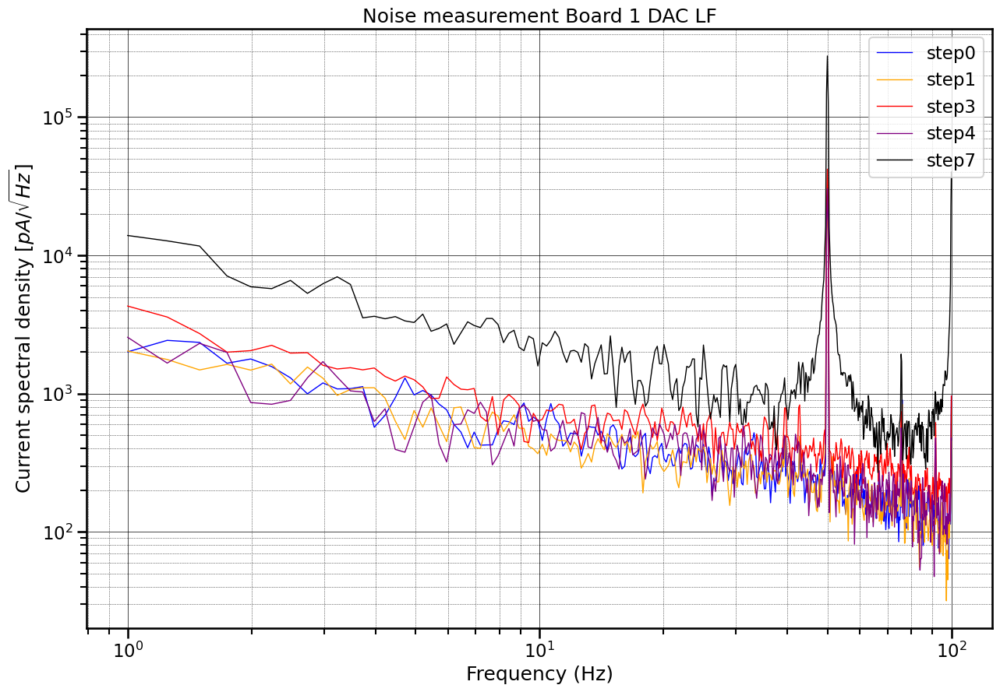

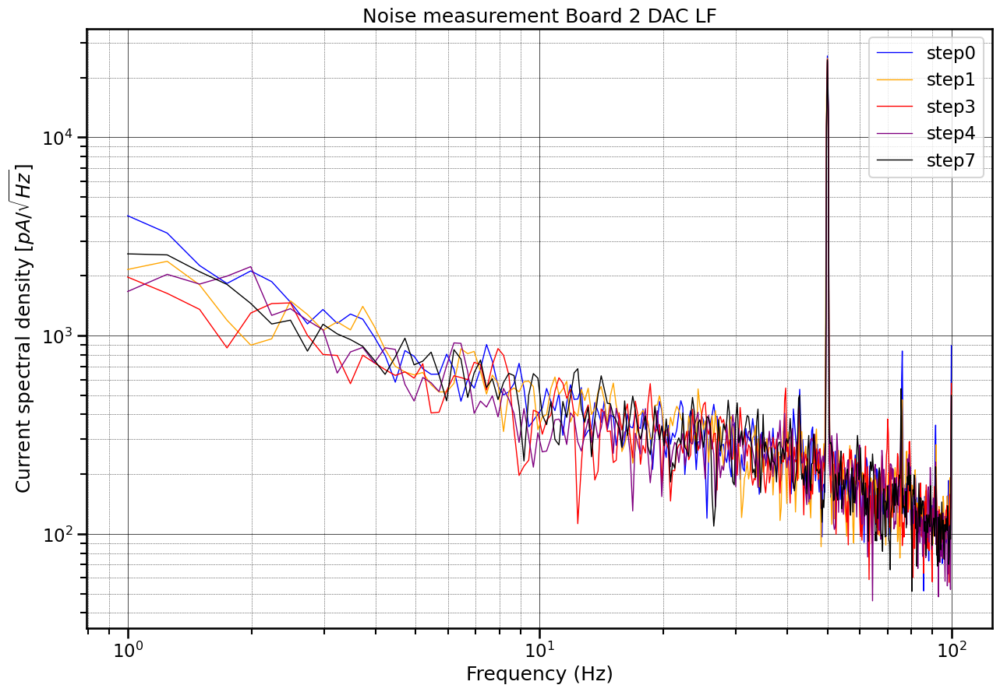

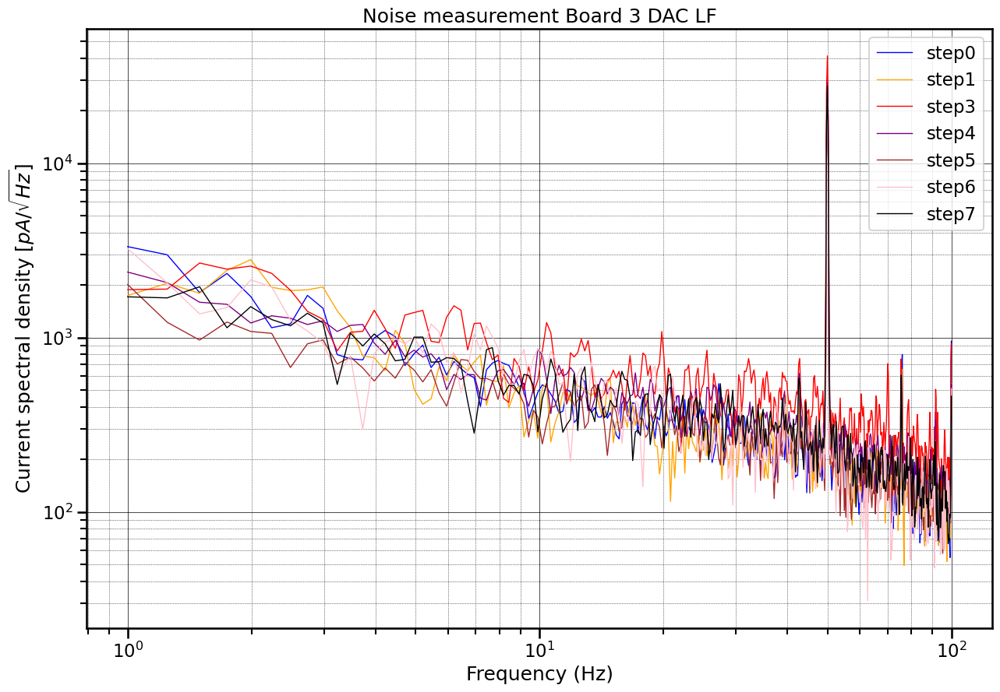

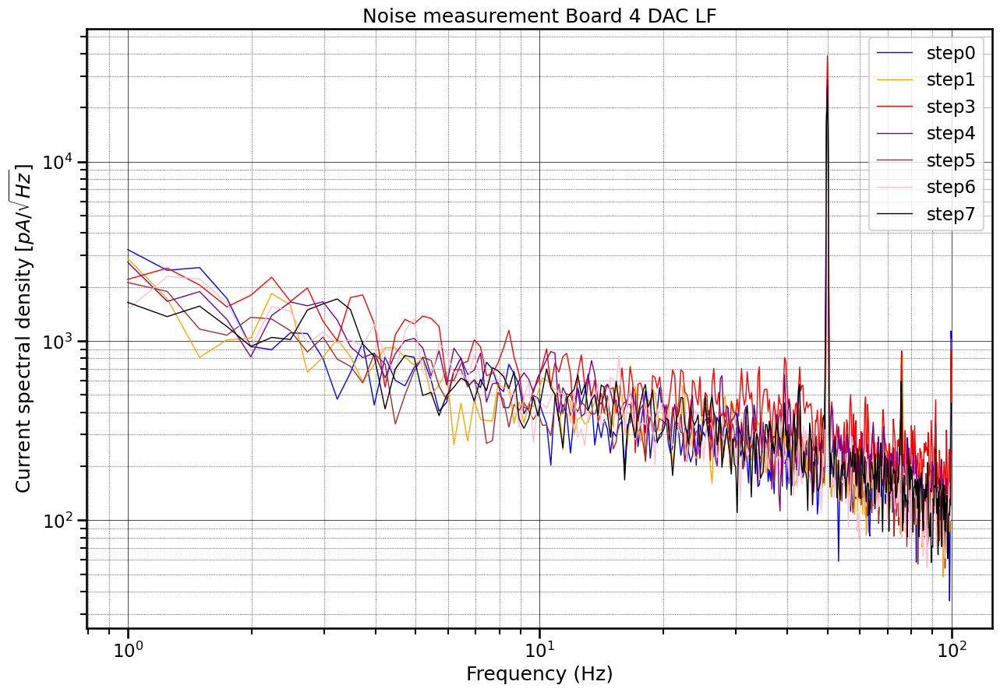

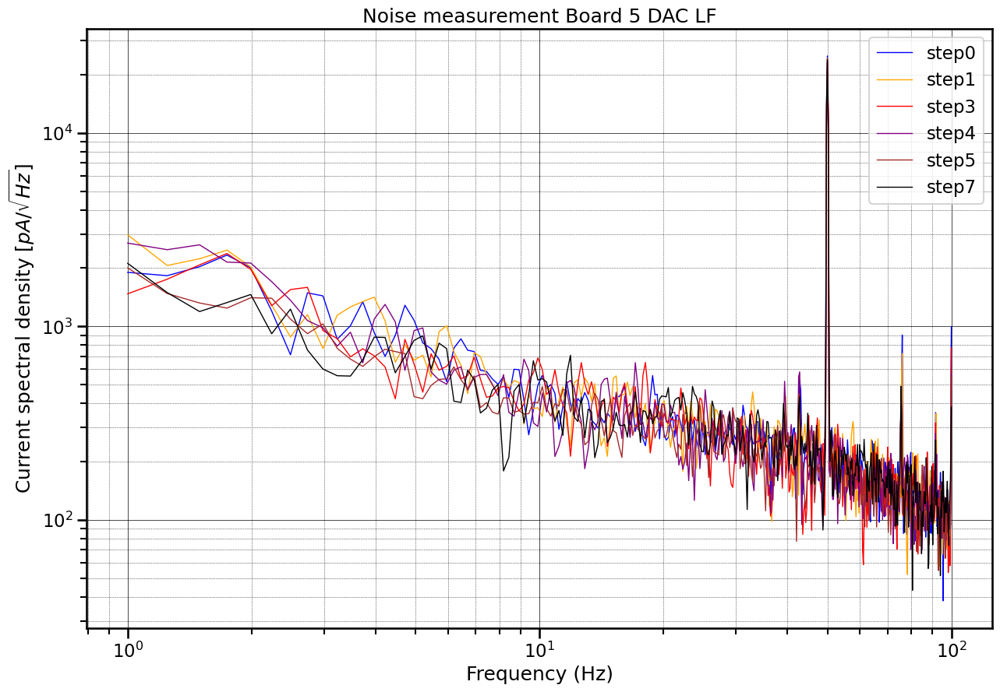

...

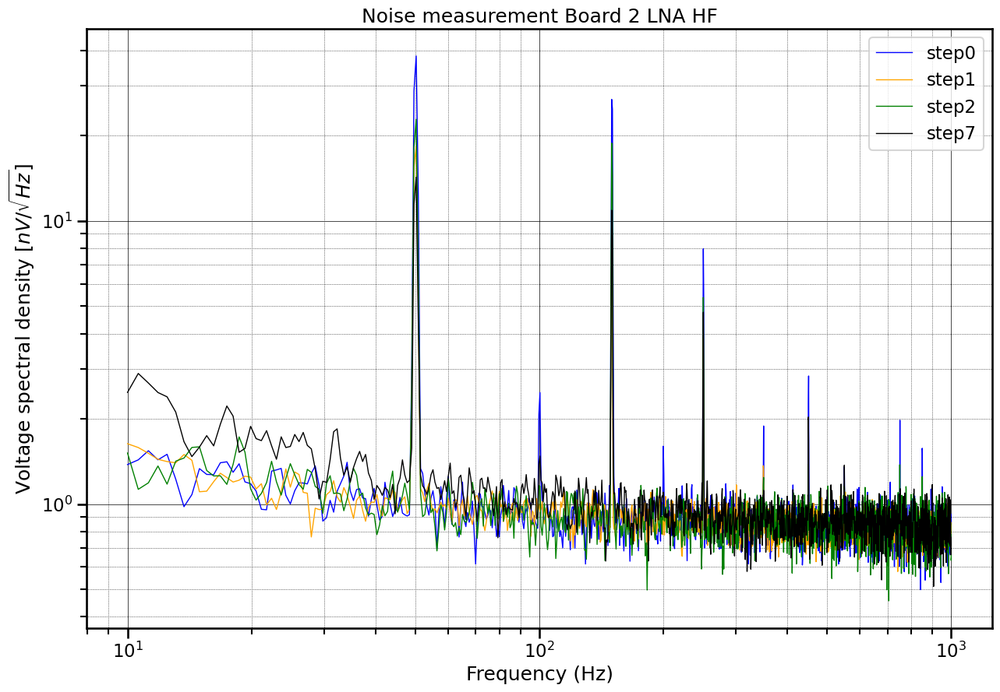

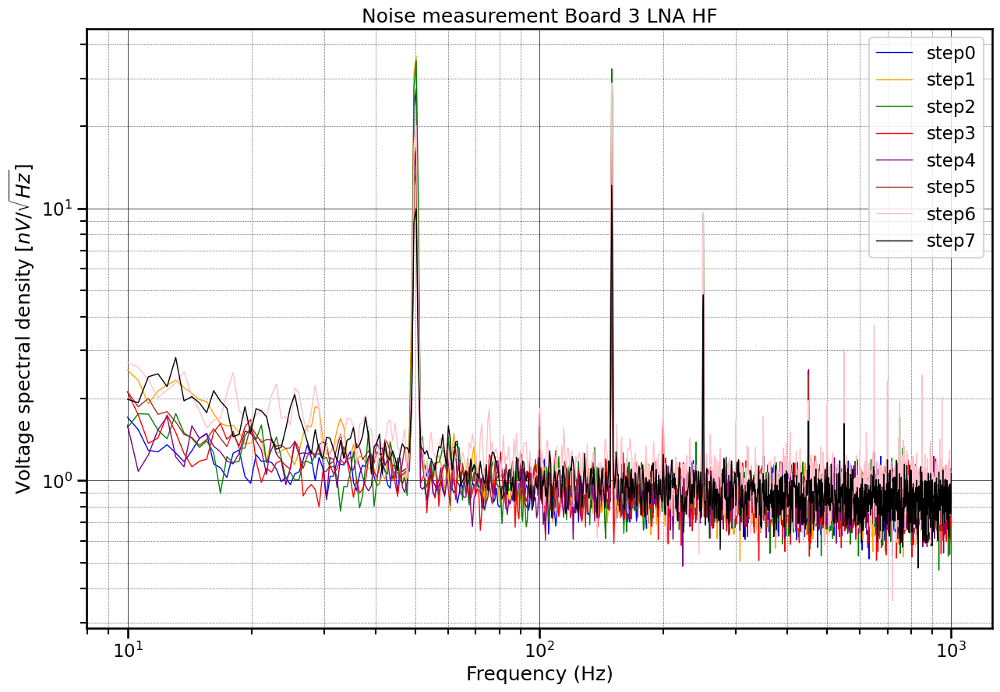

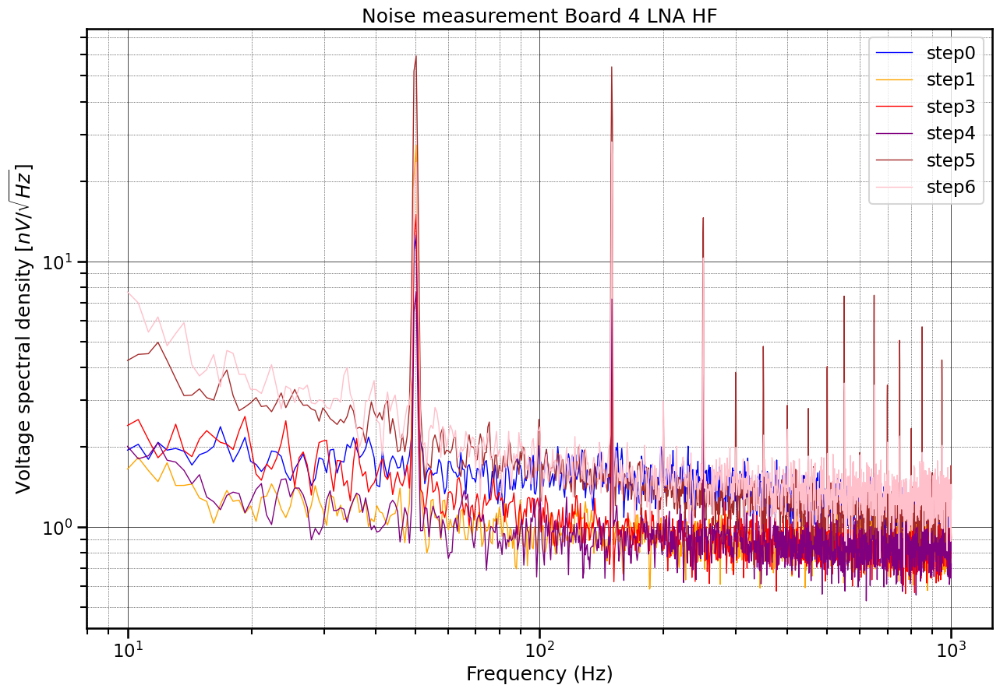

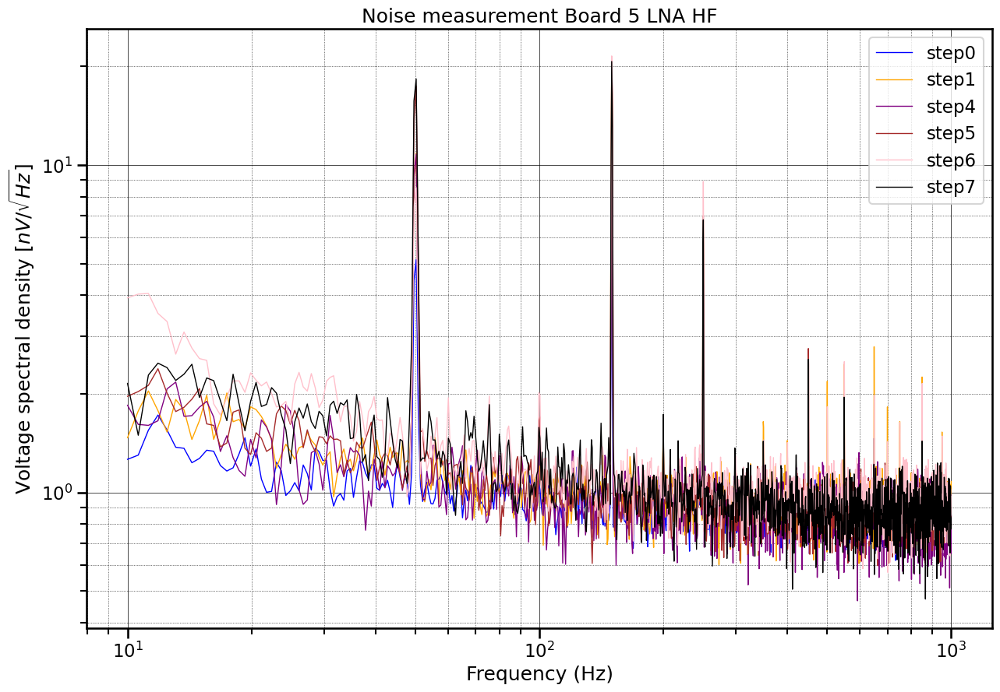

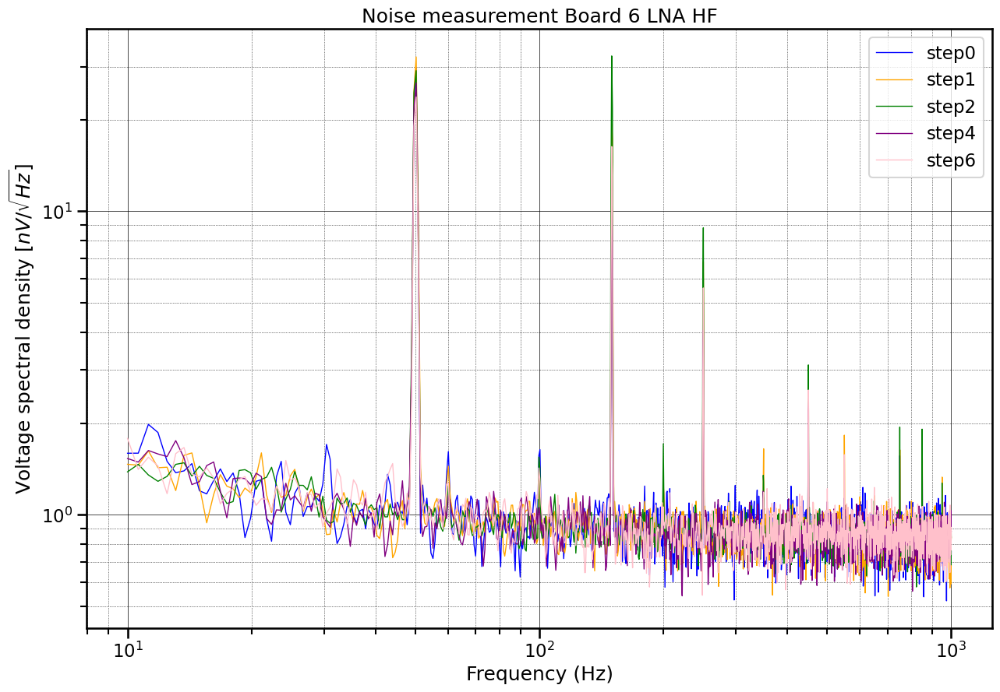

In [7]:
#Step 0
step = 'step0'

num = [[1],[2],[3],[4],[5],[6]]
#----------------

type = ['D']
F = ['L']
for i in num:
    plot_noise(i,type, F)
F = ['H']
for i in num:
    plot_noise(i,type, F)
 #-------------
type = ['L']
F = ['L']
for i in num:
    plot_noise(i,type, F)
F = ['H']
for i in num:
    plot_noise(i,type, F) 
#-------------

In [8]:
# f1,val1, name1 = sort_data(DATA_DIR, 'step8' , [1], 'D', 'L')

In [9]:
def plot_noise_join_et_fit(board_number,type,step,des,fit):

#des = 1 if you want to show the grid at where we divide, fit = 1 if want to show the fit
    
    dir_sv1 = f'board{board_number[0]}'

    def fit_curve(x,a,b):
        if type[0] == 'L':
            return np.sqrt(a**2 + (b*x**(-0.5))**2)
        elif type[0] == 'D' :
            # return (np.abs(a)+ (b*x**(-c)))
            a =  0
            return ((b*x**(-0.5)))

    
    
    # f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    f_peak = [100000]
    fl = 1000
    # step_arr = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
    step_arr = np.array(step)

    # print(step_arr)
    
    f_type = ['L','H']
    f_val = []
    val = []
    name = []
    for step in step_arr:
        f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, 'L')
        
        f2,val2, name2 = sort_data(DATA_DIR, step , board_number, type, 'H')
            #-------joining--------
        if len(f1) == 0 or len(f2) == 0:
            continue 
        else:
            #------ Masking -------
            f_join1,val_join1 = join(f1[0],f2[0],val1[0],val2[0])
            
            # f_join1,val_join1 = join(f1,f2,val1,val2)
            ind = find_nearest_frequency_indices(f_join1, f_peak)
            f_join1 = np.delete(f_join1,ind)
            val_join1 = np.delete(val_join1,ind)
            ind = np.where(f_join1<fl)
            f_join1 = f_join1[ind]
            val_join1 = val_join1[ind]
            val_join1 = val_join1
            f_val.append(f_join1)
            val.append(val_join1)
            name.append(step)
            
    
    plt.figure(figsize = (15,10))
    if type[0] == 'D':
        f = 'DAC'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Current noise density $i_n [A/\sqrt{Hz}]$')
    elif type[0] == 'L':
        f =  'LNA'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Voltage noise density $e_n [nV/ \sqrt{Hz}] $')   

        
    name1 =   f'Noise_Board{board_number[0]}_' + f 
    
    # guess = np.array([0,0,0.5])
    plt.title(f'{name1}')
    # if type[0] == 'D':
    #     plt.axhline(y = 10e-12*fac* 1e9, lw = 2)
    # elif type[0] == 'L':
    #     plt.axhline(y = 1e-9*fac*1e9, lw = 2)
        
    color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']
    # print(name)
    
    for i in range(len(name)):   
        val[i] = val[i]*fac
        col = color_band[int(name[i][4])]
        plt.plot(f_val[i],val[i],lw = 1, color = col)
    
        #---split--------
        beg = 550 #starting point of white noise

        
        fl = f_val[i][beg]
        ind = np.where(f_join1<fl)
        f_join = f_val[i][ind]
        val_join = val[i][ind]
        #flip
        # f_join = f_join[::1]
        # val_join = val_join[::1]
        #---fiting-------
        


        
        
        x_val = f_join
        y_val = val_join
        a_guest = np.mean(val[i][beg:-1])

        #------
        guess = np.array([a_guest, val[i][0]])
     
        a_values = []
        b_values = []

      #White noise array
        w_n = np.ones(len(f_val[i]))*a_guest
 
        for _ in range(100):
            popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)
            a, b = popt
            a_values.append(a)
            b_values.append(b)
        
            # Update guess with the values of a, b, and c for the next fit
            guess = np.array([a, b])

        
        # Perform any other operations using the updated values of a, b, and c
        # y_new = fit_curve(x_val,a,  b, c)
        f_mode = f_val[i][1:beg]
        y_new = fit_curve(f_mode,a,  b)
        # y_new = y_new[::1]
        
        # c = 0.5
        #Flicker noise array
        f_n = fit_curve(f_val[i], a, b) 
        
        t_n = np.sqrt(f_n**2 + w_n**2)
        
        #find f_c
        distances = np.abs(a_guest - fit_curve(f_val[i],a,  b))
        min_distance_index = np.argmin(distances)
        
        # fc = min_distance_index + 1  # Add 1 because the index is zero-based
        f_mode = f_val[i][min_distance_index]
        
        # print(np.size(t_n))
        if fit == 1:
            if type[0] == 'D':
                # plt.plot(f_val[i], t_n,lw = 2, zorder = 5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))} + {round(b, 3)} / f^{ {round(c, 3)} })^2 + {round(a_guest, 3)}^2}}$, fc = {f_mode} Hz")
                plt.plot(f_val[i], t_n,lw = 2, zorder = 5, color = col, label=f"{name[i]}, a= {round(a_guest,3)}, b = {round(b,3)}")
                
                if des == 1:
                    plt.axhline(y = a_guest,color = 'black',linestyle = 'dashed')
                    plt.axvline(x = f_val[i][beg], color = 'black')
                    # plt.plot(f_mode, y_new, color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], fit_curve(f_val[i],a,  b), color = 'black',linestyle = 'dashed')
                    print(f' a= {round(a_guest,3)}, b = {round(b,3)}')
                else:
                    continue 
    
            
            elif type[0] == 'L':
                distances = np.abs(np.ones(len(f_val[i]))*a - (b*f_val[i]**(-0.5)))
                min_distance_index = np.argmin(distances)
                # fc = min_distance_index + 1  # Add 1 because the index is zero-based
                f_mode = f_val[i][min_distance_index]
                
                # plt.plot(f_val[i], fit_curve(f_val[i], np.abs(a), b, c), lw=1, zorder=5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))}^2 + {round(b, 3)}^2 / f^{{2 \cdot {round(c, 3)}}})}}$")
                
                plt.plot(f_val[i], fit_curve(f_val[i], a, b), lw=2,color = col, zorder=5, label=f"{name[i]}, a= {round(a_guest,3)}, b = {round(b,3)} ")
                if des == 1:
                    plt.axhline(y = a, color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], (b*f_val[i]**(-0.5)), color = 'black',linestyle = 'dashed')
                    print(f' a= {round(a_guest,3)}, b = {round(b,3)}')
                else:
                    continue 
        else:
            plt.plot(f_val[i],val[i],lw = 1,color = col, label = f'{name[i]}')
    plt.xlabel('Frequency (Hz)')
    plt.xscale('log')
    plt.yscale('log')
    #plt.ylabel(f'{label}')
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # plt.savefig(f'plots/{dir_sv1}/{name}.png')

## Single board analysis (Plot in each board (included board 8))

### 1. Board 1

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/604321342.py:114: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


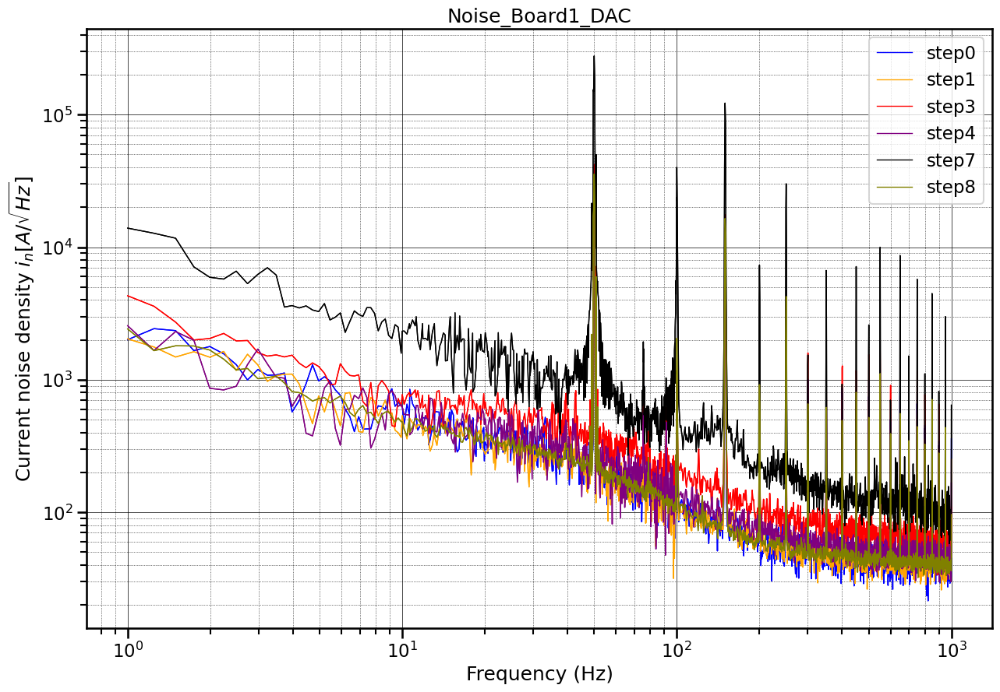

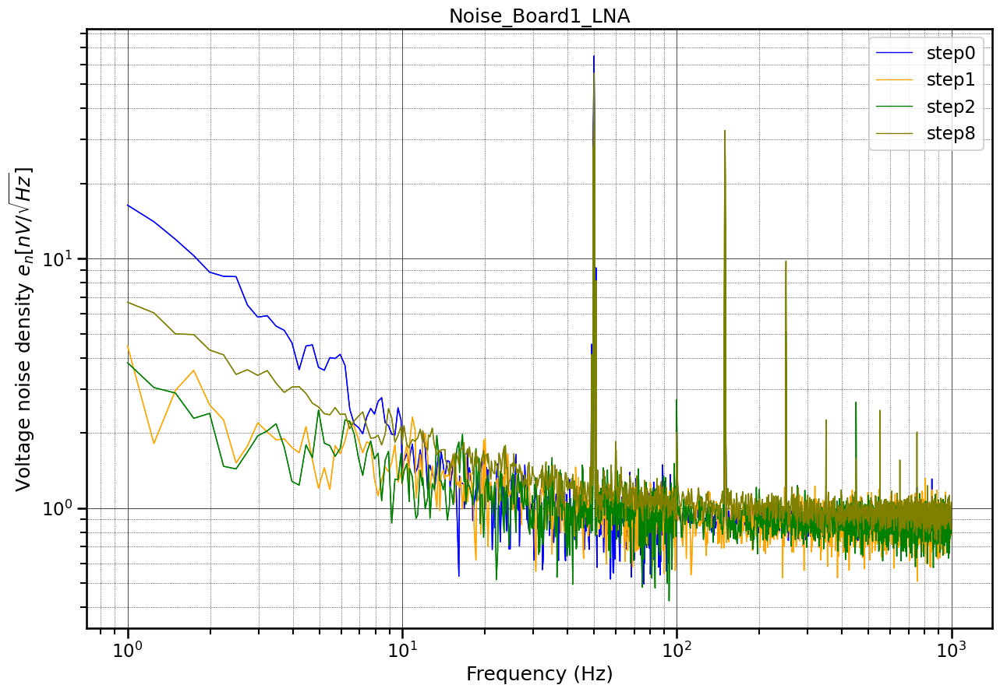

In [10]:
num = [[1]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------
type = ['L']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------

## 2. Board 2

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/604321342.py:114: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


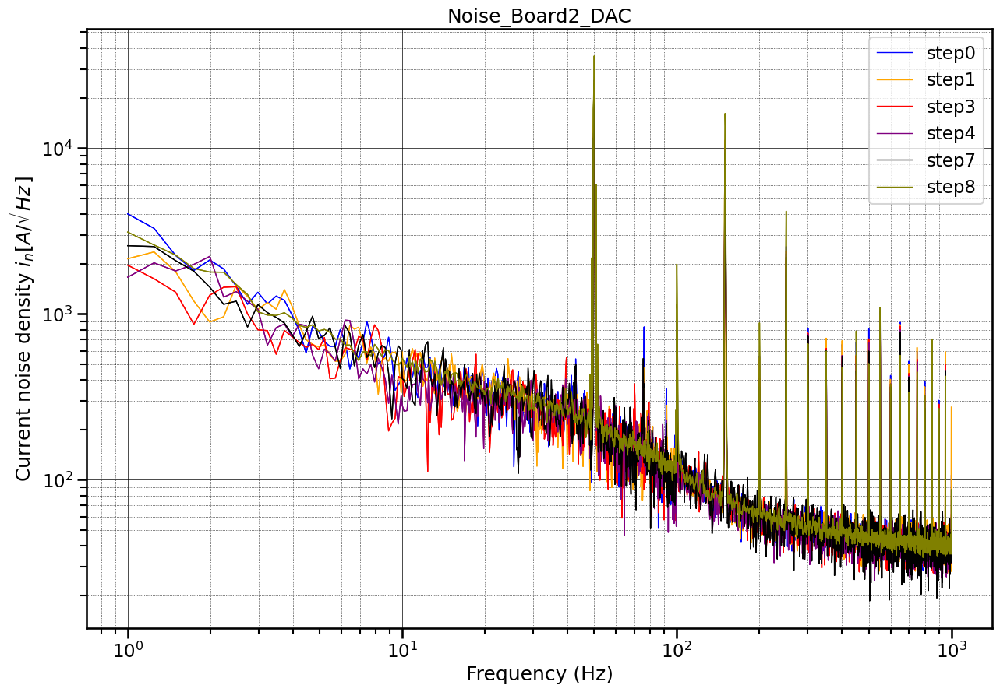

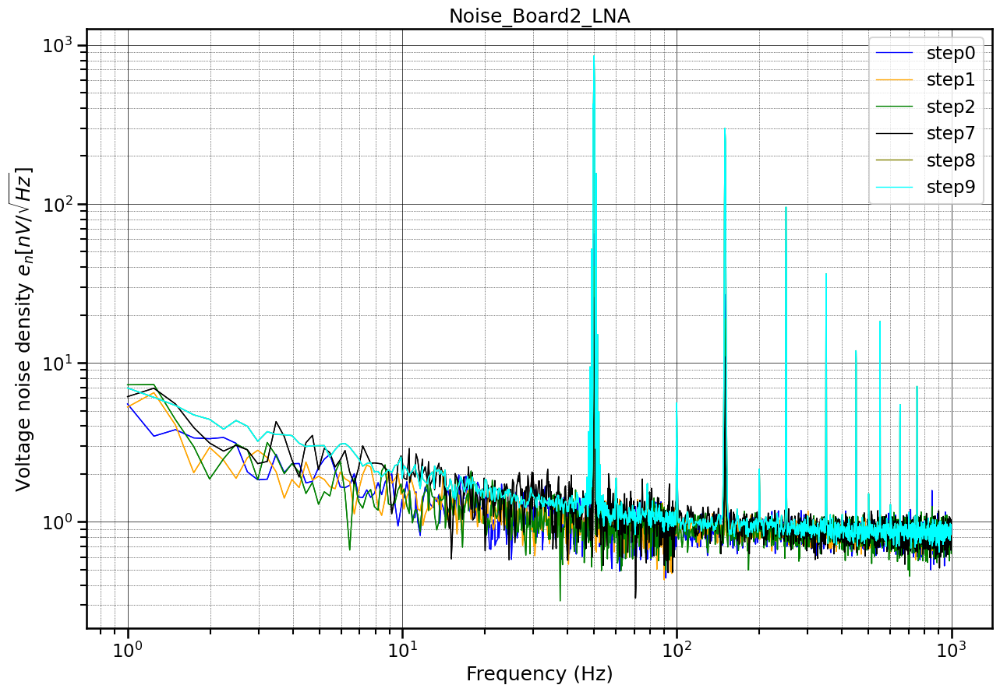

In [11]:
num = [[2]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------
type = ['L']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------

## 3. Board 3

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/604321342.py:114: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


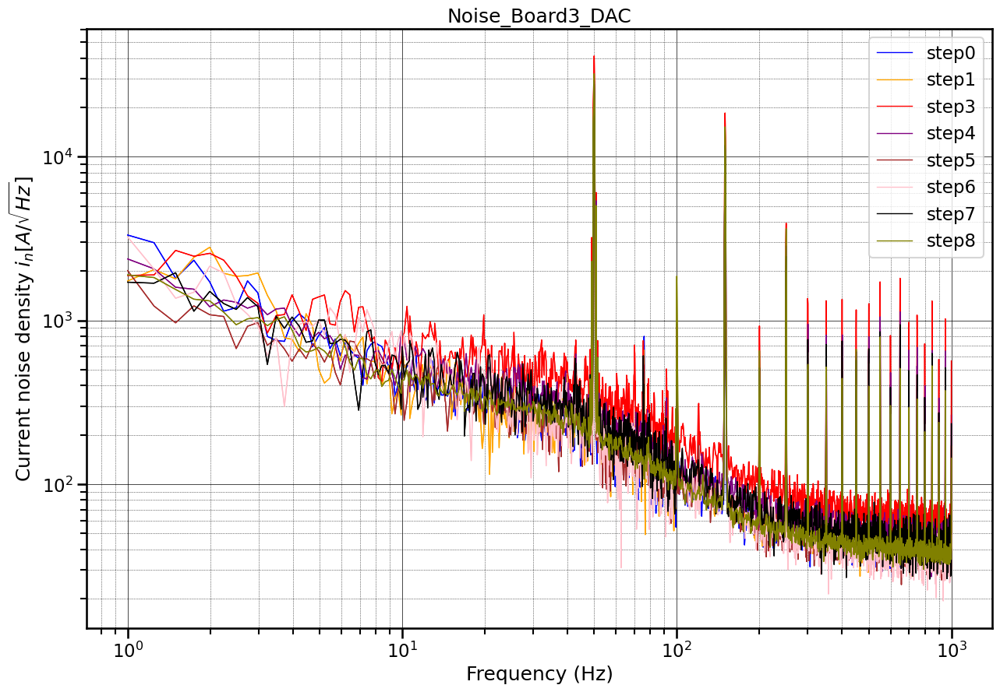

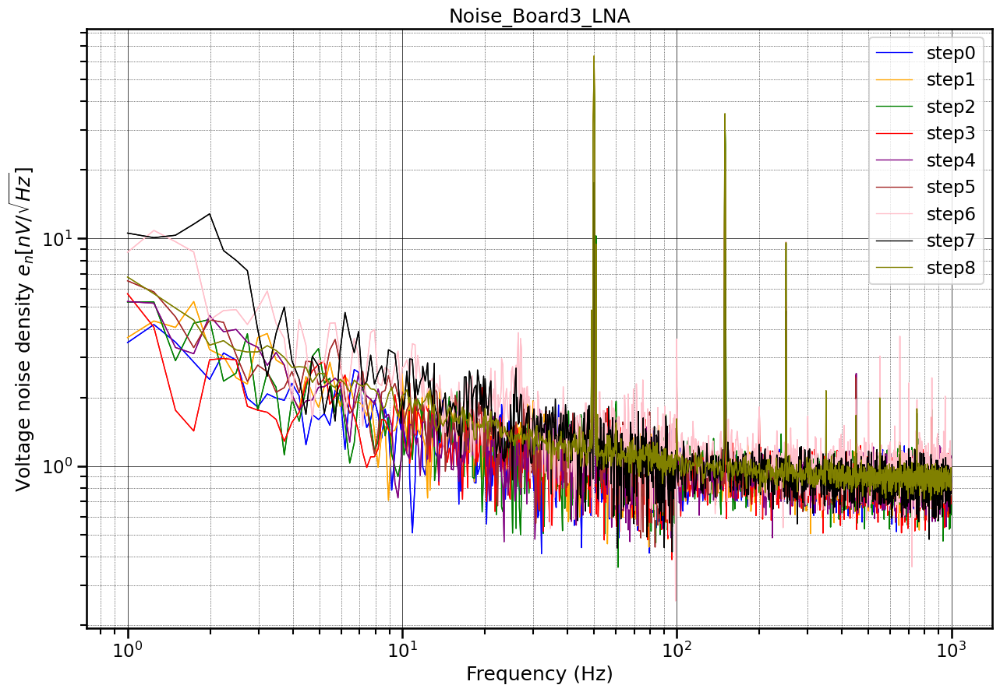

In [12]:
num = [[3]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------
type = ['L']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------

## 4. Board 4

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/604321342.py:114: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


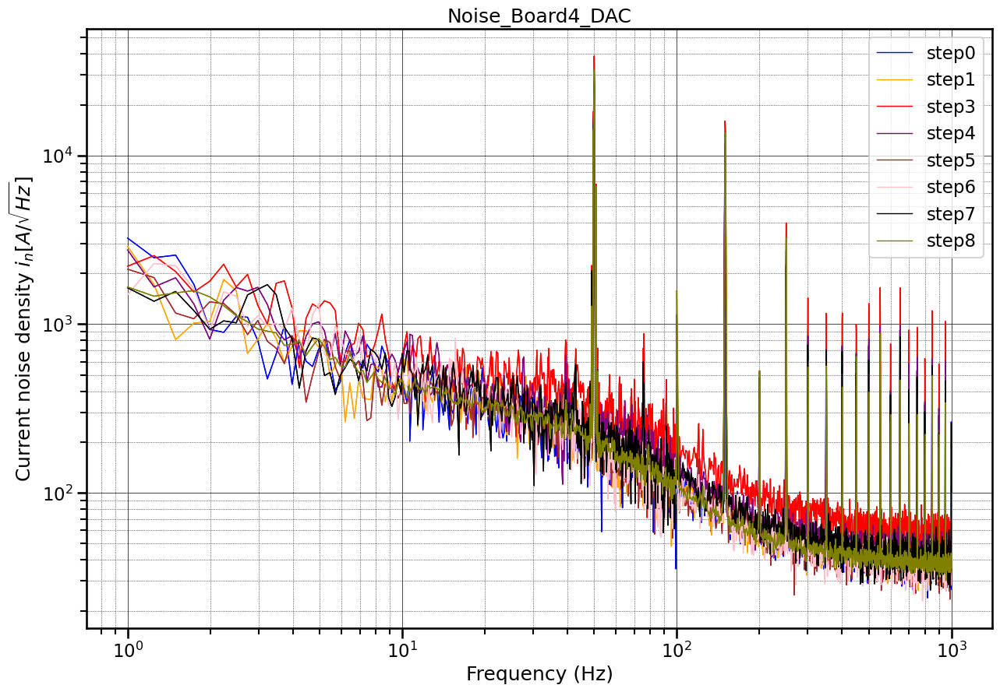

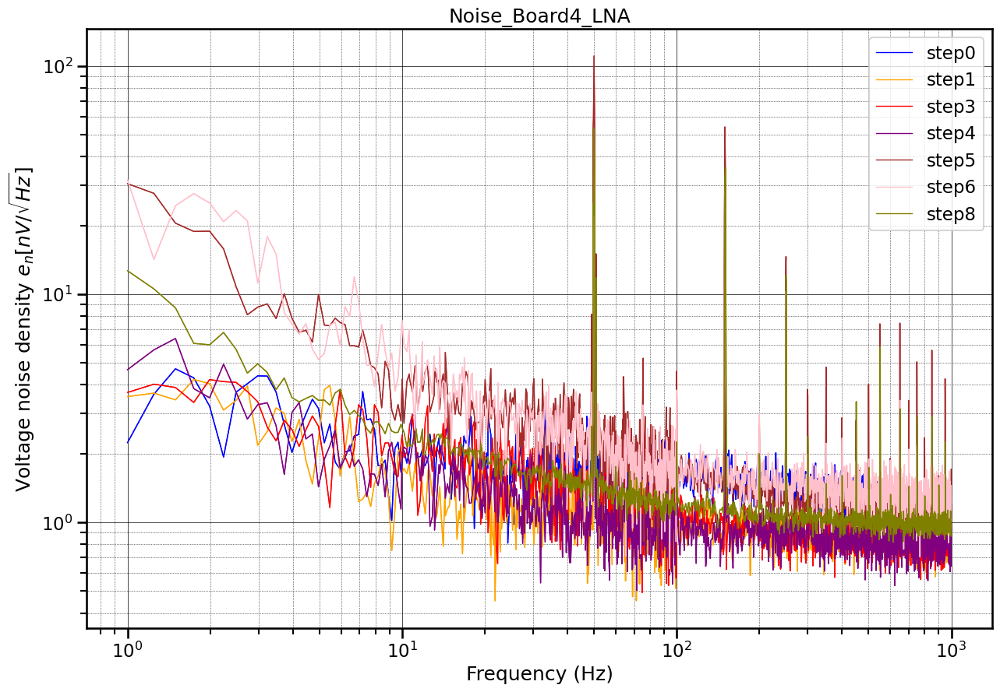

In [13]:
num = [[4]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------
type = ['L']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------

## 5. Board 5

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/604321342.py:114: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


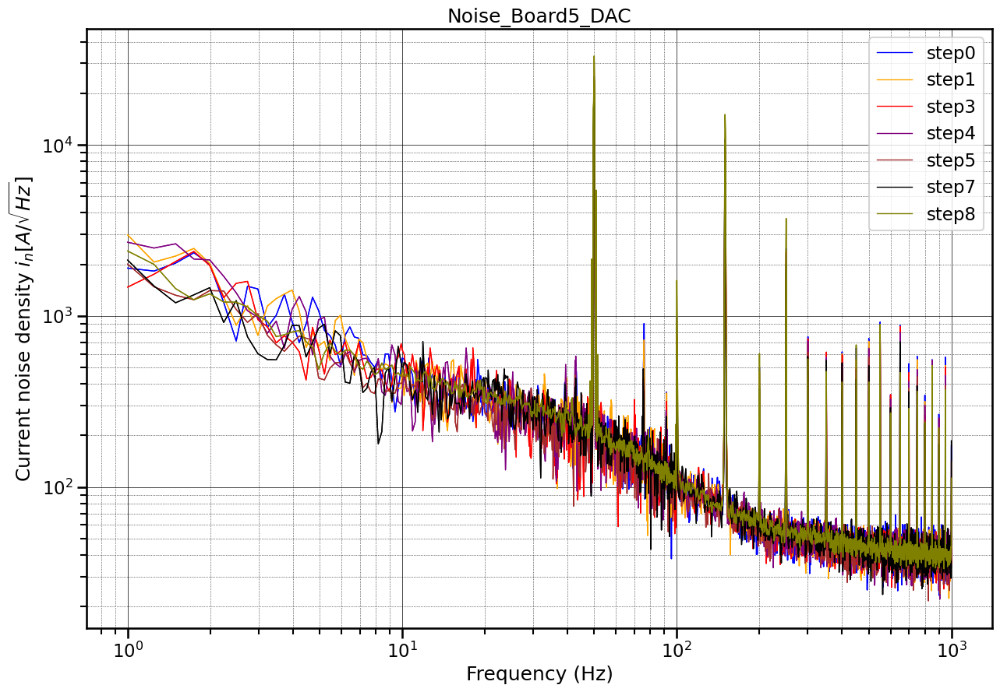

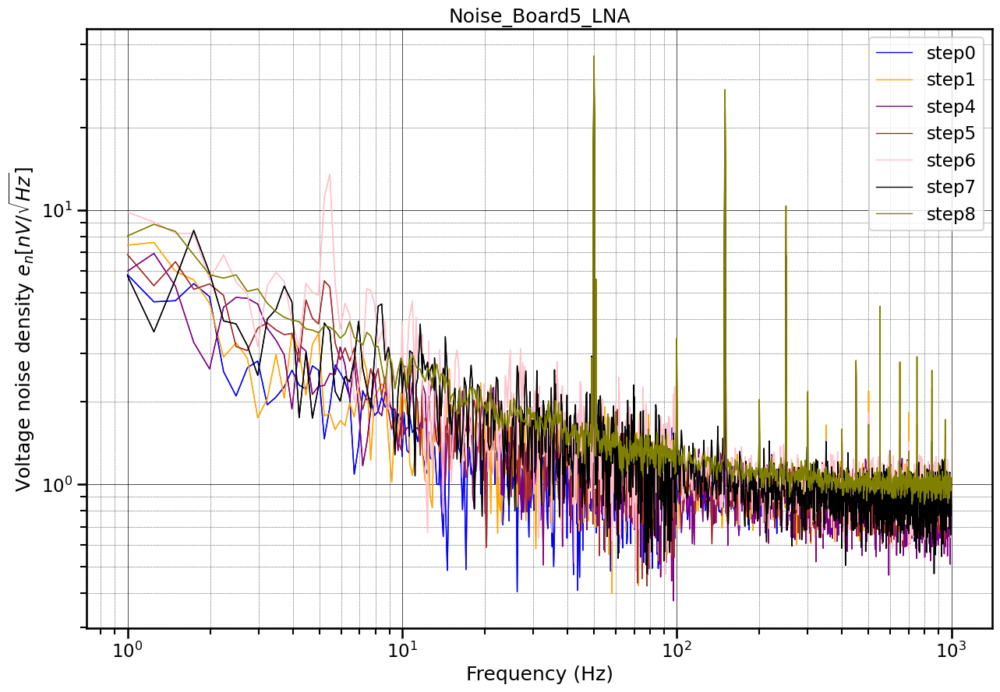

In [14]:
num = [[5]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------
type = ['L']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------

## 6. Board 6

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/604321342.py:114: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


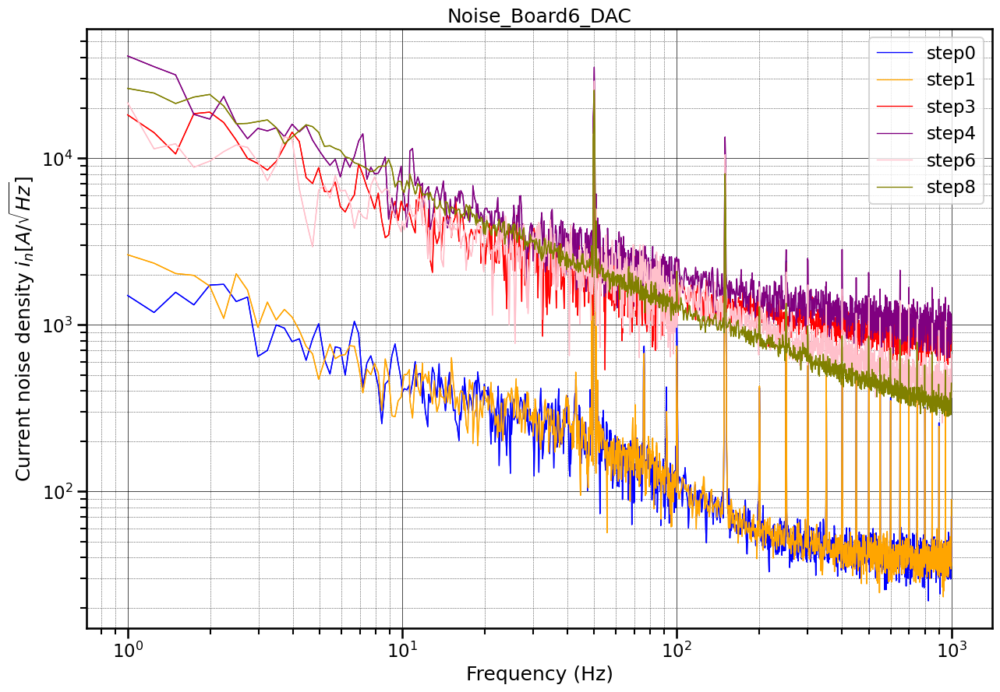

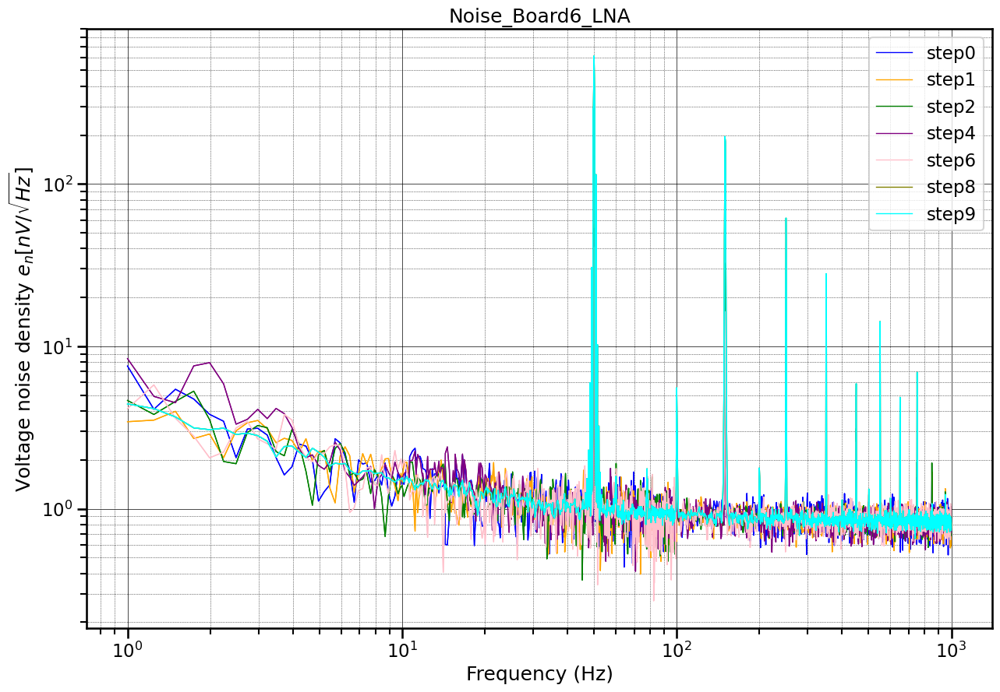

In [15]:
num = [[6]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
# step = ['step8','step9']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------
type = ['L']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------

## II. Further analyse 

### 1. averaging (and compare to step 8)

In [16]:
# join waveform 
def join_wave_form(DATA_DIR, step , board_number, type):
    dir_sv1 = f'board{board_number[0]}'

    def fit_curve(x,a,b):
        if type[0] == 'L':
            return np.sqrt(a**2 + (b*x**(-0.5))**2)
        elif type[0] == 'D' :
            # return (np.abs(a)+ (b*x**(-c)))
            a =  0
            return ((b*x**(-0.5)))

    
    
    f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    # f_peak = [100000]
    fl = 1000
    # step_arr = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
    step_arr = np.array(step)

    # print(step_arr)
    
    f_type = ['L','H']
    f_val = []
    val = []
    name = []
    for step in step_arr:
        f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, 'L')
        
        f2,val2, name2 = sort_data(DATA_DIR, step , board_number, type, 'H')
            #-------joining--------
        if len(f1) == 0 or len(f2) == 0:
            continue 
        else:
            #------ Masking -------
            f_join1,val_join1 = join(f1[0],f2[0],val1[0],val2[0])
            
            # f_join1,val_join1 = join(f1,f2,val1,val2)
            ind = find_nearest_frequency_indices(f_join1, f_peak)
            f_join1 = np.delete(f_join1,ind)
            val_join1 = np.delete(val_join1,ind)
            ind = np.where(f_join1<fl)
            f_join1 = f_join1[ind]
            val_join1 = val_join1[ind]
            val_join1 = val_join1
            f_val.append(f_join1)
            val.append(val_join1)
            name.append(step)
    return f_val,val,name

['step1']
----------
DAC
4
Board [[2], [3], [4], [5]]
Value around 1Hz = 1663.483 $\pm$ 375.878 
Value around 10Hz = 465.507 $\pm$  50.729
Value around 100Hz = 110.4 $\pm$ 8.42
Value around 1000Hz = 39.893 $\pm$ 3.174
------------------
LNA
6
Board [[1], [2], [3], [4], [5], [6]]
Value around 1Hz = 3.476 $\pm$ 0.795 
Value around 10Hz = 1.571 $\pm$  0.12
Value around 100Hz = 0.929 $\pm$ 0.09
Value around 1000Hz = 0.856 $\pm$ 0.04
------------------


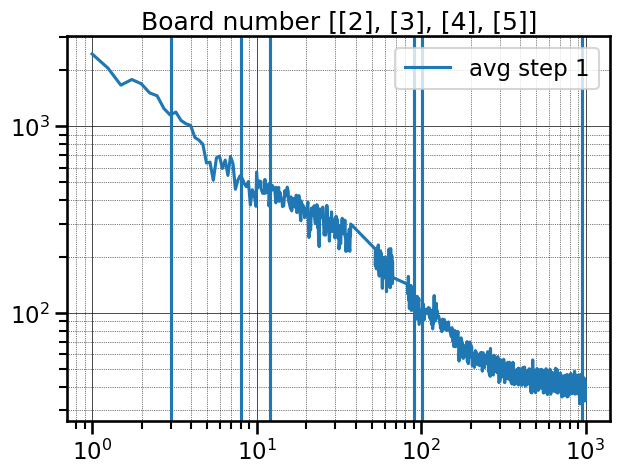

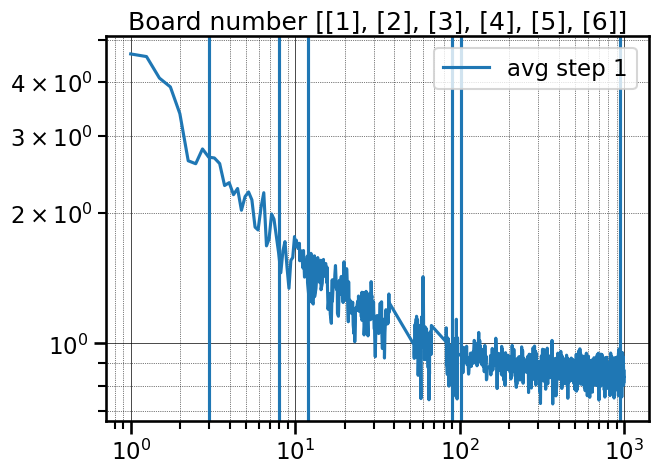

In [17]:
# Step 0: 
step = ['step1']
step1 = step
print(step)
print('----------')
# num = [[1],[2],[3],[5],[6]]
# board_number = [[3]]
type = ['D','L']
for typ in type:
    num = [[1],[2],[3],[4],[5],[6]]
    if typ == 'D':
        print('DAC')
        num = [[2],[3],[4],[5]]
        # num = [[2],[3]÷\,[4],[5]]
        
    elif typ == 'L':
        print('LNA')
        
    
    val_avg = np.zeros((1,1642))
    f_avg =   np.zeros((1,1642))
    # val_avg = np.array(val_avg)
    count = 0
    
    std = []
    for i in num:
        f,value,name = join_wave_form(DATA_DIR, step , i, typ)
        # print(f[0])
        if f == [] : 
            continue
        else:
            # print(value[0])
            std.append(value[0])
            value = np.array(value)
            val_avg += value
            f = np.array(f)
            f_avg += f
            count +=1
        
    val_avg = np.array(val_avg) / count
    f_avg = np.array(f_avg) / count
   
    plt.figure(figsize = (7,5))
    plt.title(f'Board number {num}')
    plt.loglog(f_avg[0],val_avg[0], label= f'avg step {step1[0][4]}' )
    # plt.loglog(f[0],val_8[0], label = 'ref')
    plt.legend()
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # print(f_avg[0])
    
    # print(ind)
    # print(ind)
    print(count)
    print(f'Board {num}')
    ind = np.where(f_avg[0] < 3)[0]
    print(f'Value around 1Hz = {np.round(np.mean(val_avg[0][ind]),3)} $\pm$ {np.round(np.std(val_avg[0][ind]),3)} ')
    plt.axvline(x = 3)
    
    ind = np.where(np.logical_and(f_avg[0] > 8, f_avg[0] < 12))[0]
    print(f'Value around 10Hz = {np.round(np.mean(val_avg[0][ind]),3)} $\pm$  {np.round(np.std(val_avg[0][ind]),3)}')
    plt.axvline(x = 8)
    plt.axvline(x = 12)
    ind = np.where(np.logical_and(f_avg[0] > 90, f_avg[0] < 102))[0]
    print(f'Value around 100Hz = {np.round(np.mean(val_avg[0][ind]),3)} $\pm$ {np.round(np.std(val_avg[0][ind]),3)}')
    plt.axvline(x = 90)
    plt.axvline(x = 102)
    ind = np.where(f_avg[0] > 950)[0]
    print(f'Value around 1000Hz = {np.round(np.mean(val_avg[0][ind]),3)} $\pm$ {np.round(np.std(val_avg[0][ind]),3)}')
    plt.axvline(x = 950)
    print('------------------')
# plt.axvline(x = f_avg[0][ind][-1])



In [18]:
#DAC 
noise_DAC_1Hz = [1825.231
,1642.897
,1888.99 
,1655.724
,1259.651
,1620.835
,1411.095,1511.022]
noise_DAC_10Hz = [502.437
,467.578
,610.496
,505.272
,413.87 
,542.535
,477.348,463.436]
noise_DAC_100Hz = [110.548
,109.034
,161.387
,127.756
,111.184
,104.553
,118.089,113.878]
noise_DAC_1000Hz = [41.474
,40.176
,50.844
,42.039
,38.014
,37.058
,40.873, 38.868]
err_DAC_1Hz =[598.537
,340.763
,348.058
,393.004
,330.521
,432.74 
,319.107, 388.765]
err_DAC_10Hz =[65.086
,48.219
,82.527
,44.485
,45.14 
,95.201
,71.33, 22.016 ]
err_DAC_100Hz = [7.233 
,9.468 
,16.317
,12.071
,13.902
,18.452,14.538, 4.4777]
err_DAC_1000Hz = [2.591
,2.61
,3.944
,2.764
,2.624
,3.445
,3.163, 1.348]
num_to_plot = [0,1,3,4,5,6,7,8,0,1,3,4,5,6,7,8,0,1,3,4,5,6,7,8,0,1,3,4,5,6,7,8]
num_to_plot1 = [0,0.1,0.3,0.4,0.5,0.6,0.7,0.8,1,1.1,1.3,1.4,1.5,1.6,1.7,1.8,2,2.1,2.3,2.4,2.5,2.6,2.7,2.8,3,3.1,3.3,3.4,3.5,3.6,3.7,3.8]
# print(len(num_to_plot[0:6]))
print((num_to_plot[8:16]))
# np.size(noise_DAC_1Hz)

[0, 1, 3, 4, 5, 6, 7, 8]


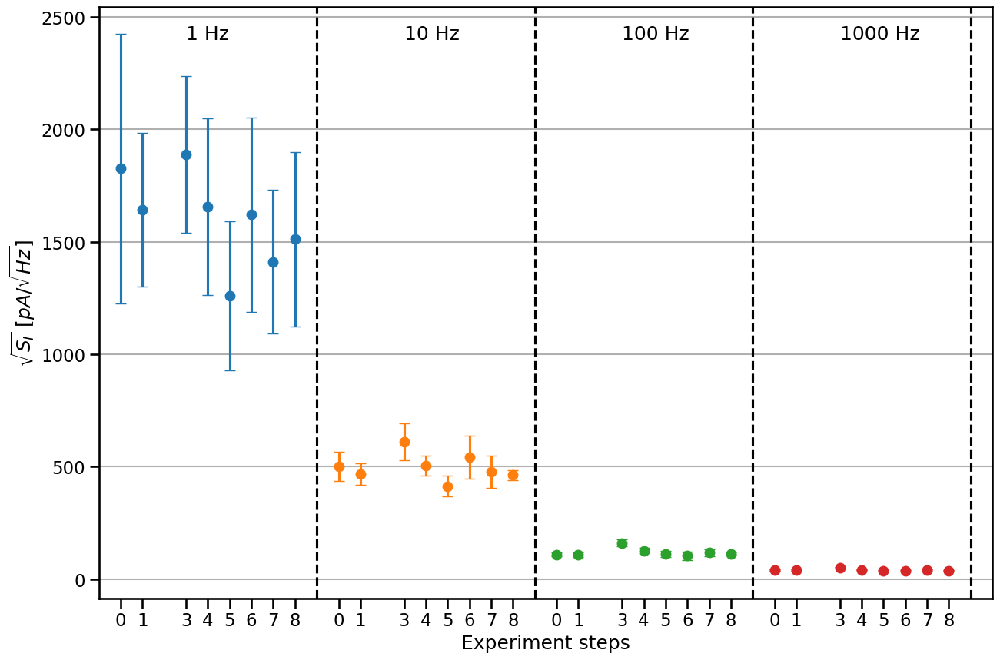

In [19]:
plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot1[0:8],    noise_DAC_1Hz,    yerr=[err_DAC_1Hz ], fmt='o', capsize=5)
plt.errorbar(num_to_plot1[8:16],  noise_DAC_10Hz,   yerr=[err_DAC_10Hz ], fmt='o', capsize=5)
plt.errorbar(num_to_plot1[16:24], noise_DAC_100Hz,  yerr=[err_DAC_100Hz ], fmt='o', capsize=5)
plt.errorbar(num_to_plot1[24:32], noise_DAC_1000Hz, yerr=[err_DAC_1000Hz ], fmt='o', capsize=5)

plt.xticks(num_to_plot1, num_to_plot)
#Plot text
plt.text(0.3, 2400, '1 Hz')
plt.text(1.3, 2400, '10 Hz')
plt.text(2.3, 2400, '100 Hz')
plt.text(3.3, 2400, '1000 Hz')
# plt.text(4.15, 415, 'Board 5')
# plt.text(5.15, 415, 'Board 6')

plt.axvline(x = 0.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 1.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 2.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 3.9, color = 'black', linestyle = 'dashed')

plt.xlabel('Experiment steps')
plt.ylabel(r'$\sqrt{S_I}$ [$pA/ \sqrt{Hz}$]')
# plt.title('Average DAC noise density at different frequency')
plt.xlim(-0.1,4)
plt.gca().yaxis.grid(True)
plt.savefig('error_DAC_per_total_dose.png')

In [20]:
noise_LNA_1Hz = [4.665
,3.476
,3.32 
,3.33 
,4.664
,4.503
,5.642
,6.026,5.157]
noise_LNA_10Hz = [1.648
,1.571
,1.392
,1.816
,1.689
,2.639
,2.45 
,2.42,2.091 ]
noise_LNA_100Hz = [1.081
,0.929
,0.865
,0.98 
,0.945
,0.988
,1.093
,0.933,1.085]
noise_LNA_1000Hz = [0.863
,0.856
,0.827
,0.835
,0.839
,0.867
,0.908
,0.858,0.914]
err_LNA_1Hz =[1.158
,0.795
,1.088
,0.714
,0.774
,1.239
,1.721
,1.613,1.288]
err_LNA_10Hz =[0.121
,0.12 
,0.095
,0.241
,0.175
,0.354
,0.28 
,0.365,0.106]
err_LNA_100Hz = [0.06 
,0.09 
,0.074
,0.158
,0.103
,0.193
,0.181
,0.153,0.025]
err_LNA_1000Hz = [0.036
,0.04
,0.053
,0.077
,0.05
,0.057
,0.065
,0.059,0.019]
num_to_plot = [0,1,2,3,4,5,6,7,8,0,1,2,3,4,5,6,7,8,0,1,2,3,4,5,6,7,8,0,1,2,3,4,5,6,7,8]
num_to_plot1 = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,1,1.1,1.2,1.3,1.4,1.5,1.6,1.7,1.8,2,2.1,2.2,2.3,2.4,2.5,2.6,2.7,2.8,3,3.1,3.2,3.3,3.4,3.5,3.6,3.7,3.8]

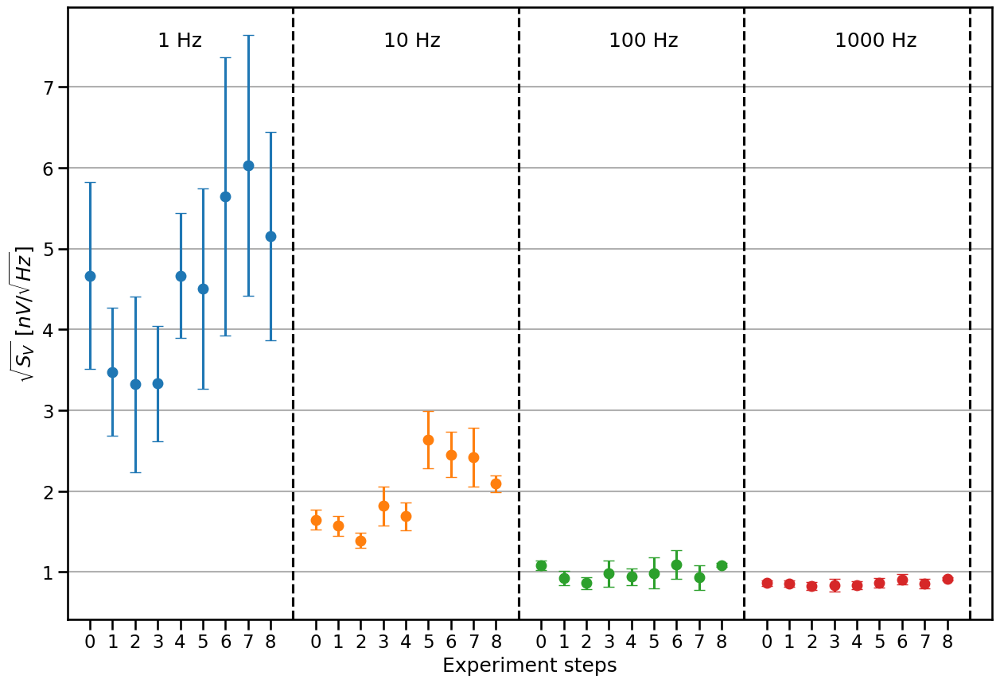

In [21]:
plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot1[0:9],   noise_LNA_1Hz,    yerr=[err_LNA_1Hz ], fmt='o', capsize=5)
plt.errorbar(num_to_plot1[9:18],  noise_LNA_10Hz,   yerr=[err_LNA_10Hz ], fmt='o', capsize=5)
plt.errorbar(num_to_plot1[18:27], noise_LNA_100Hz,  yerr=[err_LNA_100Hz ], fmt='o', capsize=5)
plt.errorbar(num_to_plot1[27:36], noise_LNA_1000Hz, yerr=[err_LNA_1000Hz ], fmt='o', capsize=5)

plt.xticks(num_to_plot1, num_to_plot)
#Plot text
plt.text(0.3, 7.5, '1 Hz')
plt.text(1.3, 7.5, '10 Hz')
plt.text(2.3, 7.5, '100 Hz')
plt.text(3.3, 7.5, '1000 Hz')
# plt.text(4.15, 415, 'Board 5')
# plt.text(5.15, 415, 'Board 6')

plt.axvline(x = 0.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 1.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 2.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 3.9, color = 'black', linestyle = 'dashed')

plt.xlabel('Experiment steps')
plt.ylabel(r'$\sqrt{S_V}$ [$nV/ \sqrt{Hz}$]')
# plt.title('Average LNA noise density at different frequency')
plt.xlim(-0.1,4)
plt.gca().yaxis.grid(True)
plt.savefig('error_LNA_per_total_dose.png')

[-0.05251085 -0.06723035 -0.05030404 -0.05867959]


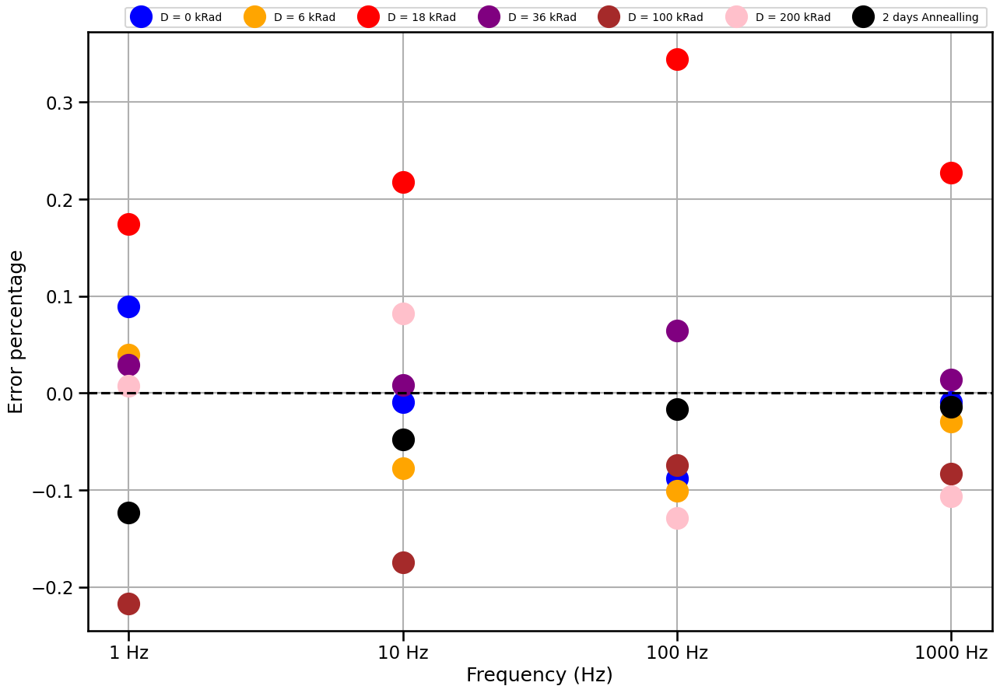

In [22]:
import numpy as np
import pandas as pd
step0_DAC = [1752.857, 496.725, 109.461, 41.061]
step1_DAC = [1672.082, 462.333, 107.92, 40.223]
step3_DAC = [1888.99, 610.496, 161.387, 50.884]
step4_DAC = [1655.724, 505.272, 127.756, 42.039]
step5_DAC = [1259.651, 413.87, 111.184, 38.014]
step6_DAC = [1620.835, 542.535, 104.553, 37.058]
step7_DAC = [1411.095, 477.348, 118.089, 40.873]
step8_DAC = [1524.271, 467.528, 114.011, 39.018]

steps = [step0_DAC, step1_DAC, step3_DAC, step4_DAC, step5_DAC, step6_DAC, step7_DAC]

step_avg = np.mean(steps, axis=0)


step_errors = [((step - step_avg)/step_avg) for step in steps]
step_errors1 = (step8_DAC - step_avg) / step_avg
print(step_errors1)
number = [0,1,3,4,5,6,7]
total_dose = ['0','6','12','18','36','100','200','2 days Annealling']
color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']
plt.figure(figsize = (15,10))
for i in range(len(number)-1):
    plt.plot(step_errors[i],'o',markersize = 20,color = color_band[number[i]], label = f'D = {total_dose[number[i]]} kRad')
plt.plot(step_errors[-1],'o',markersize = 20,color = color_band[number[-1]], label = f'{total_dose[number[-1]]} ')
plt.axhline(y = 0,linestyle = 'dashed', color = 'black')
plt.xticks([0, 1, 2, 3], ['1 Hz', '10 Hz', '100 Hz', '1000 Hz'])
# plt.plot(step_errors1,color = color_band[9],lw = 10, label = f'step 8')
plt.legend(fontsize = 10, bbox_to_anchor=(1, 1.05), ncol = 7)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Error percentage')
plt.grid()
# plt.savefig('DAC_error.png')
# plt.plot(step_errors1, label = f'step 8')

    

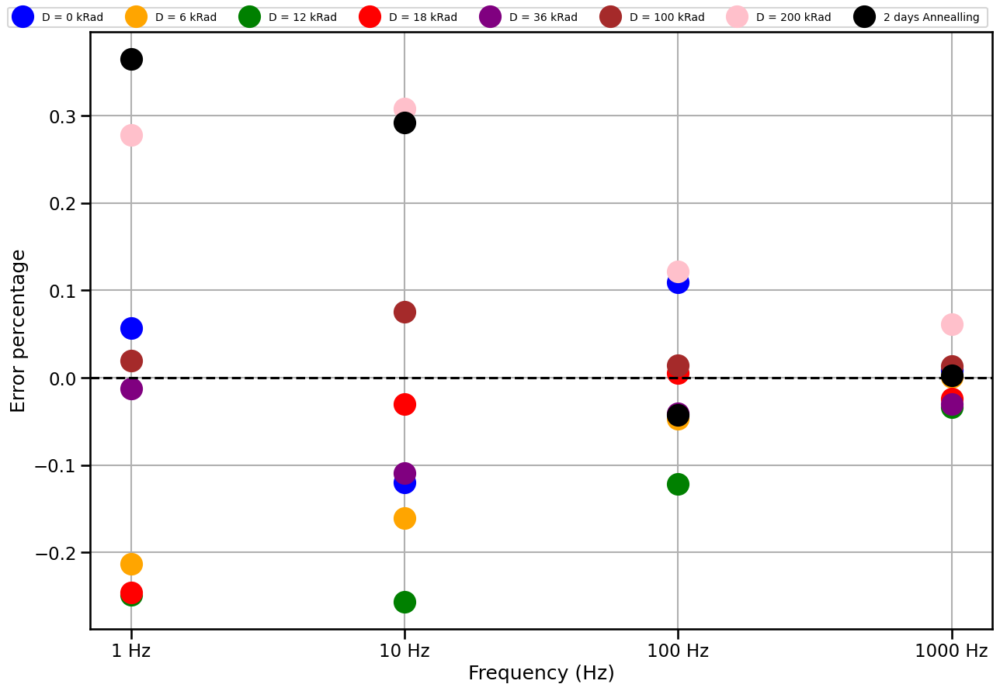

In [23]:
import numpy as np
import pandas as pd
step0_LNA = [4.665 ,1.648, 1.081, 0.863]
step1_LNA = [3.476 ,1.571, 0.929, 0.856]
step2_LNA = [3.32  ,1.392, 0.856, 0.827]
step3_LNA = [3.33  ,1.816, 0.98 , 0.835]
step4_LNA = [4.36  ,1.668, 0.935, 0.83]
step5_LNA = [4.503 ,2.014, 0.988, 0.867]
step6_LNA = [5.642 ,2.45 , 1.093, 0.908]
step7_LNA = [6.026 ,2.42 , 0.933, 0.858]
step8_LNA = [5.157 ,2.091, 1.085, 0.914]

steps = [step0_LNA, step1_LNA, step2_LNA, step3_LNA, step4_LNA, step5_LNA, step6_LNA, step7_LNA]

step_avg = np.mean(steps, axis=0)


step_errors = [((step - step_avg)/step_avg) for step in steps]
step_errors1 = (step8_LNA - step_avg) / step_avg


number = [0,1,2,3,4,5,6,7]
total_dose = ['0','6','12','18','36','100','200','2 days Annealling']
color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']
plt.figure(figsize = (15,10))
for i in range(len(number)-1):
    plt.plot(step_errors[i],'o',markersize = 20,color = color_band[number[i]], label = f'D = {total_dose[number[i]]} kRad')
plt.plot(step_errors[-1],'o',markersize = 20,color = color_band[number[-1]], label = f'{total_dose[number[-1]]} ')
plt.axhline(y = 0,linestyle = 'dashed', color = 'black')
plt.xticks([0, 1, 2, 3], ['1 Hz', '10 Hz', '100 Hz', '1000 Hz'])

# plt.plot(step_errors1,color = color_band[9],lw = 10, label = f'step 8')
plt.legend(fontsize = 10, bbox_to_anchor=(1, 1.05), ncol = 8)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Error percentage')
plt.grid()
# plt.savefig('LNA_error.png')

# Step 0: 
step = ['step8']
step1 = step
print(step)
print('----------')
board_number = [[1],[2],[3],[4],[5],[6]]
# board_number = [[3]]
for num in board_number:
    type = ['D','L']
    for typ in type:
        if typ == 'D':
            print('DAC')
        elif typ == 'L':
            print('LNA')
        val_avg = np.zeros((1,1642))
        f_avg =   np.zeros((1,1642))
        # val_avg = np.array(val_avg)
        for i in num:
            f,value,name = join_wave_form(DATA_DIR, step , num, typ)
            # print(f[0])
            if f == [] : 
                continue
            else:
                value = np.array(value)
                val_avg += value
                f = np.array(f)
                f_avg += f
        # print(len(val_avg))
        # print(len(val_avg))
        val_avg = np.array(val_avg) / len(val_avg)
        f_avg = np.array(f_avg) / len(f_avg)
        # print(f_avg[0])
        # #Step 8 (reference)
        # step = ['step8']
        # val_8 = np.zeros((1,2001))
        # for i in board_number:
        #     # val_avg = np.zeros((1,2001))
        #     f,value,name = join_wave_form(DATA_DIR, step , i, type)
        #     value = np.array(value)
        #     val_8 += value
        # # print(len(val_8))
        # val_8 = np.array(val_8) / len(val_8)
        
        # print(val_avg)
        # print(f)
        plt.figure(figsize = (7,5))
        plt.title(f'Board number {num}')
        plt.loglog(f_avg[0],val_avg[0], label= f'avg step {step1[0][4]}' )
        # plt.loglog(f[0],val_8[0], label = 'ref')
        plt.legend()
        plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
        # Customize the minor grid
        plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
        plt.legend(loc = 'upper right')
        # print(f_avg[0])
        
        # print(ind)
        # print(ind)
        print(f'Board {num}')
        ind = np.where(f_avg[0] < 3)[0]
        print(f'Value around 1Hz = {np.round(np.mean(val_avg[0][ind]),3)}')
        plt.axvline(x = 3)
        
        ind = np.where(np.logical_and(f_avg[0] > 8, f_avg[0] < 12))[0]
        print(f'Value around 10Hz = {np.round(np.mean(val_avg[0][ind]),3)}')
        plt.axvline(x = 8)
        plt.axvline(x = 12)
        ind = np.where(np.logical_and(f_avg[0] > 90, f_avg[0] < 102))[0]
        print(f'Value around 100Hz = {np.round(np.mean(val_avg[0][ind]),3)}')
        plt.axvline(x = 90)
        plt.axvline(x = 102)
        ind = np.where(f_avg[0] > 950)[0]
        print(f'Value around 1000Hz = {np.round(np.mean(val_avg[0][ind]),3)}')
        plt.axvline(x = 950)
        print('------------------')
    # plt.axvline(x = f_avg[0][ind][-1])



In [24]:
# # Step 0: 
# step = ['step7']
# step1 = step
# print(step)
# print('----------')
# board_number = [[1],[2],[3],[4],[5],[6]]
# # board_number = [[3]]
# for num in board_number:
#     type = ['D','L']
#     for typ in type:
#         if typ == 'D':
#             print('DAC')
#         elif typ == 'L':
#             print('LNA')
#         val_avg = np.zeros((1,1642))
#         f_avg =   np.zeros((1,1642))
#         # val_avg = np.array(val_avg)
#         for i in num:
#             f,value,name = join_wave_form(DATA_DIR, step , num, typ)
#             # print(f[0])
#             if f == [] : 
#                 continue
#             else:
#                 value = np.array(value)
#                 val_avg += value
#                 f = np.array(f)
#                 f_avg += f
#         # print(len(val_avg))
#         # print(len(val_avg))
#         val_avg = np.array(val_avg) / len(val_avg)
#         f_avg = np.array(f_avg) / len(f_avg)
#         # print(f_avg[0])
#         # #Step 8 (reference)
#         # step = ['step8']
#         # val_8 = np.zeros((1,2001))
#         # for i in board_number:
#         #     # val_avg = np.zeros((1,2001))
#         #     f,value,name = join_wave_form(DATA_DIR, step , i, type)
#         #     value = np.array(value)
#         #     val_8 += value
#         # # print(len(val_8))
#         # val_8 = np.array(val_8) / len(val_8)
        
#         # print(val_avg)
#         # print(f)
#         plt.figure(figsize = (15,10))
#         plt.loglog(f_avg[0],val_avg[0], label= f'avg step {step1[0][4]}' )
#         # plt.loglog(f[0],val_8[0], label = 'ref')
#         plt.legend()
#         plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
#         # Customize the minor grid
#         plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
#         plt.legend(loc = 'upper right')
#         # print(f_avg[0])
        
#         # print(ind)
#         # print(ind)
#         print(f'Board {num}')
#         ind = np.where(f_avg[0] < 5)[0]
#         print(f'Value around 1Hz = {np.round(np.mean(val_avg[0][ind]),3)}')
        
#         ind = np.where(np.logical_and(f_avg[0] > 8, f_avg[0] < 12))[0]
#         print(f'Value around 10Hz = {np.round(np.mean(val_avg[0][ind]),3)}')
        
#         ind = np.where(np.logical_and(f_avg[0] > 90, f_avg[0] < 102))[0]
#         print(f'Value around 100Hz = {np.round(np.mean(val_avg[0][ind]),3)}')
        
#         ind = np.where(f_avg[0] > 950)[0]
#         print(f'Value around 1000Hz = {np.round(np.mean(val_avg[0][ind]),3)}')
#         print('------------------')
#     # plt.axvline(x = f_avg[0][ind][-1])



In [25]:
color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']

### 2. Corner frequency analysis

1. Normal fit method

In [26]:
def plot_noise_join_et_fit2(board_number,type,beg,step,des,fit):

#des = 1 if you want to show the grid at where we divide, fit = 1 if want to show the fit
    
    dir_sv1 = f'board{board_number[0]}'

    def fit_curve(x,b):
            return ((b*x**(-0.5)))

    
    
    # f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    f_peak = [40,45,50,52,60,70,75,80,90,100,110,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    
    # f_peak1 = np.arange(10,120,1)
    # f_peak1 = np.array(f_peak1)
    # f_peak.extend(f_peak1)
    
    # f_peak = [100000]
    fl = 10000
    # step_arr = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
    step_arr = np.array(step)

    # print(step_arr)
    
    f_type = ['L','H']
    f_val = []
    val = []
    name = []
    for step in step_arr:
        f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, 'L')
        
        f2,val2, name2 = sort_data(DATA_DIR, step , board_number, type, 'H')
            #-------joining--------
        if len(f1) == 0 or len(f2) == 0:
            continue 
        else:
            #------ Masking -------
            f_join1,val_join1 = join(f1[0],f2[0],val1[0],val2[0])
            
            # f_join1,val_join1 = join(f1,f2,val1,val2)
            ind = find_nearest_frequency_indices(f_join1, f_peak)
            f_join1 = np.delete(f_join1,ind)
            val_join1 = np.delete(val_join1,ind)
            ind = np.where(f_join1<fl)
            f_join1 = f_join1[ind]
            val_join1 = val_join1[ind]
            val_join1 = val_join1
            f_val.append(f_join1)
            val.append(val_join1)
            name.append(step)
            
    
    plt.figure(figsize = (15,10))
    if type[0] == 'D':
        f = 'DAC'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'$\sqrt{S_I} [pA/\sqrt{Hz}]$',fontsize = 14)
    elif type[0] == 'L':
        f =  'LNA'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'$ \sqrt{S_V} [nV/ \sqrt{Hz}] $', fontsize = 14)   

        
    name1 =   f'Noise_Board{board_number[0]}_' + f 
    
    # guess = np.array([0,0,0.5])
    plt.title(f'{name1}')
    # if type[0] == 'D':
    #     plt.axhline(y = 10e-12*fac* 1e9, lw = 2)
    # elif type[0] == 'L':
    #     plt.axhline(y = 1e-9*fac*1e9, lw = 2)
        
    color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']
    # print(name)
    
    for i in range(len(name)):   
        val[i] = val[i]*fac
        col = color_band[int(name[i][4])]
        plt.plot(f_val[i],val[i],lw = 1, color = col)
    
        #---split--------
        # beg = 300 #starting point of white noise

        
        fl = f_val[i][beg]
        ind = np.where(f_join1<fl)
        f_join = f_val[i][ind]
        val_join = val[i][ind]
        #flip
        # f_join = f_join[::1]
        # val_join = val_join[::1]
        #---fiting-------
        


        
        
        x_val = f_join
        y_val = val_join
        a_guest = np.mean(val[i][1000:-1])
        factor = (a_guest + np.std(val[i][1000:-1]))/a_guest
        # print(a_guest)
        #------
        guess = np.array([val[i][0]])
     

      #White noise array
        w_n = np.ones(len(f_val[i]))*a_guest
        # w_n_max = np.ones(len(f_val[i]))*max(val[i][1000:-1])
        # w_n_min = np.ones(len(f_val[i]))*min(val[i][1000:-1])


        
        
        popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)
        b = popt
      
        # Perform any other operations using the updated values of a, b, and c
        # y_new = fit_curve(x_val,a,  b, c)
        f_mode = f_val[i][1:beg]
        y_new = fit_curve(f_mode, b)
        # y_new = y_new[::1]
        
        # c = 0.5
        #Flicker noise array
        f_n = fit_curve(f_val[i], b) 
        
        t_n = np.sqrt(f_n**2 + w_n**2)
        
        #find f_c
        #f_c middle
        distances = np.abs(a_guest - fit_curve(f_val[i], b))
        min_distance_index = np.argmin(distances)
        
        fc = min_distance_index + 1  # Add 1 because the index is zero-based
        f_mode = f_val[i][min_distance_index]
        #f_c min/max
        # print(min(val[i][1000:-1]))
        distances_max = np.abs(a_guest - np.std(val[i][1000:-1]) - fit_curve(f_val[i], b)*factor)
        distances_min = np.abs(a_guest + np.std(val[i][1000:-1]) - fit_curve(f_val[i], b)/factor)
        
        min_max_distance_index = np.argmin(distances_max)
        min_min_distance_index = np.argmin(distances_min)

        
        fc = min_distance_index + 1  # Add 1 because the index is zero-based
        fc_max = min_max_distance_index + 1 
        fc_min = min_min_distance_index + 1
        
        f_mode = f_val[i][min_distance_index]
        f_mode_max = f_val[i][min_max_distance_index]
        f_mode_min = f_val[i][min_min_distance_index]
        print((a_guest + np.std(val[i][1000:-1]))/a_guest)

        
        # print(np.size(t_n))
        if fit == 1:
            if type[0] == 'D':
                # plt.plot(f_val[i], t_n,lw = 2, zorder = 5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))} + {round(b, 3)} / f^{ {round(c, 3)} })^2 + {round(a_guest, 3)}^2}}$, fc = {f_mode} Hz")
                plt.plot(f_val[i], t_n,lw = 2, zorder = 5, color = col, label=f"{name[i]}, a= {round(a_guest,3)}, b = {round(b[0],3)},f_c_min = {f_mode_min}, f_c = {f_mode}, f_c_max = {f_mode_max}")
                
                if des == 1:
                    plt.axhline(y = a_guest,color = 'black',linestyle = 'dashed')
                    plt.axhline(y = a_guest + np.std(val[i][1000:-1]),color = 'black',linestyle = 'dashed')
                    plt.axhline(y = a_guest - np.std(val[i][1000:-1]),color = 'black',linestyle = 'dashed')
                    plt.axvline(x = f_val[i][beg], color = 'black')
                    # plt.plot(f_mode, y_new, color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], fit_curve(f_val[i],  b[0]), color = 'black',linestyle = 'dashed')
                    
                                
                    print(f' a= {round(a_guest,3)}, b = {round(b[0],3)}')
                else:
                    continue 
    
            
            elif type[0] == 'L':
                distances = np.abs(np.ones(len(f_val[i]))*(np.mean(val[i][beg:-1])) - (b*f_val[i]**(-0.5)))
                min_distance_index = np.argmin(distances)
                fc = min_distance_index + 1  # Add 1 because the index is zero-based
                f_mode = f_val[i][min_distance_index]
                
                # plt.plot(f_val[i], fit_curve(f_val[i], np.abs(a), b, c), lw=1, zorder=5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))}^2 + {round(b, 3)}^2 / f^{{2 \cdot {round(c, 3)}}})}}$")
                
                # plt.plot(f_val[i], fit_curve(f_val[i],b), lw=2,color = col, zorder=5, label=f"{name[i]}, a= {round(a_guest,3)}, b = {round(b[0],3)}, f_c_min = {round(f_mode_min,2)}, f_c = {round(f_mode,2)}, f_c_max = {round(f_mode_max,2)} ")
                plt.plot(f_val[i], fit_curve(f_val[i],b), lw=2,color = 'black', linestyle = 'dashed', zorder=5, label=f"{name[i]}, $f_c$ min = {round(f_mode_min,2)}, $f_c$ = {round(f_mode,2)}, $f_c$ max = {round(f_mode_max,2)} ")
                if des == 1:
                    plt.axhline(y = a_guest, color = 'black',linestyle = 'dashed')
                    plt.axhline(y = a_guest + np.std(val[i][1000:-1]),color = 'black',linestyle = 'dashed')
                    plt.axhline(y = a_guest - np.std(val[i][1000:-1]),color = 'black',linestyle = 'dashed')
                    # plt.plot(f_val[i], (b*f_val[i]**(-0.5)), color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], fit_curve(f_val[i],  b[0])*factor, color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], fit_curve(f_val[i],  b[0])/factor, color = 'black',linestyle = 'dashed')
                    # plt.axvline(x = f_val[i][beg])
                    print(f' a= {round(a_guest,3)}, b = {b[0]}')
                else:
                    continue 
        else:
            plt.plot(f_val[i],val[i],lw = 1,color = col, label = f'{name[i]}')
    plt.xlabel('Frequency (Hz)', fontsize = 14)
    plt.xscale('log')
    plt.yscale('log')
    #plt.ylabel(f'{label}')
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # plt.savefig(f'plots/{dir_sv1}/{name}.png')

### Fit the data

1.0934414303014048
 a= 0.832, b = 4.889422123218412


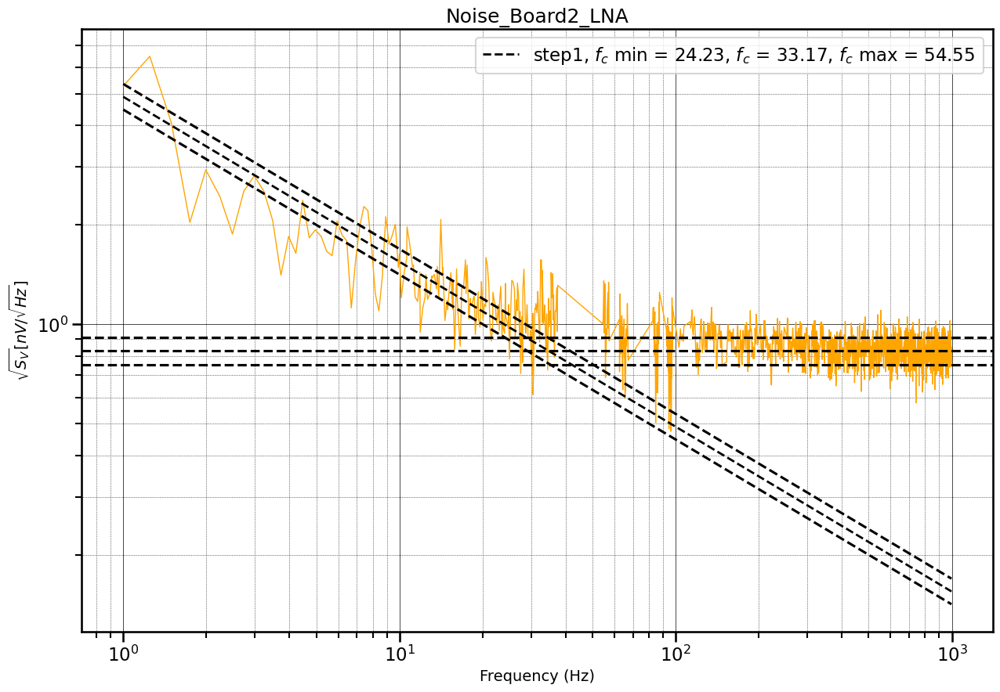

In [27]:
# n = 1
# num = [[1],[2],[3],[4],[5],[6]]
num = [[2]]
# num = [6]
# step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
step = ['step1']
# plt.figure(figsize = (15,10))
#-----------------
# f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
type = ['L']
for i in num:
        plot_noise_join_et_fit2(i,type,200,step,1,1)
#-----------------
# type = ['L']
# for i in num:
#         plot_noise_join_et_fit(i,type,step,0,0)
# #-----------------
# plt.savefig('fit_corner_example.png')

1.0702315363666532
 a= 41.736, b = 2151.2


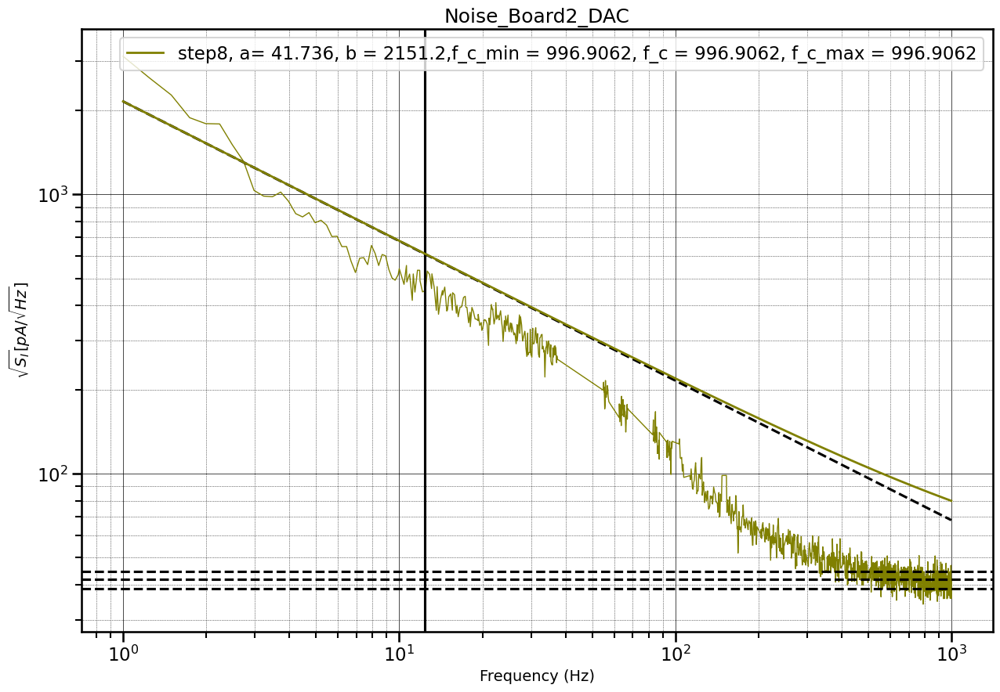

In [28]:
n = 2
num = [[n]]
# num = [6]
# step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
step = ['step8']
# plt.figure(figsize = (15,10))
#-----------------
# f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
type = ['D']
for i in num:
        plot_noise_join_et_fit2(i,type,50,step,1,1)
#-----------------
# type = ['L']
# for i in num:
#         plot_noise_join_et_fit(i,type,step,0,0)
# #-----------------

In [29]:
fc = [97.28,
34.16
,28.97
,27.48
,36.89
,37.38
,26.49
,33.17
,37.38
,35.16
,54.55
,32.93
,24.51
,36.39
,34.16
,34.41
,29.46
,54.55
,37.38
,37.38
,54.55
,54.55
,54.55
,193.15
,67.33
,203.05
,96.78
,32.43
,54.55
,102.81
,66.31
,37.38
,57.43
,54.55
,67.33
,67.33
,33.42]
error_plus =[34.58,
23.27
,25.58
,35.11
,17.66
,29.95
,28.06
,21.38
,29.95
,22.27
,28.13
,22.86
,12.87
,29.21
,30.45
,20.14
,25.09
,41.24
,29.95
,45.3
,49.5
,32.83
,12.78
,162.11
,86.84
,210.99
,88.33
,22.12
,42.73
,82.91
,68.06
,25.74
,27.47
,10.8
,35.48
,29.29
,21.13]
error_minus = [-14.6
,-11.63
,-9.41
,-3.96
,-8.67
,-11.82
,-9.9
,-8.94
,-11.91
,-11.39
,-23.85
,-9.9
,-7.92
,-13.61
,-12.62
,-8.66
,-10.64
,-17.17
,-13.36
,-9.65
,-23.11
,-18.16
,-20.88
,-30.94
,-29.95
,-62.49
,-33.16
,-10.89
,-19.15
,-35.48
,-28.93
,-2.97
,-2.88
,-1.,17
,-4.21
,-3.22
,-5.94]
num_to_sor = [1
,2
,3
,4
,5
,6              
,1
,2
,3
,4
,5
,6            
,1
,2
,3
,6
,3
,4
,3
,4
,5
,6
,3
,4
,3
,4
,5
,6
,2
,3
,5
,1
,2
,3
,4
,5
,6]
pos = [0
,0
,0
,0
,0
,0
,1
,1
,1
,1
,1
,1
,2
,2
,2
,2
,3
,3
,4
,4
,4
,4
,5
,5
,6
,6
,6
,6
,7
,7
,7
,8
,8
,8
,8
,8
,8      ]
# error_plus = np.array(fc_max) - np.array(fc)
# error_minus = np.array(fc_min) - np.array(fc)
print(num_to_sor)
num_to_sor = np.array(num_to_sor)
pos = np.array(pos)
print(len(num_to_sor))
print(len(pos))

[1, 2, 3, 4, 5, 6, 1, 2, 3, 4, 5, 6, 1, 2, 3, 6, 3, 4, 3, 4, 5, 6, 3, 4, 3, 4, 5, 6, 2, 3, 5, 1, 2, 3, 4, 5, 6]
37
37


In [30]:
# print(len(num_to_sor))
ind_board1 = np.where(num_to_sor == 1)[0]
ind_board2 = np.where(num_to_sor == 2)[0]
ind_board3 = np.where(num_to_sor == 3)[0]
ind_board4 = np.where(num_to_sor == 4)[0]
ind_board5 = np.where(num_to_sor == 5)[0]
print(ind_board5)
ind_board6 = np.where(num_to_sor == 6)[0]
# print(ind_board1)
fc = np.array(fc)
error_plus = np.array(error_plus)
error_minus = np.array(error_minus)
print(fc[ind_board1])
# fc_sor = fc[ind_board1] + fc[ind_board2] + fc[ind_board3] + fc[ind_board4] + fc[ind_board5] + fc[ind_board6]
# error_plus_sor = error_plus[ind_board1] + error_plus[ind_board2] + error_plus[ind_board3] + error_plus[ind_board4] + error_plus[ind_board5] + error_plus[ind_board6]
board1 = pos[ind_board1]
# print(board1/10 +1)
pos1 = pos
# print(pos[ind_board1])
position = np.concatenate((pos[ind_board1],pos[ind_board2],pos[ind_board3], pos[ind_board4], pos[ind_board5], pos[ind_board6]))
print(position)
position1 = [0 ,0.1, 0.2,0.8, 1, 1.1, 1.2, 1.7,1.8, 2, 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7,2.8, 3, 3.1, 3.3, 3.4, 3.5, 3.6,3.8, 4, 4.1, 4.4, 4.6, 4.7,4.8, 5, 5.1, 5.2, 5.4, 5.6,5.8]

[ 4 10 20 26 30 35]
[97.28 26.49 24.51 37.38]
[0 1 2 8 0 1 2 7 8 0 1 2 3 4 5 6 7 8 0 1 3 4 5 6 8 0 1 4 6 7 8 0 1 2 4 6 8]


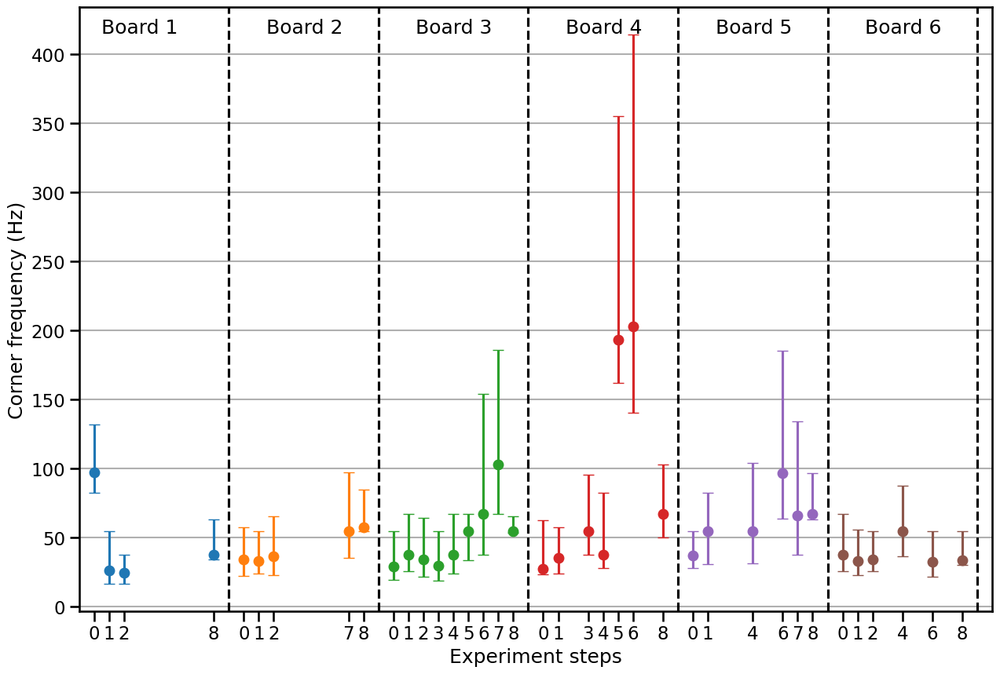

In [31]:
plt.figure(figsize = (15,10))
plt.errorbar(pos[ind_board1]/10,   fc[ind_board1], yerr=[np.abs(error_minus[ind_board1]),error_plus[ind_board1] ], fmt='o', capsize=5)
plt.errorbar(pos[ind_board2]/10+1, fc[ind_board2], yerr=[np.abs(error_minus[ind_board2]),error_plus[ind_board2] ], fmt='o', capsize=5)
plt.errorbar(pos[ind_board3]/10+2, fc[ind_board3], yerr=[np.abs(error_minus[ind_board3]),error_plus[ind_board3] ], fmt='o', capsize=5)
plt.errorbar(pos[ind_board4]/10+3, fc[ind_board4], yerr=[np.abs(error_minus[ind_board4]),error_plus[ind_board4] ], fmt='o', capsize=5)
plt.errorbar(pos[ind_board5]/10+4, fc[ind_board5], yerr=[np.abs(error_minus[ind_board5]),error_plus[ind_board5] ], fmt='o', capsize=5)
plt.errorbar(pos[ind_board6]/10+5, fc[ind_board6], yerr=[np.abs(error_minus[ind_board6]),error_plus[ind_board6] ], fmt='o', capsize=5)
plt.xticks(position1, position)
#Plot text
plt.text(0.05, 415, 'Board 1')
plt.text(1.15, 415, 'Board 2')
plt.text(2.15, 415, 'Board 3')
plt.text(3.15, 415, 'Board 4')
plt.text(4.15, 415, 'Board 5')
plt.text(5.15, 415, 'Board 6')

plt.axvline(x = 0.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 1.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 2.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 3.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 4.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 5.9, color = 'black', linestyle = 'dashed')
plt.xlabel('Experiment steps')
plt.ylabel(r'Corner frequency (Hz)')
# plt.title('LNA corner frequency for different steps')
plt.xlim(-0.1,6)
plt.gca().yaxis.grid(True)
plt.savefig('error_LNA_bar_corner_f.png')

##### join waveform 
def join_wave_form(DATA_DIR, step , board_number, type):
    dir_sv1 = f'board{board_number[0]}'

    def fit_curve(x,a,b):
        if type[0] == 'L':
            return np.sqrt(a**2 + (b*x**(-0.5))**2)
        elif type[0] == 'D' :
            # return (np.abs(a)+ (b*x**(-c)))
            a =  0
            return ((b*x**(-0.5)))

    
    
    f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    # f_peak1 = np.arange(10,120,1)
    # f_peak1 = np.array(f_peak1)
    # f_peak.extend(f_peak1)
    fl = 1000
    # step_arr = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
    step_arr = np.array(step)

    # print(step_arr)
    
    f_type = ['L','H']
    f_val = []
    val = []
    name = []
    for step in step_arr:
        f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, 'L')
        
        f2,val2, name2 = sort_data(DATA_DIR, step , board_number, type, 'H')
            #-------joining--------
        if len(f1) == 0 or len(f2) == 0:
            continue 
        else:
            #------ Masking -------
            f_join1,val_join1 = join(f1[0],f2[0],val1[0],val2[0])
            
            # f_join1,val_join1 = join(f1,f2,val1,val2)
            ind = find_nearest_frequency_indices(f_join1, f_peak)
            f_join1 = np.delete(f_join1,ind)
            val_join1 = np.delete(val_join1,ind)
            ind = np.where(f_join1<fl)
            f_join1 = f_join1[ind]
            val_join1 = val_join1[ind]
            val_join1 = val_join1
            f_val.append(f_join1)
            val.append(val_join1)
            name.append(step)
    return f_val,val,name

2. Fit with damien's propose

1581.4318529880384


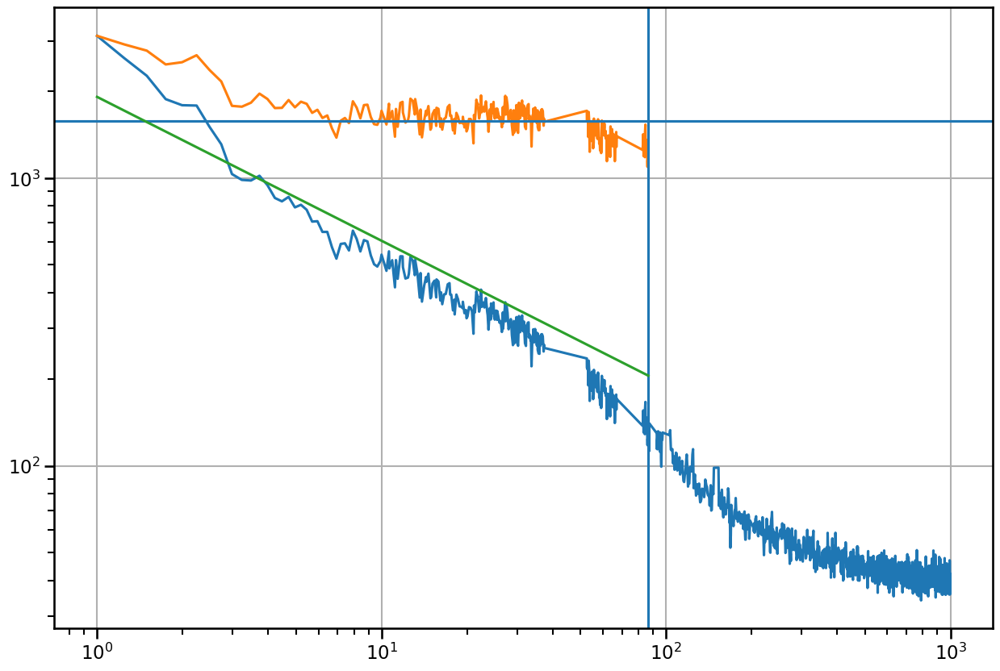

In [32]:
step = ['step8']
board_number = [2]
type = ['D']
f,value,name = join_wave_form(DATA_DIR, step , board_number, type)

#choose region to fit
beg = 300
f_to_fit = f[0][:beg]
f_max = f_to_fit[-1]

#mltiply the left side to sqrt f
value_new = []
for i in range(len(f_to_fit)):
    value_new.append(value[0][i] * np.sqrt(f_to_fit[i]))
    
# value averaging this one
val_mean = np.mean(value_new)
print(val_mean)
#fit it to the old line 
val_fit = np.ones(len(f_to_fit))
for i in range(len(val_fit)):
    val_fit[i] = val_fit[i] / np.sqrt(f_to_fit[i])

def func(a,x):
    return a*x
# x_val = val_fit
x_val = (val_fit)
y_val = (value[0][:beg])
# guess = ([6, -0.317])
popt, _ = curve_fit(func, x_val, y_val, maxfev=500000)
a = popt
# print(a)
# a = a +100

# print(value_new)
plt.figure(figsize = (15,10))
# plt.subplot(211)
plt.loglog(f[0],value[0])
#plotting the line after multuply by sqrt(f)
plt.loglog(f_to_fit,value_new)
#ploting the boundary
plt.axvline(x = f_max)
#plotting mean value of new line 
plt.axhline(y = val_mean)
#plotting new fit line
plt.loglog(f_to_fit,val_fit*a)      
# print(x_val)
# y = []
# for i in range(len(f[0])):
#     y.append(-0.75*np.log10(f[0][i]) + 3.5)
# plt.figure(figsize = (15,10))
# plt.subplot(211)
# plt.plot(np.log10(f[0]),np.log10(value[0]))                     
# # plt.plot(x_val, func(a,b,x_val))
# plt.plot(np.log10(f[0]), y)
# plt.grid()
# plt.subplot(212)
# plt.loglog(f[0],value[0])
plt.grid()

3. Starting with finding starting point of white noise

In [33]:
from scipy.stats import shapiro

def test_normality(data):
    # Perform Shapiro-Wilk test
    stat, p = shapiro(data)
    
    # Set the significance level
    alpha = 0.05
    
    # Compare p-value to the significance level
    if p > alpha:
        result = 1
    else:
        result = 0
    
    return result

In [34]:
step = ['step0']
board_number = [[1],[2],[3],[4],[5],[6]]
type = ['D','L']

# plt.loglog(f[0],value[0])
#choose region to fit
print('---------------')
print(f'Step {step[0][4]}')
for num in board_number:
    print('---------')
    print(f'Board {num} ')
    for typ in type:
        if typ == 'D':
            print('DAC')
        if typ == 'L':
            print('LNA')
        f,value,name = join_wave_form(DATA_DIR, step , num, typ)
        if f == []:
            continue
        else:
            for i in range(len(f[0])):
                dat_set = test_normality(value[0][i:-1])
                if dat_set == 1:
                    print(f'starting frequency = {round(f[0][i],0)} Hz')
                    print(f'mean value of white noise = {round(np.mean(value[0][i:-1]),2)}')
                    print(f'std of white noise = {round(np.std(value[0][i:-1]),2)}')
                    #test range from 300 to 1000
                    j = 625
                    print(f[0][j])
                    print(f'mean value of white noise = {round(np.mean(value[0][j:-1]),2)}')
                    print(f'std of white noise = {round(np.std(value[0][j:-1]),2)}')                    
                    print('-----------------------')
                    break 
                else:
                    continue
        print('----------')



---------------
Step 0
---------
Board [1] 
DAC
starting frequency = 292.0 Hz
mean value of white noise = 44.42
std of white noise = 7.43
303.2875
mean value of white noise = 44.38
std of white noise = 7.43
-----------------------
----------
LNA
starting frequency = 197.0 Hz
mean value of white noise = 0.86
std of white noise = 0.05
303.2875
mean value of white noise = 0.86
std of white noise = 0.05
-----------------------
----------
---------
Board [2] 
DAC
starting frequency = 678.0 Hz
mean value of white noise = 41.51
std of white noise = 4.91
303.2875
mean value of white noise = 43.44
std of white noise = 5.77
-----------------------
----------
LNA
starting frequency = 235.0 Hz
mean value of white noise = 0.83
std of white noise = 0.1
303.2875
mean value of white noise = 0.83
std of white noise = 0.1
-----------------------
----------
---------
Board [3] 
DAC
starting frequency = 415.0 Hz
mean value of white noise = 42.32
std of white noise = 5.61
303.2875
mean value of white noise

We can now perform a new code that distinguishe the flicker noise and white noise, then fit separately

In [35]:
def plot_noise_join_et_fit_new(board_number,type,step,des,fit):

#des = 1 if you want to show the grid at where we divide, fit = 1 if want to show the fit
    
    dir_sv1 = f'board{board_number[0]}'

    def fit_curve(x,a,b):
        if type[0] == 'L':
            return np.sqrt(a**2 + (b*x**(-0.5))**2)
        elif type[0] == 'D' :
            # return (np.abs(a)+ (b*x**(-c)))
            a =  0
            return ((b*x**(-0.5)))

    
    
    # f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    
    f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    # f_peak1 = np.arange(10,120,1)
    # f_peak1 = np.array(f_peak1)
    # f_peak.extend(f_peak1)
    
    # f_peak = [100000]
    fl = 800
    # step_arr = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
    step_arr = np.array(step)

    # print(step_arr)
    
    f_type = ['L','H']
    f_val = []
    val = []
    name = []
    for step in step_arr:
        f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, 'L')
        
        f2,val2, name2 = sort_data(DATA_DIR, step , board_number, type, 'H')
            #-------joining--------
        if len(f1) == 0 or len(f2) == 0:
            continue 
        else:
            #------ Masking -------
            f_join1,val_join1 = join(f1[0],f2[0],val1[0],val2[0])
            
            # f_join1,val_join1 = join(f1,f2,val1,val2)
            ind = find_nearest_frequency_indices(f_join1, f_peak)
            f_join1 = np.delete(f_join1,ind)
            val_join1 = np.delete(val_join1,ind)
            ind = np.where(f_join1<fl)
            f_join1 = f_join1[ind]
            val_join1 = val_join1[ind]
            val_join1 = val_join1
            f_val.append(f_join1)
            val.append(val_join1)
            name.append(step)
            
    
    plt.figure(figsize = (15,10))
    if type[0] == 'D':
        f = 'DAC'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Current noise density $i_n [A/\sqrt{Hz}]$')
    elif type[0] == 'L':
        f =  'LNA'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Voltage noise density $e_n [nV/ \sqrt{Hz}] $')   

        
    name1 =   f'Noise_Board{board_number[0]}_' + f 
    
    # guess = np.array([0,0,0.5])
    plt.title(f'{name1}')
    # if type[0] == 'D':
    #     plt.axhline(y = 10e-12*fac* 1e9, lw = 2)
    # elif type[0] == 'L':
    #     plt.axhline(y = 1e-9*fac*1e9, lw = 2)
        
    color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']
    # print(name)
    
    for i in range(len(name)):   
        val[i] = val[i]*fac
        col = color_band[int(name[i][4])]
        plt.plot(f_val[i],val[i],lw = 1, color = col)
    
        #---split--------
        #perform Shapio-Wilk test to find the begining point
        value_noise = []
        for j in range(len(f[0])):
            dat_set = test_normality(val[i][j:-1])
            if dat_set == 1:
                value_noise.append(j)
                break 
            else:
                continue
        print(value_noise)
        beg = value_noise[0]        
        
        
        fl = f_val[i][beg]
        ind = np.where(f_join1<fl)
        f_join = f_val[i][ind]
        val_join = val[i][ind]
        #flip
        # f_join = f_join[::1]
        # val_join = val_join[::1]
        #---fiting-------
        


        
        
        x_val = f_join
        y_val = val_join
        a_guest = np.mean(val[i][beg:-1])

        #------
        guess = np.array([a_guest, val[i][0]])
     
        a_values = []
        b_values = []

      #White noise array
        w_n = np.ones(len(f_val[i]))*a_guest
 
        for _ in range(100):
            popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)
            a, b = popt
            a_values.append(a)
            b_values.append(b)
        
            # Update guess with the values of a, b, and c for the next fit
            guess = np.array([a, b])

        
        # Perform any other operations using the updated values of a, b, and c
        # y_new = fit_curve(x_val,a,  b, c)
        f_mode = f_val[i][1:beg]
        y_new = fit_curve(f_mode,a,  b)
        # y_new = y_new[::1]
        
        # c = 0.5
        #Flicker noise array
        f_n = fit_curve(f_val[i], a, b) 
        
        t_n = np.sqrt(f_n**2 + w_n**2)
        
        #find f_c
        distances = np.abs(a_guest - fit_curve(f_val[i],a,  b))
        min_distance_index = np.argmin(distances)
        
        # fc = min_distance_index + 1  # Add 1 because the index is zero-based
        f_mode = f_val[i][min_distance_index]
        
        # print(np.size(t_n))
        if fit == 1:
            if type[0] == 'D':
                # plt.plot(f_val[i], t_n,lw = 2, zorder = 5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))} + {round(b, 3)} / f^{ {round(c, 3)} })^2 + {round(a_guest, 3)}^2}}$, fc = {f_mode} Hz")
                plt.plot(f_val[i], t_n,lw = 2, zorder = 5, color = col, label=f"{name[i]}, a= {round(a_guest,3)}, b = {round(b,3)}")
                
                if des == 1:
                    plt.axhline(y = a_guest,color = 'black',linestyle = 'dashed')
                    plt.axvline(x = f_val[i][beg], color = 'black')
                    # plt.plot(f_mode, y_new, color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], fit_curve(f_val[i],a,  b), color = 'black',linestyle = 'dashed')
                    print(f' a= {round(a_guest,3)}, b = {round(b,3)}')
                else:
                    continue 
    
            
            elif type[0] == 'L':
                distances = np.abs(np.ones(len(f_val[i]))*a - (b*f_val[i]**(-0.5)))
                min_distance_index = np.argmin(distances)
                # fc = min_distance_index + 1  # Add 1 because the index is zero-based
                f_mode = f_val[i][min_distance_index]
                
                # plt.plot(f_val[i], fit_curve(f_val[i], np.abs(a), b, c), lw=1, zorder=5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))}^2 + {round(b, 3)}^2 / f^{{2 \cdot {round(c, 3)}}})}}$")
                
                plt.plot(f_val[i], fit_curve(f_val[i], a, b), lw=2,color = col, zorder=5, label=f"{name[i]}, a= {round(a_guest,3)}, b = {round(b,3)} ")
                if des == 1:
                    plt.axhline(y = a, color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], (b*f_val[i]**(-0.5)), color = 'black',linestyle = 'dashed')
                    print(f' a= {round(a_guest,3)}, b = {round(b,3)}')
                else:
                    continue 
        else:
            plt.plot(f_val[i],val[i],lw = 1,color = col, label = f'{name[i]}')
    plt.xlabel('Frequency (Hz)')
    plt.xscale('log')
    plt.yscale('log')
    #plt.ylabel(f'{label}')
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # plt.savefig(f'plots/{dir_sv1}/{name}.png')

[]


IndexError: list index out of range

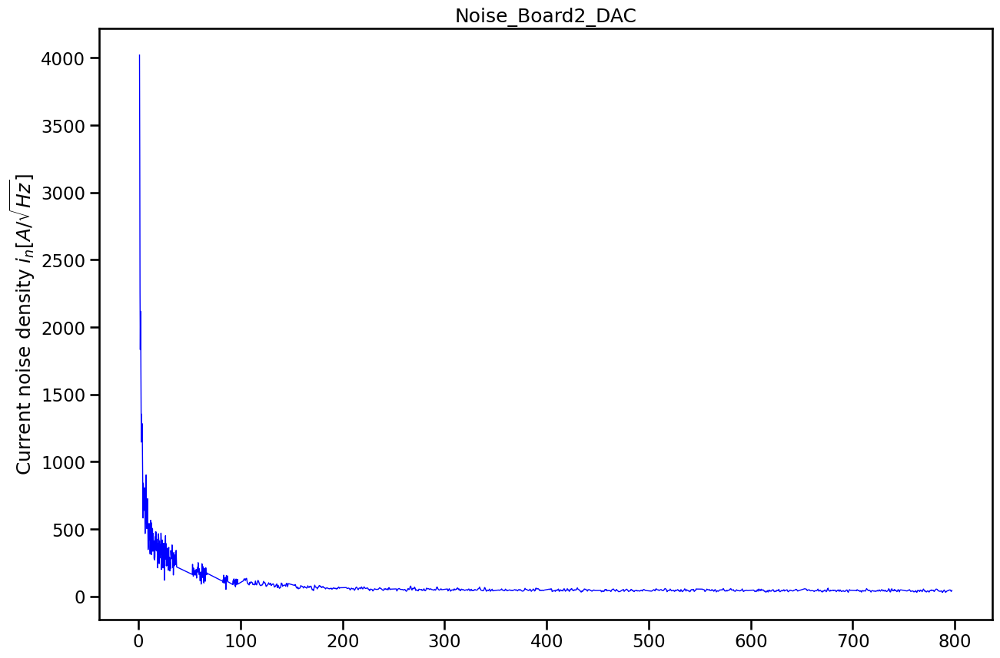

In [36]:
num = [[2]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit_new(i,type,step,0,0)
#-----------------
type = ['L']
for i in num:
        plot_noise_join_et_fit_new(i,type,step,0,0)
#-----------------

## Plot the error bar of white noise 

### Board 1 

In [ ]:
num_to_plot =  [0,1,3,4,7,8]
mean_board_1 = [44.42,43.46,62.84,50.13,95.55,42]
err_board1   = [7.43,6.16, 9.29,7.41, 19.91,3]

num_to_plot1_DAC     = num_to_plot
mean_board1_DAC     = mean_board_1
err_board1_DAC       = err_board1


plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_1, yerr=err_board1, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[pA/ \sqrt{Hz}]$')
plt.title('Error Bars Board 1 - DAC measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

plt.savefig('error_DAC_1.png')

In [ ]:
num_to_plot  = [0,1,2,8]
mean_board_1 = [0.86,0.87,0.87,0.95]
err_board1   = [0.05,0.12, 0.1,0.07]

num_to_plot1_LNA     = num_to_plot
mean_board1_LNA     = mean_board_1
err_board1_LNA       = err_board1

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_1, yerr=err_board1, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[nV/ \sqrt{Hz}]$')
plt.title('Error Bars Board 1 - LNA measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_LNA_1.png')

### Board 2

In [ ]:
num_to_plot = [0,1,3,4,7,8]
mean_board_2 = [41.51,43.79,40.97,41.08,40.6,42]
err_board2   = [4.91,6.22, 5.51,6.43, 7.72,3]

num_to_plot2_DAC = num_to_plot 
mean_board2_DAC =mean_board_2
err_board2_DAC  =  err_board2  
plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_2, yerr=err_board2, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[pA/ \sqrt{Hz}]$')
plt.title('Error Bars Board 2 - DAC measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_DAC_2.png')

In [ ]:
num_to_plot = [0,1,2,7,8]
mean_board_2 = [0.83,0.85,0.84,0.87,0.87]
err_board2   = [0.1,0.08, 0.11,0.12,0.07]

num_to_plot2_LNA= num_to_plot
mean_board2_LNA = mean_board_2
err_board2_LNA  = err_board2
plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_2, yerr=err_board2, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[nV/ \sqrt{Hz}]$')
plt.title('Error Bars Board 2 - LNA measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_LNA_2.png')

### Board 3

In [ ]:
num_to_plot = [0,1,3,4,5,6,7,8]
mean_board_3 = [42.32,42.28,61.83,46.43,39.76,39.5,45.15,40]
err_board3   = [5.61,5.54, 9.76,7.32, 5.21,6.81,7.56,3]

num_to_plot3_DAC = num_to_plot
mean_board3_DAC =mean_board_3
err_board3_DAC  =  err_board3

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_3, yerr=err_board3, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[pA/ \sqrt{Hz}]$')
plt.title('Error Bars Board 3 - DAC measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_DAC_3.png')

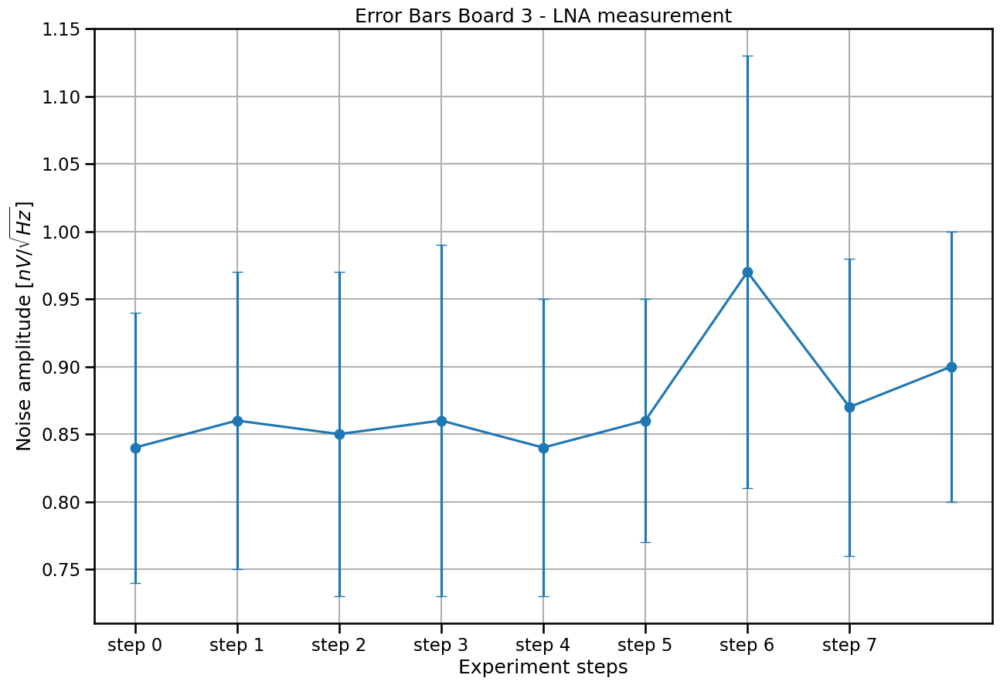

In [45]:
num_to_plot = [0,1,2,3,4,5,6,7,8]
mean_board_3 = [0.84,0.86,0.85,0.86, 0.84, 0.86, 0.97, 0.87,0.9]
err_board3   = [0.1,0.11,0.12, 0.13, 0.11, 0.09, 0.16, 0.11,0.1]



num_to_plot3_LNA = num_to_plot
mean_board3_LNA =mean_board_3
err_board3_LNA  =  err_board3

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_3, yerr=err_board3, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[nV/ \sqrt{Hz}]$')
plt.title('Error Bars Board 3 - LNA measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_LNA_3.png')

### Board 4

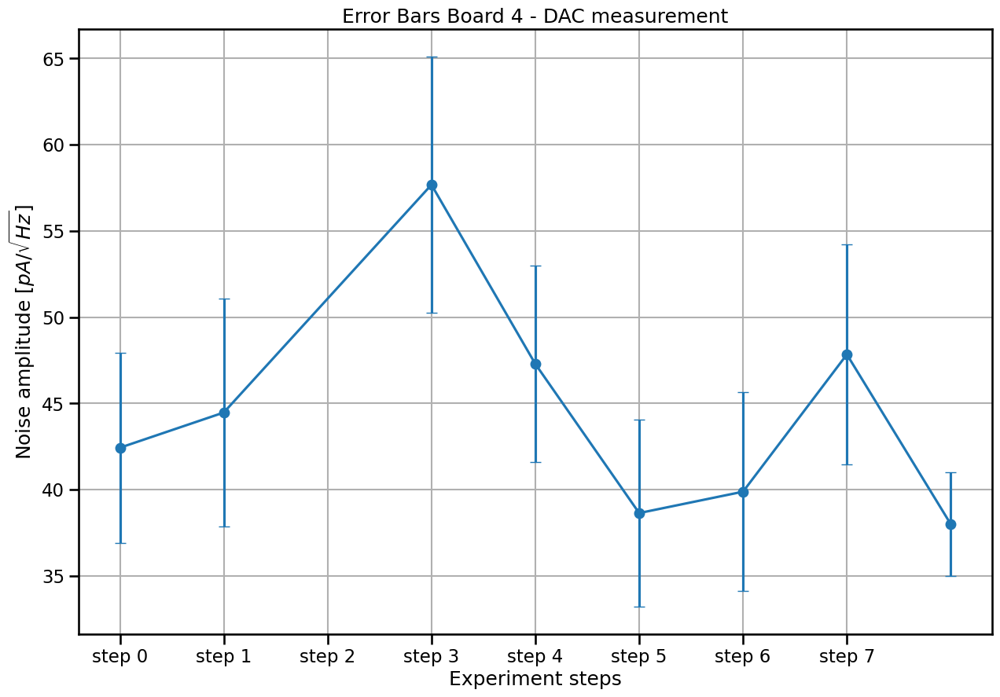

In [46]:
num_to_plot = [0,1,3,4,5,6,7,8]
mean_board_4 = [42.43,44.47,57.68,47.29,38.64,39.88,47.84,38]
err_board4   = [5.51,6.62,7.43,5.71,5.43,5.77,6.36,3]


num_to_plot4_DAC = num_to_plot
mean_board4_DAC =mean_board_4
err_board4_DAC  =  err_board4

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_4, yerr=err_board4, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[pA/ \sqrt{Hz}]$')
plt.title('Error Bars Board 4 - DAC measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_DAC_4.png')

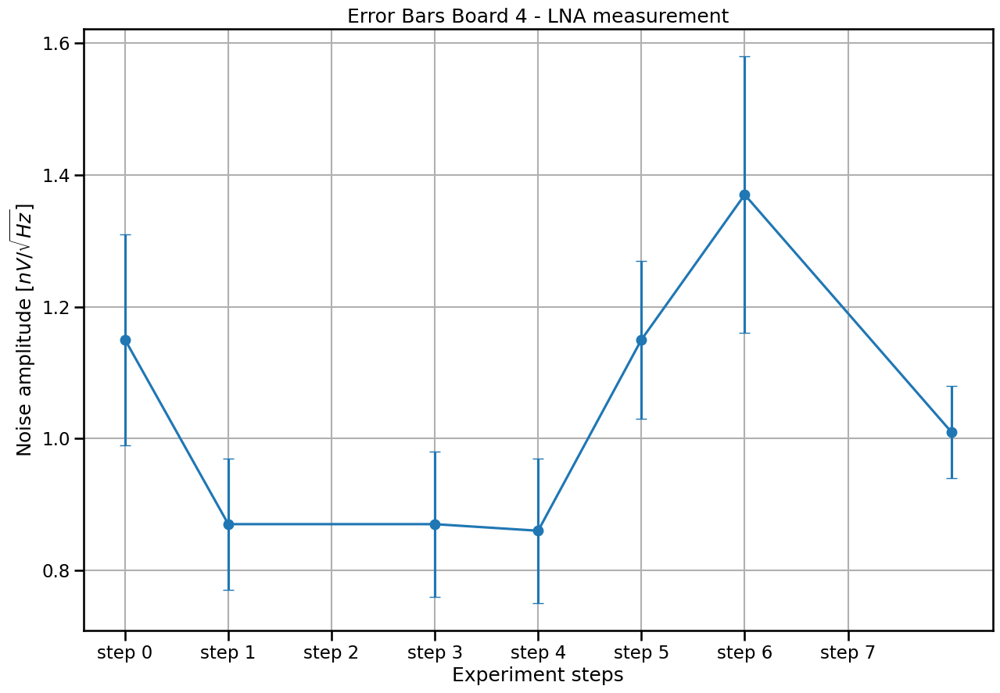

In [47]:
num_to_plot = [0,1,3,4,5,6,8]
mean_board_4 = [1.15,0.87,0.87,0.86,1.15,1.37,1.01]
err_board4   = [0.16,0.1,0.11,0.11,0.12,0.21,0.07]

num_to_plot4_LNA = num_to_plot
mean_board4_LNA =mean_board_4
err_board4_LNA  =  err_board4

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_4, yerr=err_board4, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[nV/ \sqrt{Hz}]$')
plt.title('Error Bars Board 4 - LNA measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_LNA_4.png')

### Board 5 

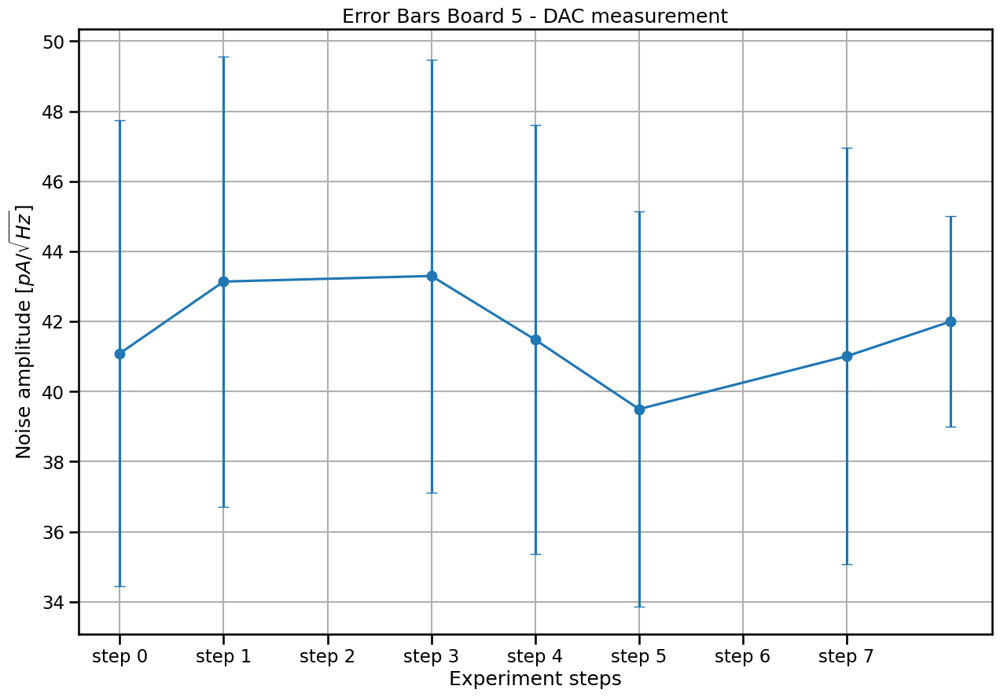

In [48]:
num_to_plot = [0,1,3,4,5,7,8]
mean_board_3 = [41.09,43.14,43.3,41.48,39.5,41.01,42]
err_board3   = [6.65,6.42,6.18,6.12,5.64,5.94,3]

num_to_plot5_DAC = num_to_plot
mean_board5_DAC =mean_board_3
err_board5_DAC  =  err_board3

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_3, yerr=err_board3, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[pA/ \sqrt{Hz}]$')
plt.title('Error Bars Board 5 - DAC measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_DAC_5.png')

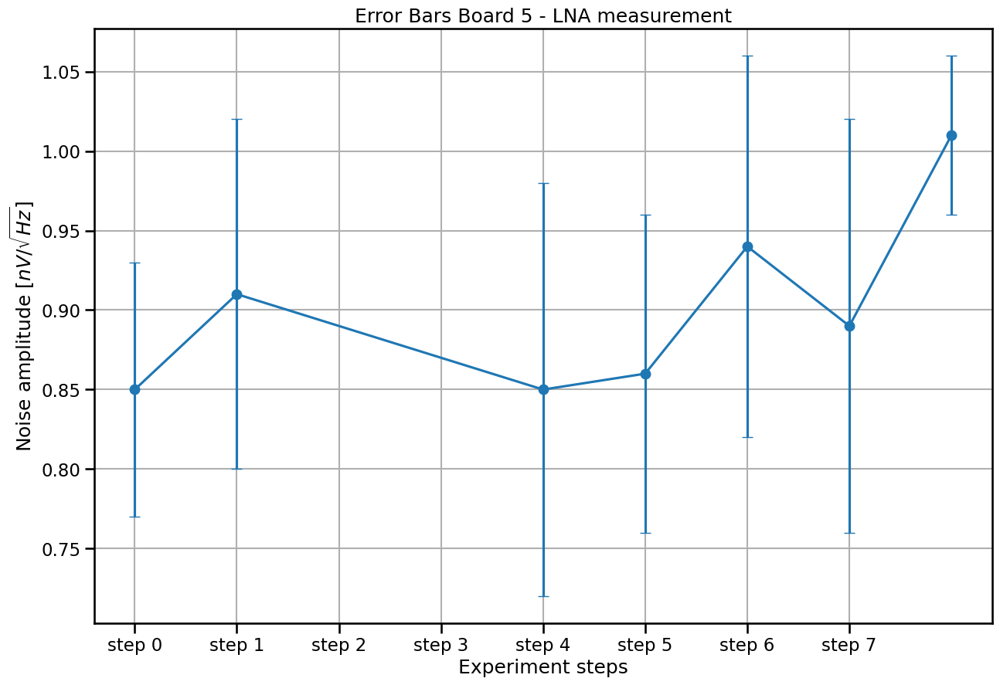

In [49]:
num_to_plot = [0,1,4,5,6,7,8]
mean_board_3 = [0.85,0.91,0.85,0.86,0.94,0.89,1.01]
err_board3   = [0.08,0.11,0.13,0.1,0.12,0.13,0.05]

num_to_plot5_LNA = num_to_plot
mean_board5_LNA =mean_board_3
err_board5_LNA  =  err_board3

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_3, yerr=err_board3, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[nV/ \sqrt{Hz}]$')
plt.title('Error Bars Board 5 - LNA measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_LNA_5.png')

### Board 6

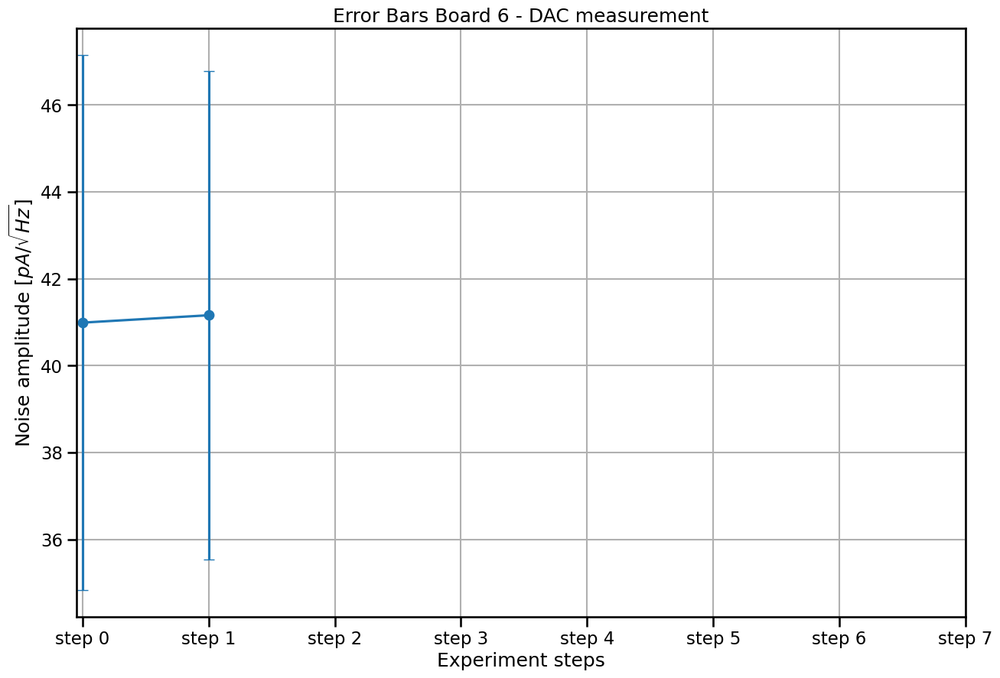

In [50]:
num_to_plot = [0,1]
mean_board_3 = [40.99,41.16]
err_board3   = [6.16,5.63]

num_to_plot6_DAC = num_to_plot
mean_board6_DAC =mean_board_3
err_board6_DAC  =  err_board3

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_3, yerr=err_board3, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[pA/ \sqrt{Hz}]$')
plt.title('Error Bars Board 6 - DAC measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_DAC_6.png')

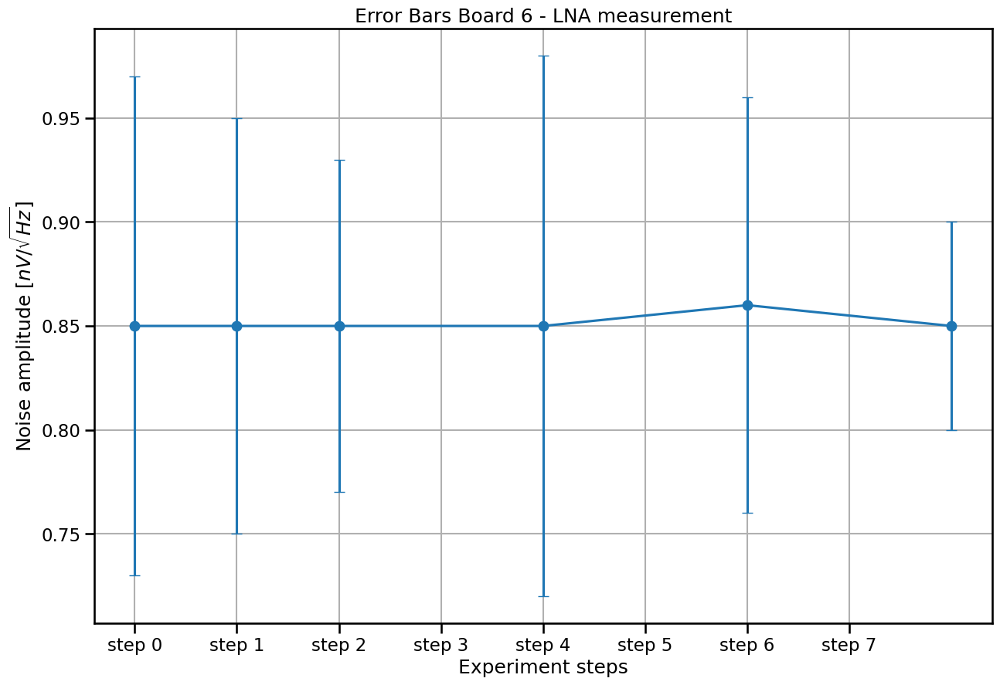

In [51]:
num_to_plot = [0,1,2,4,6,8]
mean_board_3 = [0.85,0.85,0.85,0.85,0.86,0.85]
err_board3   = [0.12,0.1 ,0.08,0.13,0.1,0.05 ]

num_to_plot6_LNA = num_to_plot
mean_board6_LNA =mean_board_3
err_board6_LNA  =  err_board3

plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot, mean_board_3, yerr=err_board3, fmt='o-', capsize=5)
plt.xlabel('Experiment steps')
plt.ylabel(r'Noise amplitude $[nV/ \sqrt{Hz}]$')
plt.title('Error Bars Board 6 - LNA measurement')
plt.xticks([0,1,2,3,4,5,6,7], ['step 0','step 1', 'step 2',  'step 3', 'step 4', 'step 5', 'step 6', 'step 7'])
plt.grid()

# plt.savefig('error_LNA_6.png')

### Join all into 1 plot 

In [52]:
### DAC
num_to_plot_DAC = num_to_plot1_DAC+num_to_plot2_DAC+num_to_plot3_DAC+num_to_plot4_DAC+num_to_plot5_DAC+num_to_plot6_DAC
print(num_to_plot_DAC)

NameError: name 'num_to_plot1_DAC' is not defined

In [37]:

num_to_plot = [0, 1, 3, 4, 7,8, 0, 1, 3, 4, 7,8, 0, 1, 3, 4, 5, 6, 7,8, 0, 1, 3, 4, 5, 6, 7,8, 0, 1, 3, 4, 5, 7,8, 0, 1]
num_to_plot1 = num_to_plot
text_to_plot = []

for num in num_to_plot:
    text = 'step ' + str(num)
    text_to_plot.append(text)
print(text_to_plot)
num_to_plot = np.array(num_to_plot)/10
color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']

num_to_plot= [0. , 0.1, 0.3, 0.4, 0.7,0.8, 1 , 1.1, 1.3, 1.4, 1.7,1.8, 2 , 2.1, 2.3,
       2.4, 2.5, 2.6, 2.7,2.8, 3 , 3.1, 3.3, 3.4, 3.5, 3.6, 3.7,3.8, 4. , 4.1,
       4.3, 4.4, 4.5, 4.7,4.8, 5. , 5.1] 
num_to_plot = np.array(num_to_plot)
ind_color1 = np.where(num_to_plot <6)[0]
ind_color2 = np.where(num_to_plot <5)[0]
ind_color3 = np.where(num_to_plot <4)[0]
ind_color4 = np.where(num_to_plot <3)[0]
ind_color5 = np.where(num_to_plot <2)[0]
ind_color6 = np.where(num_to_plot <1)[0]
print(ind_color1)
mean_board_DAC = mean_board1_DAC+mean_board2_DAC+mean_board3_DAC+mean_board4_DAC+mean_board5_DAC+mean_board6_DAC
mean_board_DAC = np.array(mean_board_DAC)
err_board_DAC = err_board1_DAC+err_board2_DAC+err_board3_DAC+err_board4_DAC+err_board5_DAC+err_board6_DAC
err_board_DAC = np.array(err_board_DAC)
plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot[ind_color1], mean_board_DAC[ind_color1], yerr=err_board_DAC[ind_color1], fmt='o',color = color_band[0], capsize=5)
plt.errorbar(num_to_plot[ind_color2], mean_board_DAC[ind_color2], yerr=err_board_DAC[ind_color2], fmt='o',color = color_band[1], capsize=5)
plt.errorbar(num_to_plot[ind_color3], mean_board_DAC[ind_color3], yerr=err_board_DAC[ind_color3], fmt='o',color = color_band[2], capsize=5)
plt.errorbar(num_to_plot[ind_color4], mean_board_DAC[ind_color4], yerr=err_board_DAC[ind_color4], fmt='o',color = color_band[3], capsize=5)
plt.errorbar(num_to_plot[ind_color5], mean_board_DAC[ind_color5], yerr=err_board_DAC[ind_color5], fmt='o',color = color_band[4], capsize=5)
plt.errorbar(num_to_plot[ind_color6], mean_board_DAC[ind_color6], yerr=err_board_DAC[ind_color6], fmt='o',color = color_band[5], capsize=5)
#Plot text
plt.text(0.05, 115, 'Board 1')
plt.text(1.15, 115, 'Board 2')
plt.text(2.15, 115, 'Board 3')
plt.text(3.15, 115, 'Board 4')
plt.text(4.15, 115, 'Board 5')
plt.text(5.15, 115, 'Board 6')
plt.xticks(num_to_plot, num_to_plot1)
plt.axvline(x = 0.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 1.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 2.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 3.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 4.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 5.9, color = 'black', linestyle = 'dashed')
plt.xlabel('Experiment steps')
plt.ylabel(r'$\sqrt{S_I}$ $[pA/ \sqrt{Hz}]$')
# plt.title('White noise in DAC measurement for different steps')
plt.xlim(-0.1,6)
plt.ylim(0,120)
plt.gca().yaxis.grid(True)
plt.savefig('error_DAC_bar.png')

['step 0', 'step 1', 'step 3', 'step 4', 'step 7', 'step 8', 'step 0', 'step 1', 'step 3', 'step 4', 'step 7', 'step 8', 'step 0', 'step 1', 'step 3', 'step 4', 'step 5', 'step 6', 'step 7', 'step 8', 'step 0', 'step 1', 'step 3', 'step 4', 'step 5', 'step 6', 'step 7', 'step 8', 'step 0', 'step 1', 'step 3', 'step 4', 'step 5', 'step 7', 'step 8', 'step 0', 'step 1']
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]


NameError: name 'mean_board1_DAC' is not defined

In [38]:
print(np.mean(mean_board_DAC))
print(np.mean( err_board_DAC))

NameError: name 'mean_board_DAC' is not defined

In [39]:
num_to_plot = num_to_plot1_LNA+num_to_plot2_LNA+num_to_plot3_LNA+num_to_plot4_LNA+num_to_plot5_LNA+num_to_plot6_LNA
num_to_plot1 = num_to_plot
text_to_plot = []
num_to_plot = [0.,  0.1, 0.2,0.8, 1.,  1.1, 1.2, 1.7,1.8, 2.,  2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7,2.8, 3. , 3.1, 3.3,
 3.4, 3.5, 3.6,3.8, 4.,  4.1, 4.4, 4.5, 4.6, 4.7,4.8, 5.,  5.1, 5.2, 5.4, 5.6,5.8]
for num in num_to_plot:
    text = 'step ' + str(num)
    text_to_plot.append(text)
print(text_to_plot)

color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']

print(num_to_plot)
num_to_plot = np.array(num_to_plot)
ind_color1 = np.where(num_to_plot <6)[0]
ind_color2 = np.where(num_to_plot <5)[0]
ind_color3 = np.where(num_to_plot <4)[0]
ind_color4 = np.where(num_to_plot <3)[0]
ind_color5 = np.where(num_to_plot <2)[0]
ind_color6 = np.where(num_to_plot <1)[0]
print(ind_color1)
mean_board_LNA = mean_board1_LNA+mean_board2_LNA+mean_board3_LNA+mean_board4_LNA+mean_board5_LNA+mean_board6_LNA
mean_board_LNA = np.array(mean_board_LNA)
err_board_LNA = err_board1_LNA+err_board2_LNA+err_board3_LNA+err_board4_LNA+err_board5_LNA+err_board6_LNA
err_board_LNA = np.array(err_board_LNA)
plt.figure(figsize = (15,10))
plt.errorbar(num_to_plot[ind_color1], mean_board_LNA[ind_color1], yerr=err_board_LNA[ind_color1], fmt='o',color = color_band[0], capsize=5)
plt.errorbar(num_to_plot[ind_color2], mean_board_LNA[ind_color2], yerr=err_board_LNA[ind_color2], fmt='o',color = color_band[1], capsize=5)
plt.errorbar(num_to_plot[ind_color3], mean_board_LNA[ind_color3], yerr=err_board_LNA[ind_color3], fmt='o',color = color_band[2], capsize=5)
plt.errorbar(num_to_plot[ind_color4], mean_board_LNA[ind_color4], yerr=err_board_LNA[ind_color4], fmt='o',color = color_band[3], capsize=5)
plt.errorbar(num_to_plot[ind_color5], mean_board_LNA[ind_color5], yerr=err_board_LNA[ind_color5], fmt='o',color = color_band[4], capsize=5)
plt.errorbar(num_to_plot[ind_color6], mean_board_LNA[ind_color6], yerr=err_board_LNA[ind_color6], fmt='o',color = color_band[5], capsize=5)
#Plot text
plt.text(0.05,  1.63, 'Board 1')
plt.text(1.15,  1.63, 'Board 2')
plt.text(2.15,  1.63, 'Board 3')
plt.text(3.15,  1.63, 'Board 4')
plt.text(4.15,  1.63, 'Board 5')
plt.text(5.15,  1.63, 'Board 6')
plt.xticks(num_to_plot, num_to_plot1)
plt.axvline(x = 0.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 1.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 2.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 3.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 4.9, color = 'black', linestyle = 'dashed')
plt.axvline(x = 5.9, color = 'black', linestyle = 'dashed')
plt.xlabel('Experiment steps')
plt.ylabel(r'$\sqrt{S_V}$ $[nV/ \sqrt{Hz}]$')
# plt.title('White noise in LNA measurement for different steps')
plt.xlim(-0.1,6)
plt.ylim(0,1.7)
plt.gca().yaxis.grid(True)
plt.savefig('error_LNA_bar.png')

NameError: name 'num_to_plot1_LNA' is not defined

In [40]:
print(np.mean(mean_board_LNA))
print(np.mean(err_board_LNA))

NameError: name 'mean_board_LNA' is not defined

## DAC noise simulation 

In [41]:
def noise1(f,fc,in_ref,in_white):
    a = in_ref/np.sqrt(f)
    b = in_white
    c = np.sqrt(1 + f/fc)
    return np.sqrt((a**2 + b**2)/c**2)


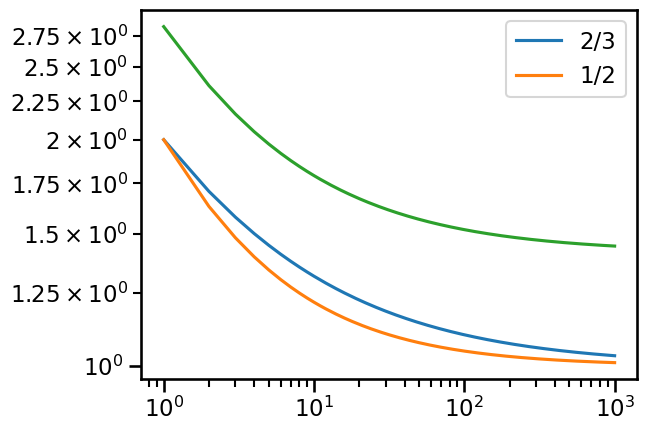

In [42]:
f = np.linspace(1,1000,1000)
func_a = (1 /f**(0.5) +1)
func_b = (1/ f**(2/3) +1)
plt.loglog(f,func_a, label = '2/3')
plt.loglog(f,func_b, label = '1/2')
plt.loglog(f,np.sqrt(func_a**2 + func_b**2))
plt.legend()

['step8']
----------
DAC
LNA


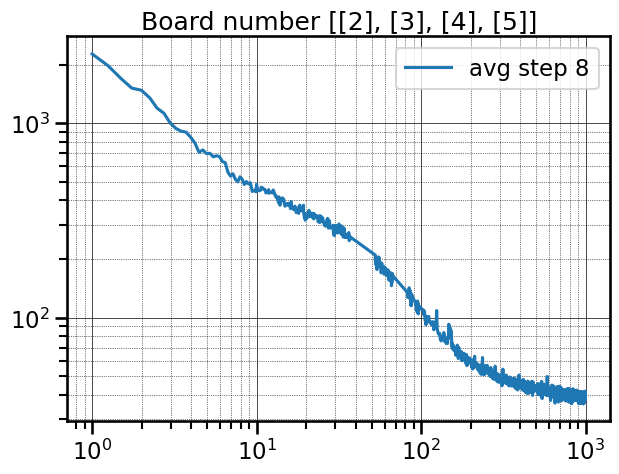

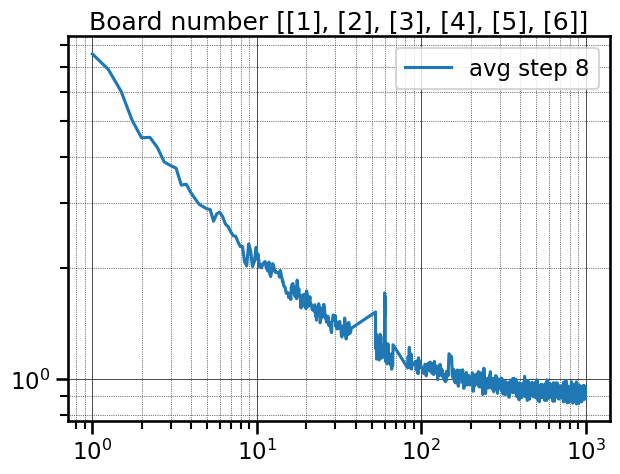

In [43]:
# Step 0: 
step = ['step8']
step1 = step
print(step)
print('----------')
# num = [[1],[2],[3],[5],[6]]
# board_number = [[3]]
type = ['D','L']
for typ in type:
    num = [[1],[2],[3],[4],[5],[6]]
    if typ == 'D':
        print('DAC')
        num = [[2],[3],[4],[5]]
        # num = [[2],[3]÷\,[4],[5]]
        
    elif typ == 'L':
        print('LNA')
        
    
    val_avg = np.zeros((1,1642))
    f_avg =   np.zeros((1,1642))
    # val_avg = np.array(val_avg)
    count = 0
    
    std = []
    for i in num:
        f,value,name = join_wave_form(DATA_DIR, step , i, typ)
        # print(f[0])
        if f == [] : 
            continue
        else:
            # print(value[0])
            std.append(value[0])
            value = np.array(value)
            val_avg += value
            f = np.array(f)
            f_avg += f
            count +=1
        
    val_avg = np.array(val_avg) / count
    f_avg = np.array(f_avg) / count
   
    plt.figure(figsize = (7,5))
    plt.title(f'Board number {num}')
    plt.loglog(f_avg[0],val_avg[0], label= f'avg step {step1[0][4]}' )
    # plt.loglog(f[0],val_8[0], label = 'ref')
    plt.legend()
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # print(f_avg[0])
    
#     # print(ind)
#     # print(ind)
#     print(count)
#     print(f'Board {num}')
#     ind = np.where(f_avg[0] < 3)[0]
#     print(f'Value around 1Hz = {np.round(np.mean(val_avg[0][ind]),3)} $\pm$ {np.round(np.std(val_avg[0][ind]),3)} ')
#     plt.axvline(x = 3)
    
#     ind = np.where(np.logical_and(f_avg[0] > 8, f_avg[0] < 12))[0]
#     print(f'Value around 10Hz = {np.round(np.mean(val_avg[0][ind]),3)} $\pm$  {np.round(np.std(val_avg[0][ind]),3)}')
#     plt.axvline(x = 8)
#     plt.axvline(x = 12)
#     ind = np.where(np.logical_and(f_avg[0] > 90, f_avg[0] < 102))[0]
#     print(f'Value around 100Hz = {np.round(np.mean(val_avg[0][ind]),3)} $\pm$ {np.round(np.std(val_avg[0][ind]),3)}')
#     plt.axvline(x = 90)
#     plt.axvline(x = 102)
#     ind = np.where(f_avg[0] > 950)[0]
#     print(f'Value around 1000Hz = {np.round(np.mean(val_avg[0][ind]),3)} $\pm$ {np.round(np.std(val_avg[0][ind]),3)}')
#     plt.axvline(x = 950)
#     print('------------------')
# # plt.axvline(x = f_avg[0][ind][-1])



# Remove white noise

In [44]:
def dat_conv(data, type):
    k = 1.38e-23
    T = 300
    noise = []
    
    if type == 'LNA':
        noise = [((a/80000)**2 - 4*k*T*25) for a in data]
        noise = np.array(noise)
        ind = np.where(noise > 0)
        noise = np.sqrt(noise[ind[0]])*1e9
        # noise = [a/80000 for a in data]
    elif type == 'DAC':
        noise = [((dat*1e12/500000)**2 - 4*k*T*(1e12)**2/500 - (6*1e3 /500)**2) for dat in data]
        noise = np.array(noise)
        ind = np.where(noise > 0)
        noise = np.sqrt(noise[ind[0]])
        # 1e3 to convert nV to pV, this factor was itself nV, don't need to convert from V to nV
        # noise = [(dat/500000) for dat in data]
        
    return noise,ind

def sort_data(DATA_DIR, step, number, type, f):
    DATA_DIR = str(DATA_DIR) + step + '/'
    DATA_DIR = Path(DATA_DIR)
    
    file_name = [f for f in os.listdir(DATA_DIR) if f.endswith('.TXT')]
    #print('done')
    # number: from 1 to  7 (number the board we use)
    # type: '['D'] for DAC, ['L'] for LNA, or ['D','L'] for both
    #f: ['L'] for low frequency, ['H'] for high frequency, ['L','H'] for both
    
    # DATA_path = 
    #Sort the name of file we want
    name_var = []
    for name in file_name:
        if name and name[2] in type and int(name[1]) in number and name[3] in f:
                name_var.append(name)
                #sort it by number
    name_var = sorted(name_var, key=lambda x: int(x[1]))
    #print(name_var)
    f_noise = []
    noise_val = []
    for i in range(len(name_var)):
        # Construct the full file path
        file_path = os.path.join(DATA_DIR, name_var[i])

        
        # Load the data from the file
        f_data, data = np.loadtxt(file_path, unpack=True, encoding='utf-8')
        f_noise.append(f_data)
        
        if name_var[i][2] == 'L':
            noise_val.append(dat_conv(data, 'LNA')[0])
            # print(noise_val)
            noise = np.array(f_noise)
            # print(f_noise)
            f_noise = f_noise[0][dat_conv(data, 'LNA')[1][0]]
            noise_val = noise_val[0]
        elif name_var[i][2] == 'D':
            noise_val.append(dat_conv(data, 'DAC')[0])
            # print(dat_conv(data, 'DAC')[1][0])
            noise_val = np.array(noise_val)
            # print(f_noise)
            f_noise = f_noise[0][dat_conv(data, 'DAC')[1][0]]
            noise_val = noise_val[0]
    # print(f'There are {len(name_var)} files in the sorted list, they are {name_var}')
    # print(f_noise)
    # print(noise_val)
    # print(name_var)
    return f_noise, noise_val, name_var
    # if noise_val[0] > 0: 
        # return f_noise, noise_val[0], name_var
    # else:
        # print('nah')

In [45]:
dose_rate = [0.036, 0.036, 0.035, 0.36, 36, 36]
total_dose = [6,12,18,36,100,200]

In [46]:
# def find_nearest_frequency_indices(f, f_specify):
#     indices = []
#     for f_value in f_specify:
#         if f_value < np.min(f) or f_value > np.max(f):
#             continue
#         nearest_index = np.where(np.logical_and(f >= f_value - 2.5, f <= f_value + 2.5))[0]
#         indices.extend(nearest_index)
#     return indices

# Ploting noise

In [47]:
def plot_noise(board_number,type,step,fre):

#des = 1 if you want to show the grid at where we divide, fit = 1 if want to show the fit
    
    dir_sv1 = f'board{board_number[0]}'
    
    # f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    f_peak = [100000]
    fl = 1000
    # step_arr = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
    step_arr = np.array(step)
    f_type = ['L','H']
    f_val = []
    val = []
    name = []
    for step in step_arr:
        f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, fre)
        f_val.append(f1)
        val.append(val1)
        name.append(name1)
   
    plt.figure(figsize = (15,10))
    if type[0] == 'D':
        ty = 'DAC'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Current noise density $i_n [pA/\sqrt{Hz}]$')
    elif type[0] == 'L':
        ty =  'LNA'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Voltage noise density $e_n [nV/ \sqrt{Hz}] $')   

    if fre == 'L':
        f = 'LF'
    elif fre == 'H':
        f = 'HF'
    name1 =   f'Noise measurement Board {board_number[0]} ' + ty + ' ' + f 
    
    # guess = np.array([0,0,0.5])
    plt.title(f'{name1}')
    # if type[0] == 'D':
    #     plt.axhline(y = 10e-12*fac* 1e9, lw = 2)
    # elif type[0] == 'L':
    #     plt.axhline(y = 1e-9*fac*1e9, lw = 2)
        
    color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']
    
    for i in range(len(name)):   
        if len(name[i]) == 0:
            continue
        else:
            # print(name[i][0])
            
            col = color_band[int(name[i][0][5])]
            plt.plot(f_val[i],val[i],lw = 1, color = col, label = f'Step {name[i][0][5]}')
    
 
    plt.xlabel('Frequency (Hz)')
    plt.xscale('log')
    plt.yscale('log')
    #plt.ylabel(f'{label}')
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # plt.savefig(f'plots/{dir_sv1}/{name1}.png')

In [48]:
num = [[1],[2],[3],[4],[5],[6]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7']
# plt.figure(figsize = (15,10))
#-----------------
type = ['L']
for i in num:
        plot_noise(i,type,step,'L')
#-----------------
type = ['L']
for i in num:
        plot_noise(i,type,step,'H')
# #-----------------
# type = ['L']
# for i in num:
#         plot_noise(i,type,step,'L')
# #-----------------
# type = ['L']
# for i in num:
#         plot_noise(i,type,step,'H')

AttributeError: 'numpy.ndarray' object has no attribute 'append'

# Fit

In [49]:
def find_nearest_frequency_indices(f, f_specify):
    indices = []
    for f_value in f_specify:
        if f_value < np.min(f) or f_value > np.max(f):
            continue
        nearest_index = np.where(np.logical_and(f >= f_value - 2.5, f <= f_value + 2.5))[0]
        indices.extend(nearest_index)
    return indices

In [88]:
def plot_noise_join_et_fit(board_number,type,step,des,fit):

#des = 1 if you want to show the grid at where we divide, fit = 1 if want to show the fit
    
    dir_sv1 = f'board{board_number[0]}'

    def fit_curve(x,a,b):
        if type[0] == 'L':
            return np.sqrt(a**2 + (b*x**(-0.5))**2)
        elif type[0] == 'D' :
            # return (np.abs(a)+ (b*x**(-c)))
            a =  0
            return ((b*x**(-0.5)))

    
    
    f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    # f_peak = [100000]
    fl = 1000
    # step_arr = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
    step_arr = np.array(step)
    f_type = ['L','H']
    f_val = []
    val = []
    name = []
    for step in step_arr:
        f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, 'L')
        f2,val2, name2 = sort_data(DATA_DIR, step , board_number, type, 'H')
            #-------joining--------
        if len(f1) == 0 or len(f2) == 0:
            continue 
        else:
            #------ Masking -------
            f_join1,val_join1 = join(f1,f2,val1,val2)
            # f_join1,val_join1 = join(f1,f2,val1,val2)
            ind = find_nearest_frequency_indices(f_join1, f_peak)
            f_join1 = np.delete(f_join1,ind)
            val_join1 = np.delete(val_join1,ind)
            ind = np.where(f_join1<fl)
            f_join1 = f_join1[ind]
            val_join1 = val_join1[ind]
            val_join1 = val_join1
            f_val.append(f_join1)
            val.append(val_join1)
            name.append(step)
            
    
    plt.figure(figsize = (15,10))
    if type[0] == 'D':
        f = 'DAC'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Current noise density $i_n [A/\sqrt{Hz}]$')
    elif type[0] == 'L':
        f =  'LNA'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Voltage noise density $e_n [nV/ \sqrt{Hz}] $')   

        
    name1 =   f'Noise_Board{board_number[0]}_' + f 
    
    # guess = np.array([0,0,0.5])
    plt.title(f'{name1}')
    # if type[0] == 'D':
    #     plt.axhline(y = 10e-12*fac* 1e9, lw = 2)
    # elif type[0] == 'L':
    #     plt.axhline(y = 1e-9*fac*1e9, lw = 2)
        
    color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']
    # print(name)
    
    for i in range(len(name)):   
        val[i] = val[i]*fac
        col = color_band[int(name[i][4])]
        plt.plot(f_val[i],val[i],lw = 1, color = col)
    
        #---split--------
        beg = 550 #starting point of white noise

        
        fl = f_val[i][beg]
        ind = np.where(f_join1<fl)
        f_join = f_val[i][ind]
        val_join = val[i][ind]
        #flip
        # f_join = f_join[::1]
        # val_join = val_join[::1]
        #---fiting-------
        


        
        
        x_val = f_join
        y_val = val_join
        a_guest = np.mean(val[i][beg:-1])

        #------
        guess = np.array([a_guest, val[i][0]])
     
        a_values = []
        b_values = []

      #White noise array
        w_n = np.ones(len(f_val[i]))*a_guest
 
        for _ in range(100):
            popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)
            a, b = popt
            a_values.append(a)
            b_values.append(b)
        
            # Update guess with the values of a, b, and c for the next fit
            guess = np.array([a, b])

        
        # Perform any other operations using the updated values of a, b, and c
        # y_new = fit_curve(x_val,a,  b, c)
        f_mode = f_val[i][1:beg]
        y_new = fit_curve(f_mode,a,  b)
        # y_new = y_new[::1]
        
        # c = 0.5
        #Flicker noise array
        f_n = fit_curve(f_val[i], a, b) 
        
        t_n = np.sqrt(f_n**2 + w_n**2)
        
        #find f_c
        distances = np.abs(a_guest - fit_curve(f_val[i],a,  b))
        min_distance_index = np.argmin(distances)
        
        # fc = min_distance_index + 1  # Add 1 because the index is zero-based
        f_mode = f_val[i][min_distance_index]
        
        # print(np.size(t_n))
        if fit == 1:
            if type[0] == 'D':
                # plt.plot(f_val[i], t_n,lw = 2, zorder = 5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))} + {round(b, 3)} / f^{ {round(c, 3)} })^2 + {round(a_guest, 3)}^2}}$, fc = {f_mode} Hz")
                plt.plot(f_val[i], t_n,lw = 2, zorder = 5, color = col, label=f"{name[i]}, a= {round(a_guest,3)}, b = {round(b,3)}")
                
                if des == 1:
                    plt.axhline(y = a_guest,color = 'black',linestyle = 'dashed')
                    plt.axvline(x = f_val[i][beg], color = 'black')
                    # plt.plot(f_mode, y_new, color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], fit_curve(f_val[i],a,  b), color = 'black',linestyle = 'dashed')
                    print(f' a= {round(a_guest,3)}, b = {round(b,3)}')
                else:
                    continue 
    
            
            elif type[0] == 'L':
                distances = np.abs(np.ones(len(f_val[i]))*a - (b*f_val[i]**(-0.5)))
                min_distance_index = np.argmin(distances)
                # fc = min_distance_index + 1  # Add 1 because the index is zero-based
                f_mode = f_val[i][min_distance_index]
                
                # plt.plot(f_val[i], fit_curve(f_val[i], np.abs(a), b, c), lw=1, zorder=5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))}^2 + {round(b, 3)}^2 / f^{{2 \cdot {round(c, 3)}}})}}$")
                
                plt.plot(f_val[i], fit_curve(f_val[i], a, b), lw=2,color = col, zorder=5, label=f"{name[i]}, a= {round(a_guest,3)}, b = {round(b,3)} ")
                if des == 1:
                    plt.axhline(y = a, color = 'black',linestyle = 'dashed')
                    plt.plot(f_val[i], (b*f_val[i]**(-0.5)), color = 'black',linestyle = 'dashed')
                    print(f' a= {round(a_guest,3)}, b = {round(b,3)}')
                else:
                    continue 
        else:
            plt.plot(f_val[i],val[i],lw = 1,color = col, label = f'{name[i]}')
    plt.xlabel('Frequency (Hz)')
    plt.xscale('log')
    plt.yscale('log')
    #plt.ylabel(f'{label}')
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # plt.savefig(f'plots/{dir_sv1}/{name}.png')

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/3197653923.py:109: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


 a= 42.82, b = 1804.069


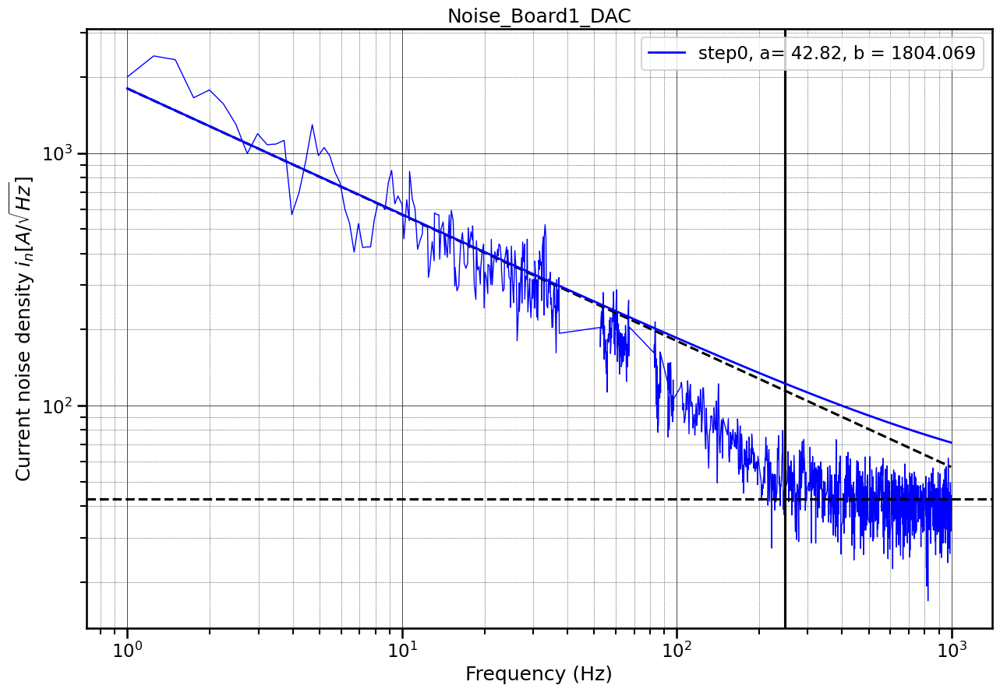

In [89]:
num = [[1]]
# num = [6]
step = ['step0']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,1,1)
        # plt.ylim(20,3000)

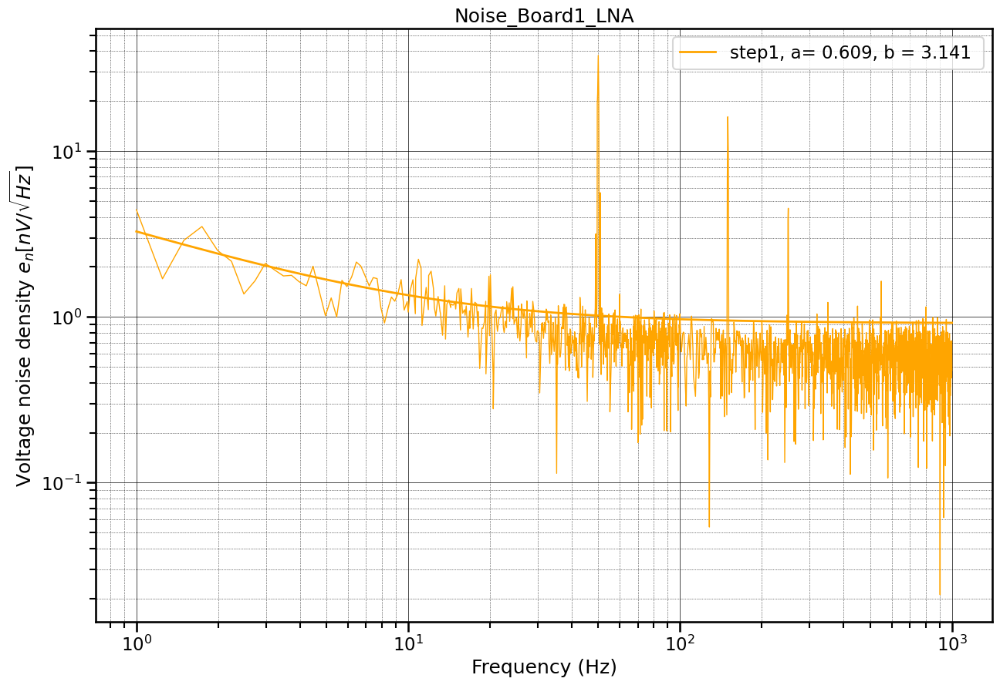

In [52]:
num = [[1]]
step = ['step1']
# plt.figure(figsize = (15,10))
#-----------------
type = ['L']
for i in num:
        plot_noise_join_et_fit(i,type,step,2,1)
        # plt.ylim(0.3,20)

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/428126519.py:109: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


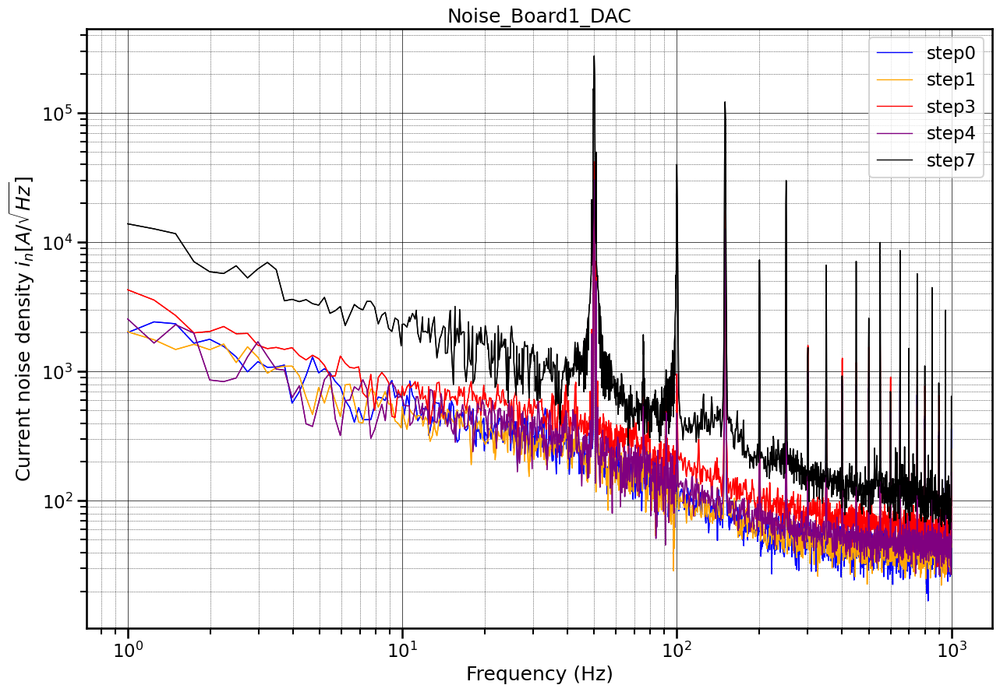

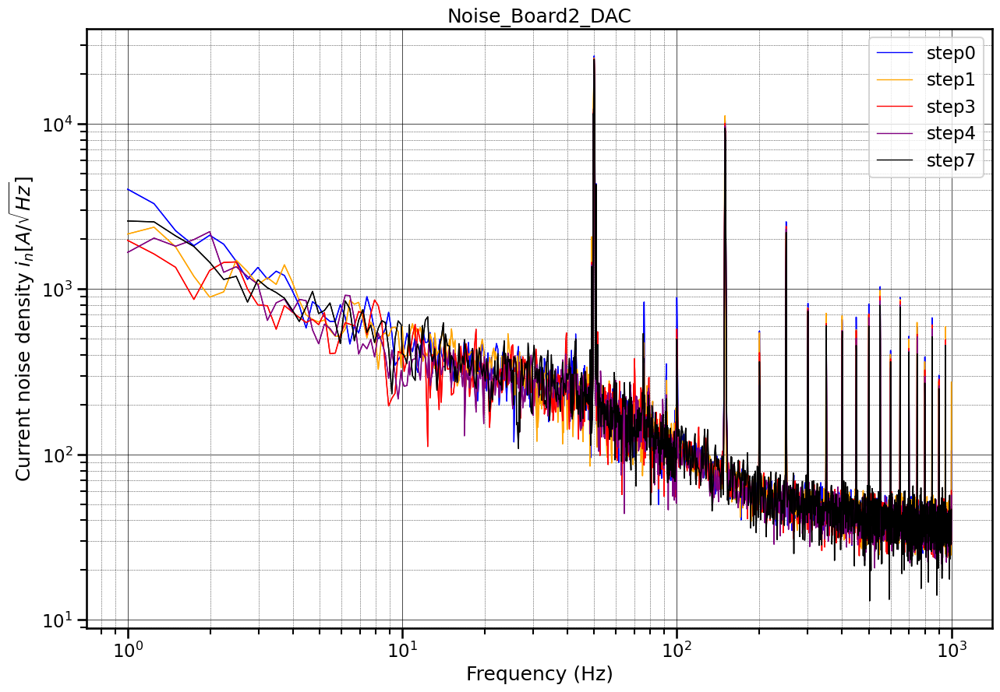

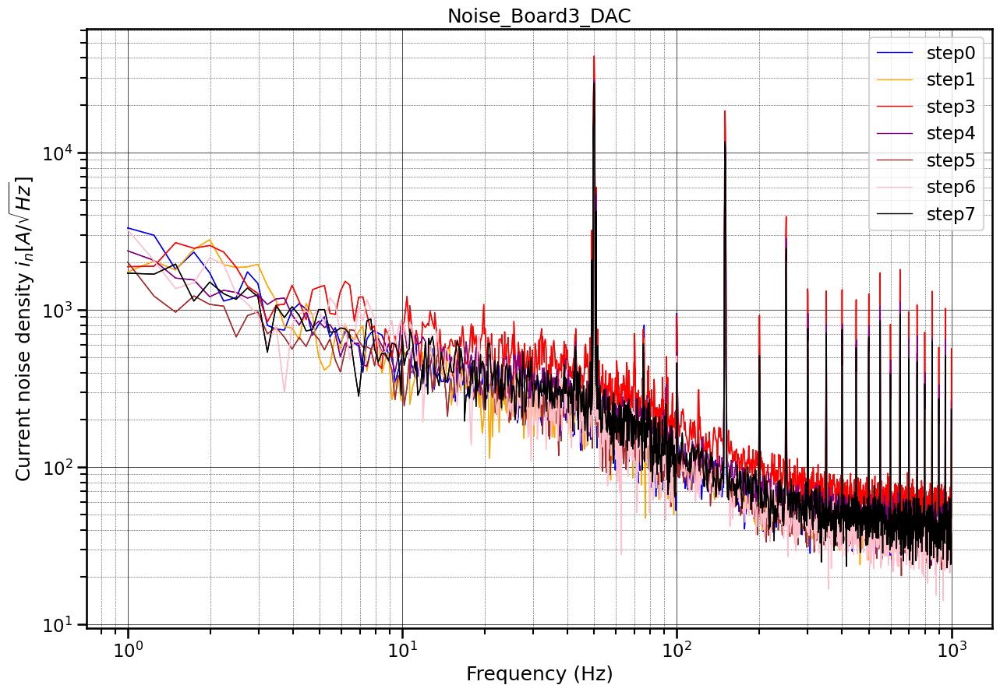

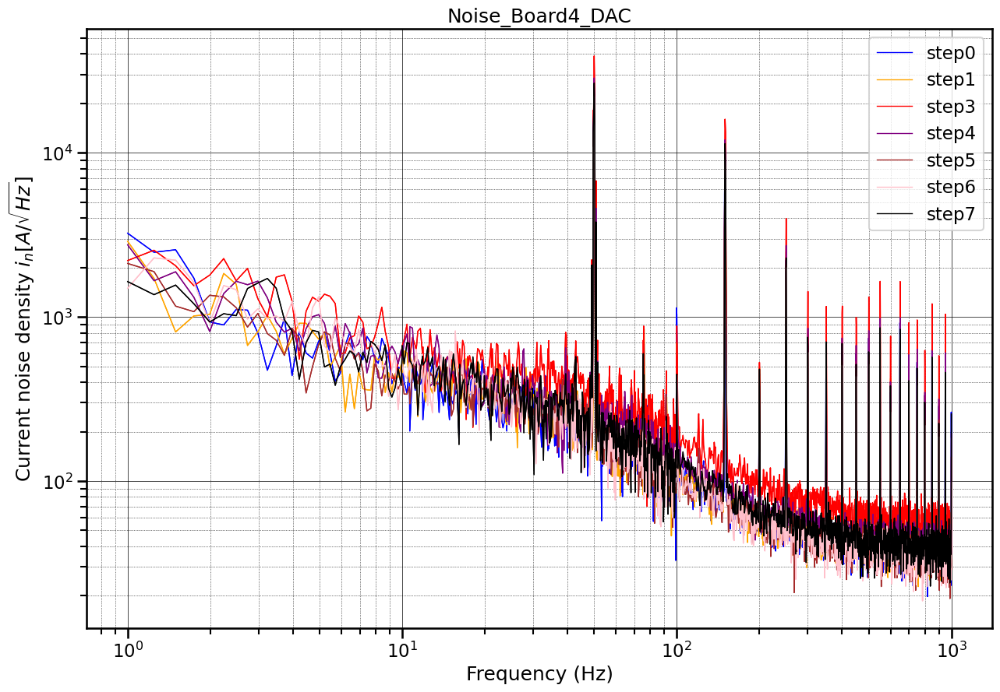

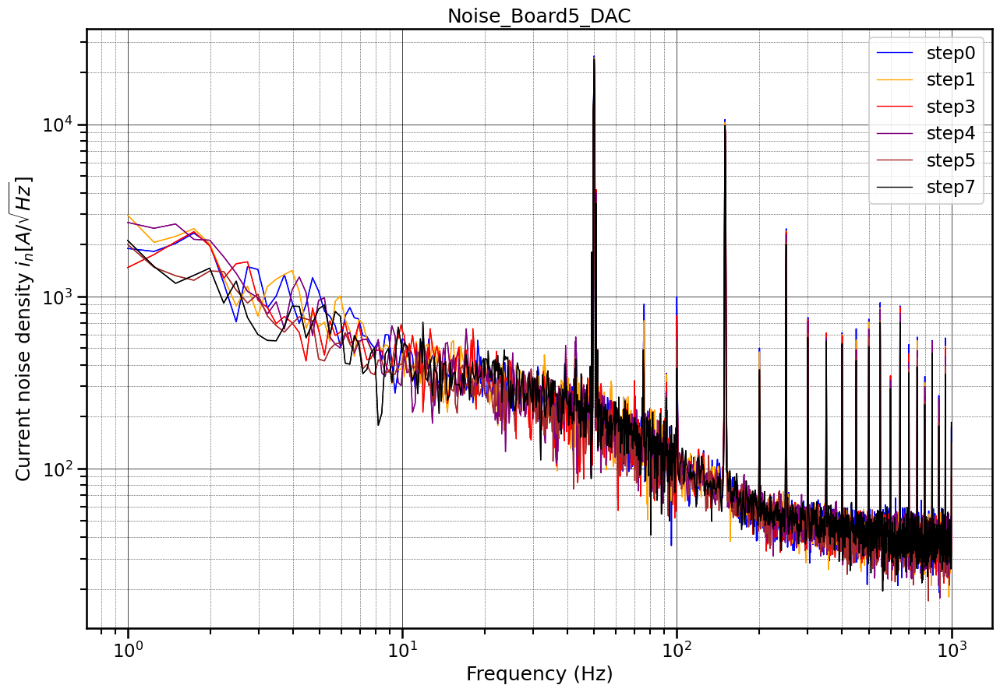

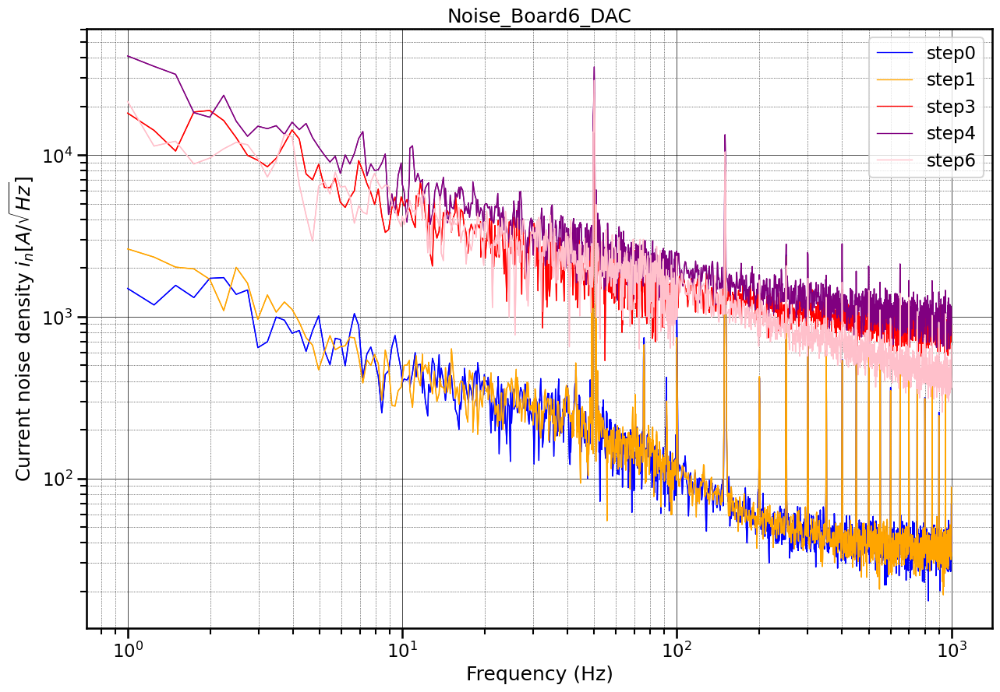

In [53]:
num = [[1],[2],[3],[4],[5],[6]]
# num = [6]
step = ['step0','step1','step2','step3','step4','step5','step6','step7']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,2,2)
        # plt.ylim(20,3000)
#-----------------
# f = np.linspace(1,1000,1000)
# a = 11.568
# b = 2190.975
# c = 0.68
# plt.loglog(f,fit_curve(f,a,b,c),lw=1, label=f"Test $\sqrt{{({round(a, 3)})^2 + ({round(b, 3)})^2 / f^{{2*{round(c, 3)}}}}}$")
# plt.legend()

## To try this fit, we use the data from step 8

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/428126519.py:109: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


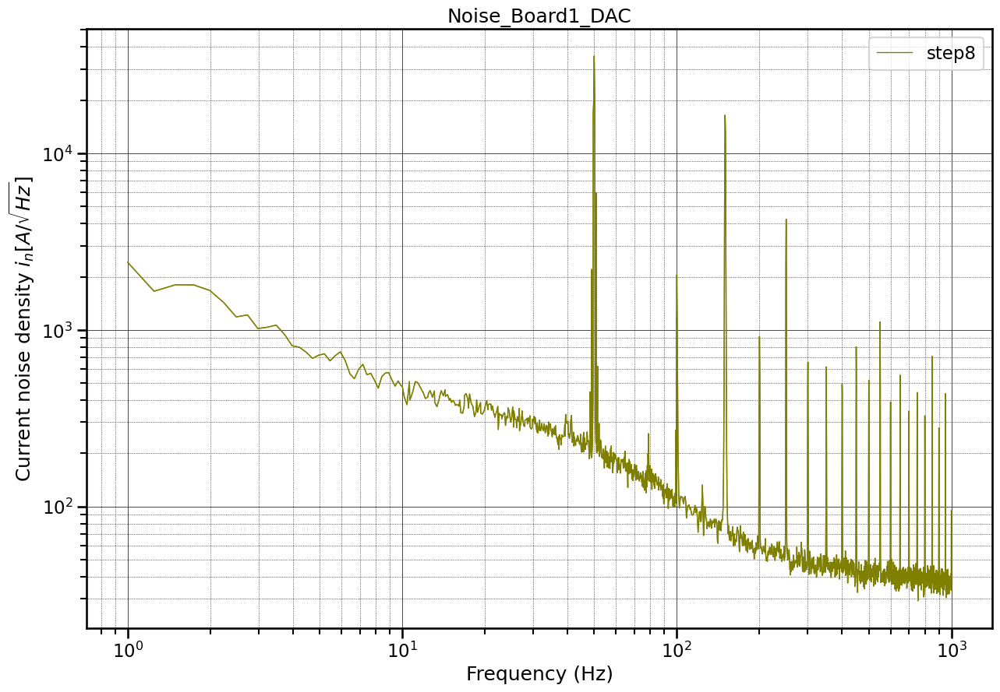

In [54]:
num = [[1]]
# num = [6]
step = ['step8']
# plt.figure(figsize = (15,10))
#-----------------
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)
#-----------------
# type = ['L']
# for i in num:
#         plot_noise_join_et_fit(i,type,step,0,0)

Lorenziant eqs

$$ S_{RTS}(f,\tau) = \frac{1}{4\pi} \frac{2/\tau}{(2 \pi f)^2 + (2/\tau)^2} $$

In [68]:
def curve_test(f,tau,K):
    return K*(1/(4*np.pi)) * (2 / tau)/((2*np.pi*f)**2+(2/tau)**2)
def flicker_line(f,A):
    return A/f
def white_line(f,Mag):
    return Mag * np.ones(np.size(f))

In [60]:
# f = np.linspace(1,1000,100000)
# tau1 = 2e-6
# tau2 = tau1*2
# tau3 = tau2*2
# plt.loglog(f,curve_test(f,tau1), label =f'tau = {tau1}')
# plt.loglog(f,curve_test(f,tau2), label =f'tau = {tau2}')
# plt.loglog(f,curve_test(f,tau3), label =f'tau = {tau3}')
# plt.axvline(x = 1 / (2*np.pi*tau1))
# plt.legend()

Overlay and try with the noise plot

/var/folders/v4/bwhrmml56zdgg4rlt5zykqp00000gp/T/ipykernel_62883/3197653923.py:109: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(fit_curve, x_val, y_val, guess, maxfev=500000)


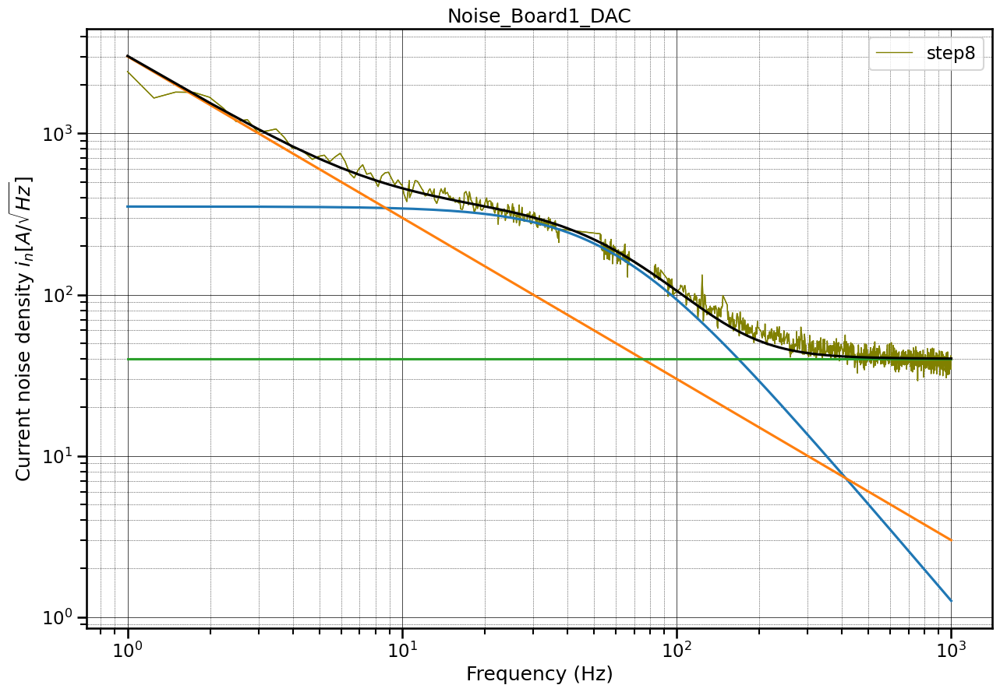

In [95]:
f = np.linspace(1,1000,1000)
num = [[1]]
# num = [6]
step = ['step8']
# plt.figure(figsize = (15,10))
#-----------------
fc = 30
tau = 1 /(2*np.pi*fc)
K = 5000000/3
A = 3000
Mag = 40
type = ['D']
for i in num:
        plot_noise_join_et_fit(i,type,step,0,0)

#Line def
L1 = curve_test(f,tau,K)
L2 = flicker_line(f,A)
L3 = white_line(f,Mag)
#plot
plt.loglog(f,L1)
plt.loglog(f,L2)
plt.loglog(f,L3)
plt.loglog(f,np.sqrt(L1**2+L2**2+L3**2), color = 'black')

In [ ]:
## Adding it to the fit function

In [135]:
def fit_DAC(board_number,type,step,params):

#des = 1 if you want to show the grid at where we divide, fit = 1 if want to show the fit
    
    dir_sv1 = f'board{board_number[0]}'

    def curve_test(f,tau,K):
        return K*(1/(4*np.pi)) * (2 / tau)/((2*np.pi*f)**2+(2/tau)**2)
    def flicker_line(f,A):
        return A/f
    def white_line(f,Mag):
        return Mag * np.ones(np.size(f))
    
    def func_tot(f,K,A,tau,Mag):
        return np.sqrt((K*(1/(4*np.pi)) * (2 / tau)/((2*np.pi*f)**2+(2/tau)**2))**2 + (A/f)**2 + (Mag * np.ones(np.size(f)))**2)
    
    f_peak = [40,45,50,70,75,80,90,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000]
    # f_peak = [100000]
    fl = 1000
    # step_arr = ['step0','step1','step2','step3','step4','step5','step6','step7','step8','step9']
    step_arr = np.array(step)
    f_type = ['L','H']
    f_val = []
    val = []
    name = []
    for step in step_arr:
        f1,val1, name1 = sort_data(DATA_DIR, step , board_number, type, 'L')
        f2,val2, name2 = sort_data(DATA_DIR, step , board_number, type, 'H')
            #-------joining--------
        if len(f1) == 0 or len(f2) == 0:
            continue 
        else:
            #------ Masking -------
            f_join1,val_join1 = join(f1,f2,val1,val2)
            # f_join1,val_join1 = join(f1,f2,val1,val2)
            ind = find_nearest_frequency_indices(f_join1, f_peak)
            f_join1 = np.delete(f_join1,ind)
            val_join1 = np.delete(val_join1,ind)
            ind = np.where(f_join1<fl)
            f_join1 = f_join1[ind]
            val_join1 = val_join1[ind]
            val_join1 = val_join1
            f_val.append(f_join1)
            val.append(val_join1)
            name.append(step)
            
    
    plt.figure(figsize = (15,10))
    if type[0] == 'D':
        f = 'DAC'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Current noise density $i_n [A/\sqrt{Hz}]$')
    elif type[0] == 'L':
        f =  'LNA'
        fac = 1
        # label = '$\sqrt{i_n^2 + \frac{4kT}{500} + (\frac{6nV/\sqrt{Hz}}{500})} [A/\sqrt{Hz}]$'
        plt.ylabel(r'Voltage noise density $e_n [nV/ \sqrt{Hz}] $')   

        
    name1 =   f'Noise_Board{board_number[0]}_' + f 
    
    # guess = np.array([0,0,0.5])
    plt.title(f'{name1}')
    # if type[0] == 'D':
    #     plt.axhline(y = 10e-12*fac* 1e9, lw = 2)
    # elif type[0] == 'L':
    #     plt.axhline(y = 1e-9*fac*1e9, lw = 2)
        
    color_band = ['blue','orange','green','red','purple','brown','pink','black','olive','cyan']
    # print(name)
    
    for i in range(len(name)):   
        val[i] = val[i]*fac
        col = color_band[int(name[i][4])]
        plt.plot(f_val[i],val[i],lw = 1, color = col,label=f"{name[i]}")
    
        #---split--------
        beg = 1000 #starting point of white noise
        
        
        fl = f_val[i][beg]
        ind = np.where(f_join1<fl)
        f_join = f_val[i][ind]
        val_join = val[i][ind]
        #flip
        # f_join = f_join[::1]
        # val_join = val_join[::1]
        #---fiting-------
        


        
        
        x_val = f_join
        y_val = val_join
        a_guest = np.mean(val[i][beg:-1])


        # Collect params for fitting
        d = a_guest
        print(d)
        a = params[0]
        b = params[1]
        c = params[2]

        #------
        guess = np.array([a,b,c,d])
        popt, _ = curve_fit(func_tot, x_val, y_val, guess, maxfev=500000)
        K,A,tau,Mag = popt

        
        
        #fit_line
        fit = func_tot(f_val[i], K,A,tau,Mag) 
        plt.plot(f_val[i],fit, color = 'black',linestyle = 'dashed')
        plt.axhline(y = a_guest,color = 'black',linestyle = 'dashed')
        
        
        # print(np.size(t_n))
        
    
            # plt.plot(f_val[i], t_n,lw = 2, zorder = 5, label=f"Board {board_number[0]}, {name[i]}. $\sqrt{{({np.abs(round(a, 3))} + {round(b, 3)} / f^{ {round(c, 3)} })^2 + {round(a_guest, 3)}^2}}$, fc = {f_mode} Hz")
            # plt.plot(f_val, val,lw = 2, zorder = 5, color = col, label=f"{name[i]}")
            
            #plt.axhline(y = a_guest,color = 'black',linestyle = 'dashed')
            # plt.axvline(x = f_val[i][beg], color = 'black')
            # plt.plot(f_mode, y_new, color = 'black',linestyle = 'dashed')
            # plt.plot(f_val,fit, color = 'black',linestyle = 'dashed')
            # print(f' a= {round(a_guest,3)}, b = {round(b,3)}')
            

        
        
    plt.xlabel('Frequency (Hz)')
    plt.xscale('log')
    plt.yscale('log')
    #plt.ylabel(f'{label}')
    plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
    # Customize the minor grid
    plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    plt.legend(loc = 'upper right')
    # plt.savefig(f'plots/{dir_sv1}/{name}.png')

39.20620723076962


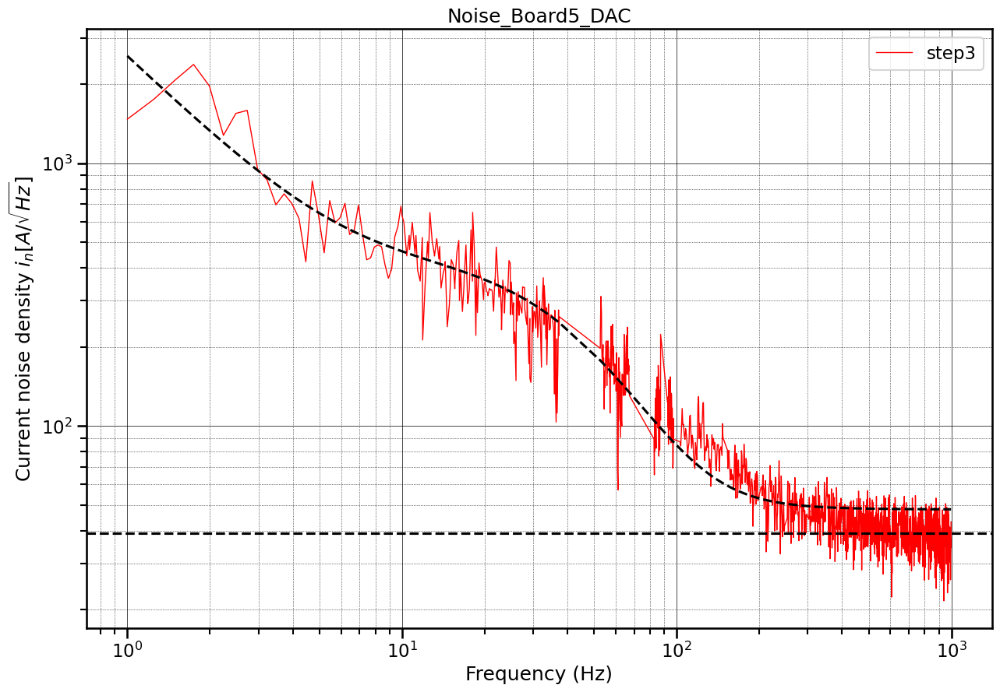

In [139]:
num = [[5]]
# num = [6]
step = ['step3']
# plt.figure(figsize = (15,10))
#-----------------
fc = 30
tau = 1 /(2*np.pi*fc)
K = 5000000/3
A = 3000
Mag = 40
params = [K,A,tau]
type = ['D']
for i in num:
        fit_DAC(i,type,step,params)